In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import os
import numpy as np

#RNN from scratch

### RNN with A Single Neuron

![alt txt](https://docs.google.com/drawings/d/e/2PACX-1vQXBLYvvI1dqAHdLA0hQdsP1PojmCfuSCMK2DXEL0uTvRUqvD1eYK8fsECcNCoekxCbgWJ-k7QF_1s4/pub?w=600&h=400)

And here is the code:

In [5]:
class BasicRNN(nn.Module):
    def __init__(self, n_inputs, n_neurons):
        super(BasicRNN, self).__init__()
        self.Wx = torch.randn(n_inputs, n_neurons)
        self.Wh = torch.randn(n_neurons, n_neurons)
        self.b = torch.zeros(1, n_neurons)

    def forward(self, X, h):
        y = torch.tanh(torch.mm(h, self.Wh) + torch.mm(X, self.Wx) + self.b)
        return y

And this is the code to test the model:

In [13]:
N_INPUT = 4
N_NEURONS = 5

X1 = torch.tensor([[0,1,2,0]],dtype = torch.float) #Sequence 1
X2 = torch.tensor([[9,8,7,0]],dtype = torch.float) #Sequence 2

# test the model...

model = BasicRNN(N_INPUT, N_NEURONS)

h0 = torch.zeros((1, N_NEURONS))
h1 = model(X1, h0)
h2 = model(X2, h1)


print(h1)
print(h2)

tensor([[ 0.3620, -0.9702,  0.9917, -0.1665, -0.2654]])
tensor([[ 1.0000,  1.0000, -0.9862, -1.0000,  1.0000]])


### RNN with 5 Neurons

![alt txt](https://docs.google.com/drawings/d/e/2PACX-1vQov6BGg1fXOb7Bg5zenPh7R5j6VsZJh_D6JevQ_sm_fCxmXORxad3qLIFGG1FojzJig0qdcAQoGYoN/pub?w=600&h=404)

In [ ]:
# test the model...

# RNN using nn.Linear

In [14]:
class RNNLinear(nn.Module):
    def __init__(self, n_inputs, n_neurons):
        super(RNNLinear, self).__init__()
        self.i2h = nn.Linear(n_inputs, n_neurons)
        self.h2h = nn.Linear(n_neurons, n_neurons)

    def forward(self, X, h):
        y = torch.tanh(self.i2h(X) + self.h2h(h))
        return y

In [16]:
# test the model...
N_INPUT = 4
N_NEURONS = 5

X1 = torch.tensor([[0,1,2,0]],dtype = torch.float) #Sequence 1
X2 = torch.tensor([[9,8,7,0]],dtype = torch.float) #Sequence 2

# test the model...

model = RNNLinear(N_INPUT, N_NEURONS)

h0 = torch.zeros((1, N_NEURONS))
h1 = model(X1, h0)
h2 = model(X2, h1)


print(h1)
print(h2)

tensor([[-0.6283, -0.5224,  0.1063,  0.6774,  0.4467]],
       grad_fn=<TanhBackward0>)
tensor([[ 0.5704, -1.0000, -0.9805, -0.2073, -0.9900]],
       grad_fn=<TanhBackward0>)


#PyTorch Built-in RNN Cell

In [19]:
# Create the input tensor: 2 batches, 4 sequences, 3 dimensions
X = torch.tensor([[
    [0, 1, 2],
    [3, 4, 5],
    [6, 7, 8],
    [9, 0, 1]],
    [[9, 8, 7],
    [0, 0, 0],
    [6, 5, 4],
    [3, 2, 1]]], dtype=torch.float)  # Shape: (2, 4, 3)

In [25]:
X.shape

torch.Size([2, 4, 3])

##nn.RNNCell()

In [31]:
# Define the RNN Cell
rnn = nn.RNNCell(3, 5)  # 3-input features, 5 hidden neurons

output = []
for i in range(2):  # Loop over batches
    state = []
    h = torch.zeros(5)  # Initialize hidden state
    for j in range(4):  # Loop over sequences
        print(f"Input for batch {i}, sequence {j}: {X[i, j, :]}")
        h = rnn(X[i, j, :], h)  # Update hidden state
        state.append(h)
    output.append(state)

Input for batch 0, sequence 0: tensor([0., 1., 2.])
Input for batch 0, sequence 1: tensor([3., 4., 5.])
Input for batch 0, sequence 2: tensor([6., 7., 8.])
Input for batch 0, sequence 3: tensor([9., 0., 1.])
Input for batch 1, sequence 0: tensor([9., 8., 7.])
Input for batch 1, sequence 1: tensor([0., 0., 0.])
Input for batch 1, sequence 2: tensor([6., 5., 4.])
Input for batch 1, sequence 3: tensor([3., 2., 1.])


In [32]:
print("Final output hidden states:")
print(output)

Final output hidden states:
[[tensor([-5.9187e-01, -8.7679e-01,  3.8836e-01,  7.2092e-04, -1.7598e-02],
       grad_fn=<SqueezeBackward1>), tensor([-0.1967, -0.9978,  0.9621,  0.9633, -0.7379],
       grad_fn=<SqueezeBackward1>), tensor([ 0.6061, -1.0000,  0.9989,  0.9982, -0.9760],
       grad_fn=<SqueezeBackward1>), tensor([ 0.9844, -0.6774,  0.9835,  0.9996, -0.9997],
       grad_fn=<SqueezeBackward1>)], [tensor([ 0.4698, -1.0000,  0.9999,  0.9998, -0.9976],
       grad_fn=<SqueezeBackward1>), tensor([-0.0999, -0.4415, -0.5080,  0.5425, -0.8531],
       grad_fn=<SqueezeBackward1>), tensor([ 0.5266, -0.9986,  0.9981,  0.9948, -0.9951],
       grad_fn=<SqueezeBackward1>), tensor([ 0.2823, -0.9055,  0.6664,  0.9748, -0.9879],
       grad_fn=<SqueezeBackward1>)]]


In [33]:
print(output[-1][-1])
print(h)

tensor([ 0.2823, -0.9055,  0.6664,  0.9748, -0.9879],
       grad_fn=<SqueezeBackward1>)
tensor([ 0.2823, -0.9055,  0.6664,  0.9748, -0.9879],
       grad_fn=<SqueezeBackward1>)


##nn.RNN()

In [8]:
rnn = nn.RNN(3, 5, batch_first=True)

# Pass the input through the RNN
output, h_n = rnn(X)  # output: (batch_size, sequence_length, hidden_size), h_n: (num_layers, batch_size, hidden_size)

print("Output shape:", output.shape)  # Should be (2, 4, 5)
print("Output:", output)

print("Final hidden states shape:", h_n.shape)  # Should be (num_layers, batch_size, hidden_size)
print("Final hidden states:", h_n)

print(output[:,-1,:])
print(h_n)

Output shape: torch.Size([2, 4, 5])
Output: tensor([[[ 0.2522, -0.6545, -0.7904, -0.2936,  0.5419],
         [-0.0318, -0.4553, -0.9898, -0.9967, -0.1604],
         [ 0.3656, -0.3533, -0.9985, -1.0000, -0.6654],
         [-0.9984,  0.9904, -0.9788, -0.9961, -0.8957]],

        [[-0.2060,  0.2825, -0.9998, -1.0000, -0.8308],
         [-0.6607,  0.1888, -0.0652,  0.5483, -0.2772],
         [-0.1598,  0.2084, -0.9965, -0.9999, -0.6070],
         [-0.8602,  0.6088, -0.8295, -0.8972, -0.7247]]],
       grad_fn=<TransposeBackward1>)
Final hidden states shape: torch.Size([1, 2, 5])
Final hidden states: tensor([[[-0.9984,  0.9904, -0.9788, -0.9961, -0.8957],
         [-0.8602,  0.6088, -0.8295, -0.8972, -0.7247]]],
       grad_fn=<StackBackward0>)
tensor([[-0.9984,  0.9904, -0.9788, -0.9961, -0.8957],
        [-0.8602,  0.6088, -0.8295, -0.8972, -0.7247]],
       grad_fn=<SliceBackward0>)
tensor([[[-0.9984,  0.9904, -0.9788, -0.9961, -0.8957],
         [-0.8602,  0.6088, -0.8295, -0.8972, -0.7

## RNN for Image Classification

![alt txt](https://docs.google.com/drawings/d/e/2PACX-1vSiMstqkE9hTYmhPD3KMeFRNNKYA2NnrCayahBOEL1TalRqaWF7rH8a7O-nP9c-mKOdZRsWtmAGZfNN/pub?w=969&h=368)


In [2]:
import torchvision
import torchvision.transforms as transforms

BATCH_SIZE = 64

# list all transformations
transform = transforms.Compose(
    [transforms.ToTensor()])

# download and load training dataset
trainset = torchvision.datasets.MNIST(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=BATCH_SIZE,
                                          shuffle=True, num_workers=2)

# download and load testing dataset
testset = torchvision.datasets.MNIST(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=BATCH_SIZE,
                                         shuffle=False, num_workers=2)

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9912422/9912422 [00:00<00:00, 16004150.90it/s]


Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28881/28881 [00:00<00:00, 489308.64it/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1648877/1648877 [00:00<00:00, 4346530.92it/s]


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4542/4542 [00:00<00:00, 10415816.71it/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



![alt txt](https://docs.google.com/drawings/d/e/2PACX-1vQWhELhewvq_bHgqwf4vwDb5B9DN9-jAxeTF9Y73zr-OsW6OXC-ngxAfojivXyZEhjzLXceTZU2Ncz3/pub?w=550&h=600)

In [3]:
N_STEPS = 28
N_INPUTS = 28
N_NEURONS = 150
N_OUTPUTS = 10
N_EPHOCS = 10

##Hand on

In [4]:
class ImageRNN(nn.Module):
    def __init__(self, batch_size, n_steps, n_inputs, n_neurons, n_outputs):
        super(ImageRNN, self).__init__()

        self.n_neurons = n_neurons
        self.batch_size = batch_size
        self.n_steps = n_steps
        self.n_inputs = n_inputs
        self.n_outputs = n_outputs

        #... nn.RNN + nn.Linear
        self.basic_rnn = nn.RNN(self.n_inputs,
                                self.n_neurons,
                                batch_first=True)

        self.FC = nn.Linear(self.n_neurons,
                            self.n_outputs)

    def forward(self, X):
        self.hidden = torch.zeros(1, X.size(0), self.n_neurons)
        #...
        output, self.hidden = self.basic_rnn(X, self.hidden)
        y = self.FC(self.hidden)

        return y.view(-1, self.n_outputs)

In [5]:
dataiter = iter(trainloader)
images, labels = next(dataiter)
## BATCH_SIZE = 64
model = ImageRNN(BATCH_SIZE, N_STEPS, N_INPUTS, N_NEURONS, N_OUTPUTS)
logits = model(images.view(-1, 28,28))
print(logits[:10])

tensor([[-0.0693,  0.0147, -0.0574, -0.0386,  0.1295,  0.0235,  0.1100, -0.0389,
          0.1379, -0.0524],
        [-0.0648,  0.0449, -0.0463, -0.0300,  0.1541,  0.0360,  0.1185, -0.0361,
          0.1295, -0.0588],
        [-0.0757,  0.0458, -0.0267, -0.0194,  0.1653,  0.0436,  0.1110, -0.0505,
          0.1231, -0.0553],
        [-0.0721,  0.0558, -0.0319, -0.0318,  0.1630,  0.0329,  0.1083, -0.0416,
          0.1063, -0.0507],
        [-0.0727,  0.0511, -0.0328, -0.0343,  0.1644,  0.0295,  0.1093, -0.0394,
          0.1073, -0.0550],
        [-0.0697,  0.0539, -0.0329, -0.0283,  0.1601,  0.0359,  0.1158, -0.0363,
          0.1155, -0.0529],
        [-0.0681,  0.0625, -0.0288, -0.0310,  0.1546,  0.0409,  0.1194, -0.0380,
          0.1079, -0.0490],
        [-0.0651,  0.0536, -0.0393, -0.0347,  0.1610,  0.0337,  0.1245, -0.0397,
          0.1090, -0.0513],
        [-0.0716,  0.0358, -0.0594, -0.0177,  0.1581,  0.0438,  0.1213, -0.0519,
          0.1347, -0.0751],
        [-0.0695,  

In [7]:
import torch.optim as optim

# Device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Model instance
model = ImageRNN(BATCH_SIZE, N_STEPS, N_INPUTS, N_NEURONS, N_OUTPUTS)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

def get_accuracy(logit, target, batch_size):
    ''' Obtain accuracy for training round '''
    corrects = (torch.max(logit, 1)[1].view(target.size()).data == target.data).sum()
    accuracy = 100.0 * corrects/batch_size
    return accuracy.item()

In [8]:
for epoch in range(N_EPHOCS):  # loop over the dataset multiple times
    train_running_loss = 0.0
    train_acc = 0.0
    model.train()

    # TRAINING ROUND
    for i, data in enumerate(trainloader):
         # zero the parameter gradients
        optimizer.zero_grad()

        # get the inputs
        inputs, labels = data
        inputs = inputs.view(-1, 28,28)

        # forward + backward + optimize
        outputs = model(inputs)

        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_running_loss += loss.detach().item()
        train_acc += get_accuracy(outputs, labels, BATCH_SIZE)

    model.eval()
    print('Epoch:  %d | Loss: %.4f | Train Accuracy: %.2f'
          %(epoch, train_running_loss / i, train_acc/i))

Epoch:  0 | Loss: 0.6436 | Train Accuracy: 79.36
Epoch:  1 | Loss: 0.2849 | Train Accuracy: 91.84
Epoch:  2 | Loss: 0.2255 | Train Accuracy: 93.60
Epoch:  3 | Loss: 0.1831 | Train Accuracy: 94.90
Epoch:  4 | Loss: 0.1662 | Train Accuracy: 95.33
Epoch:  5 | Loss: 0.1502 | Train Accuracy: 95.82
Epoch:  6 | Loss: 0.1384 | Train Accuracy: 96.11
Epoch:  7 | Loss: 0.1323 | Train Accuracy: 96.32
Epoch:  8 | Loss: 0.1207 | Train Accuracy: 96.63
Epoch:  9 | Loss: 0.1171 | Train Accuracy: 96.73


In [9]:
test_acc = 0.0
for i, data in enumerate(testloader, 0):
    inputs, labels = data
    inputs = inputs.view(-1, 28, 28)

    outputs = model(inputs)

    test_acc += get_accuracy(outputs, labels, BATCH_SIZE)

print('Test Accuracy: %.2f'%( test_acc/i))

Test Accuracy: 96.32


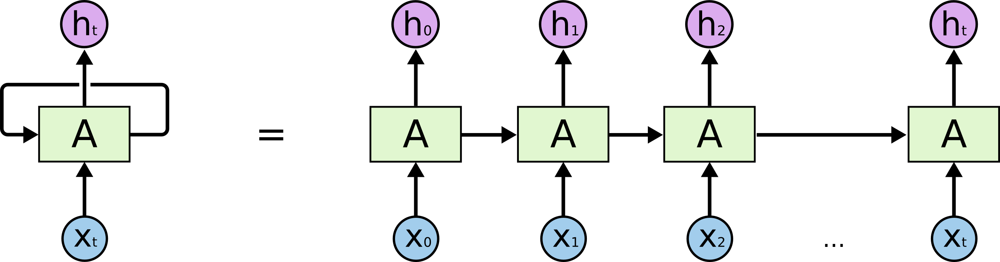

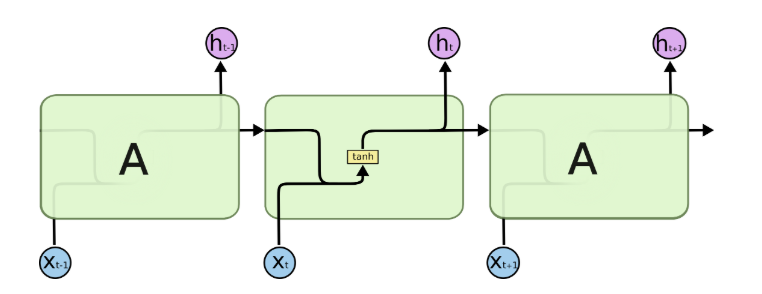

In [10]:
import matplotlib.pyplot as plt

#Example

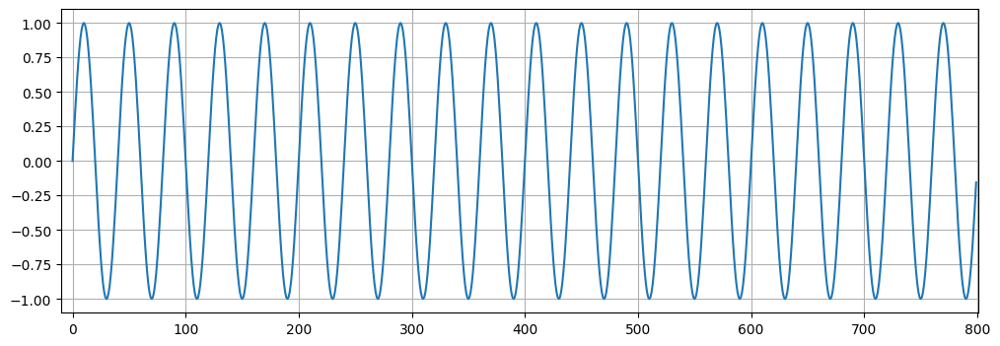

In [11]:
# Create & plot data points
x = torch.linspace(0,799,steps=800)
y = torch.sin(x*2*3.1416/40)

plt.figure(figsize=(12,4))
plt.xlim(-10,801)
plt.grid(True)
plt.plot(y.numpy());

In [12]:
test_size = 40

train_set = y[:-test_size]
test_set = y[-test_size:]

In [13]:
def input_data(seq,ws):  # ws is the window size
    out = []
    L = len(seq)
    for i in range(L-ws):
        window = seq[i:i+ws]
        label = seq[i+ws:i+ws+1]
        out.append((window,label))
    return out

In [14]:
window_size = 40

# Create the training dataset of sequence/label tuples:
train_data = input_data(train_set,window_size)

train_data[:3]

[(tensor([ 0.0000e+00,  1.5643e-01,  3.0902e-01,  4.5399e-01,  5.8779e-01,
           7.0711e-01,  8.0902e-01,  8.9101e-01,  9.5106e-01,  9.8769e-01,
           1.0000e+00,  9.8769e-01,  9.5106e-01,  8.9100e-01,  8.0901e-01,
           7.0710e-01,  5.8778e-01,  4.5398e-01,  3.0901e-01,  1.5643e-01,
          -7.2400e-06, -1.5644e-01, -3.0902e-01, -4.5400e-01, -5.8779e-01,
          -7.0711e-01, -8.0902e-01, -8.9101e-01, -9.5106e-01, -9.8769e-01,
          -1.0000e+00, -9.8769e-01, -9.5105e-01, -8.9100e-01, -8.0901e-01,
          -7.0710e-01, -5.8777e-01, -4.5398e-01, -3.0900e-01, -1.5642e-01]),
  tensor([1.4480e-05])),
 (tensor([ 1.5643e-01,  3.0902e-01,  4.5399e-01,  5.8779e-01,  7.0711e-01,
           8.0902e-01,  8.9101e-01,  9.5106e-01,  9.8769e-01,  1.0000e+00,
           9.8769e-01,  9.5106e-01,  8.9100e-01,  8.0901e-01,  7.0710e-01,
           5.8778e-01,  4.5398e-01,  3.0901e-01,  1.5643e-01, -7.2400e-06,
          -1.5644e-01, -3.0902e-01, -4.5400e-01, -5.8779e-01, -7.0711e-01

In [15]:
class RNN(nn.Module):
    def __init__(self, input_size=1, hidden_size=50, out_size=1):
        super().__init__()
        self.hidden_size = hidden_size
        self.rnn = nn.RNN(input_size,hidden_size,batch_first=True)
        self.linear = nn.Linear(hidden_size,out_size)

    def forward(self,seq):
        hidden = torch.zeros(1,1,self.hidden_size)
        rnn_out, hidden = self.rnn(
            seq.view( 1,len(seq), -1), hidden)
        pred = self.linear(rnn_out.view(len(seq),-1))
        return pred[-1]   # we only care about the last prediction


Epoch:  1 Loss: 0.00002700
Loss on test predictions: 0.030966948717832565


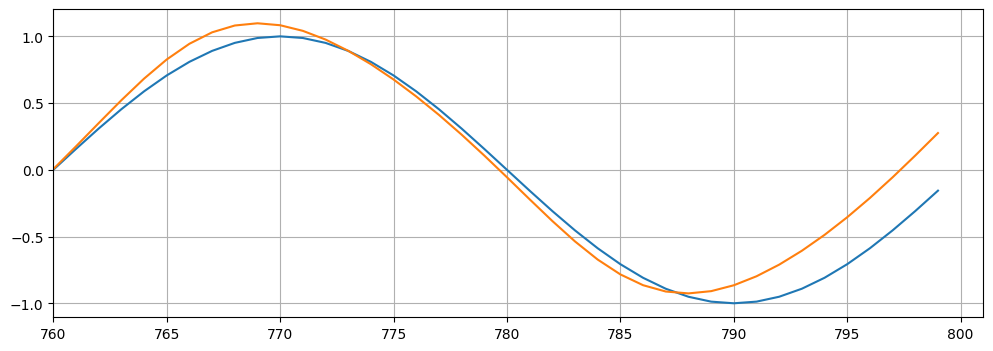

Epoch:  2 Loss: 0.00003431
Loss on test predictions: 0.021986693143844604


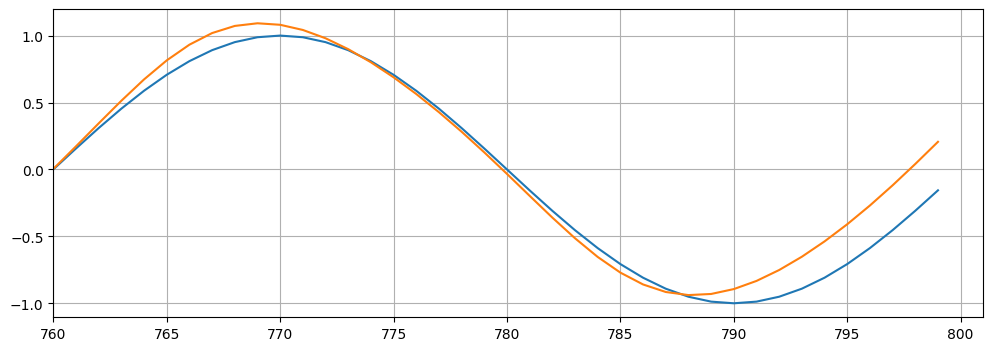

Epoch:  3 Loss: 0.00004066
Loss on test predictions: 0.015901360660791397


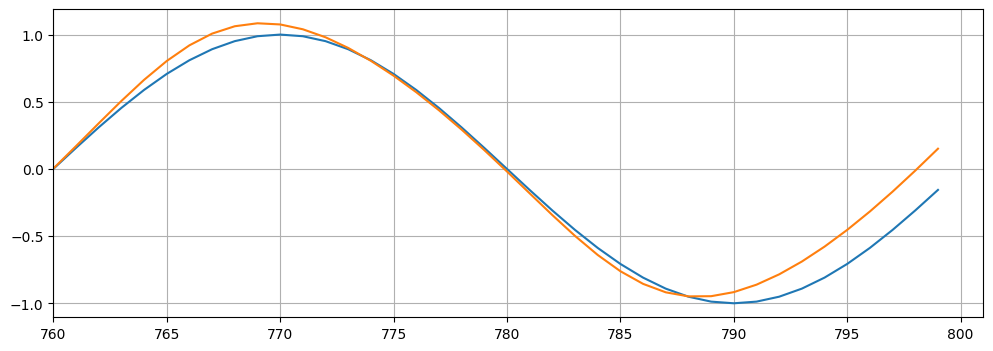

Epoch:  4 Loss: 0.00004563
Loss on test predictions: 0.011567818932235241


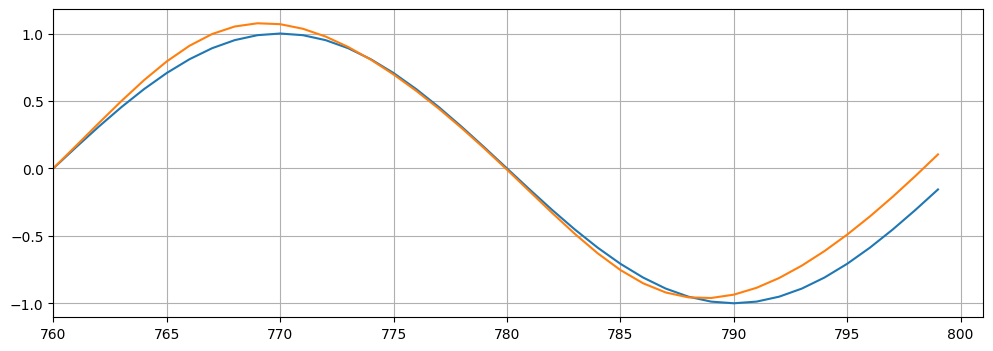

Epoch:  5 Loss: 0.00004925
Loss on test predictions: 0.008459536358714104


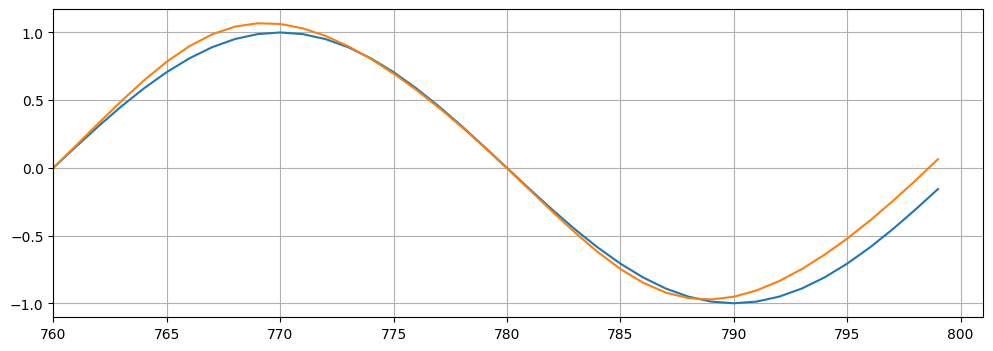

Epoch:  6 Loss: 0.00005161
Loss on test predictions: 0.006220941431820393


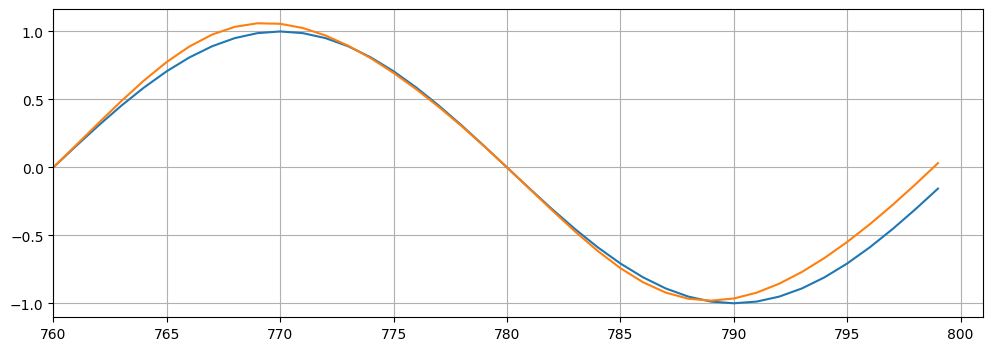

Epoch:  7 Loss: 0.00005284
Loss on test predictions: 0.004605452064424753


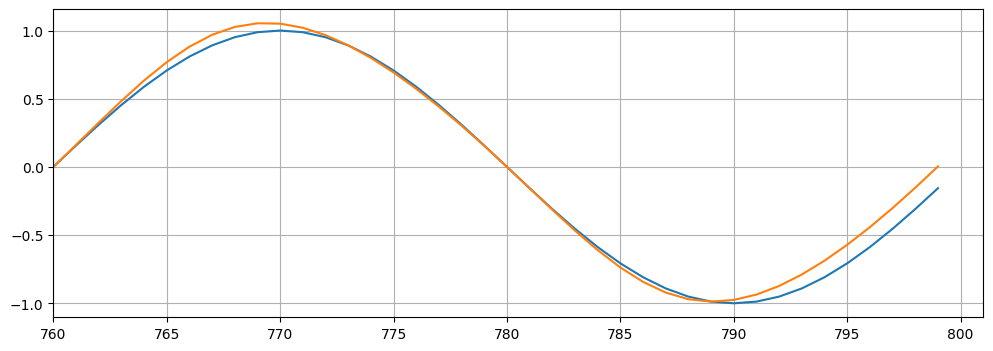

Epoch:  8 Loss: 0.00005311
Loss on test predictions: 0.003437927458435297


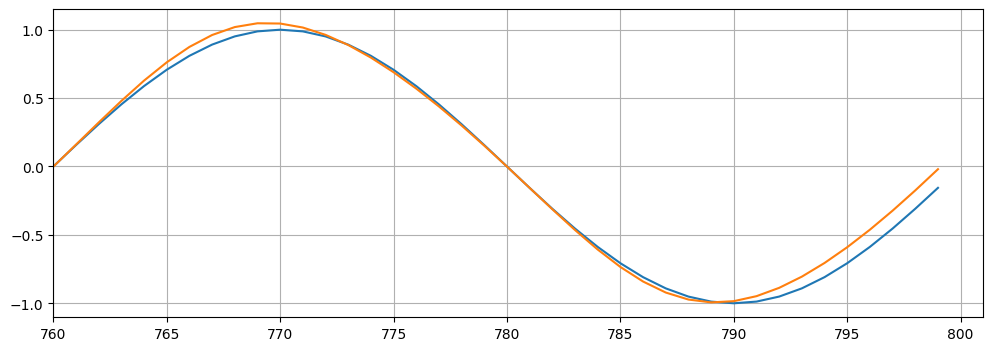

Epoch:  9 Loss: 0.00005255
Loss on test predictions: 0.0025904844515025616


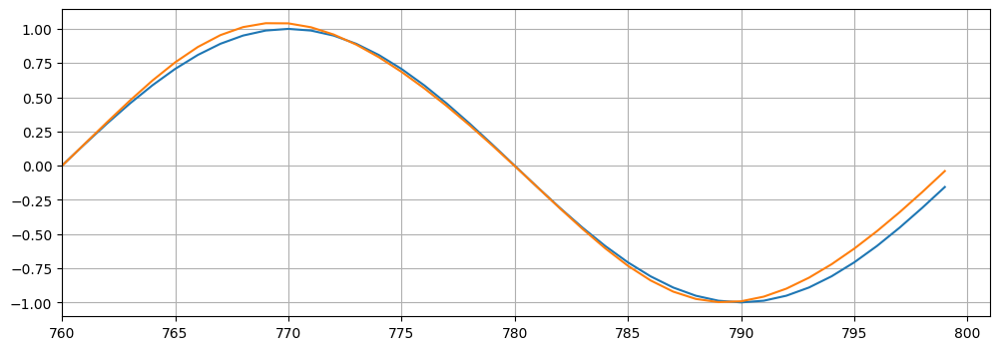

Epoch: 10 Loss: 0.00005130
Loss on test predictions: 0.001968205440789461


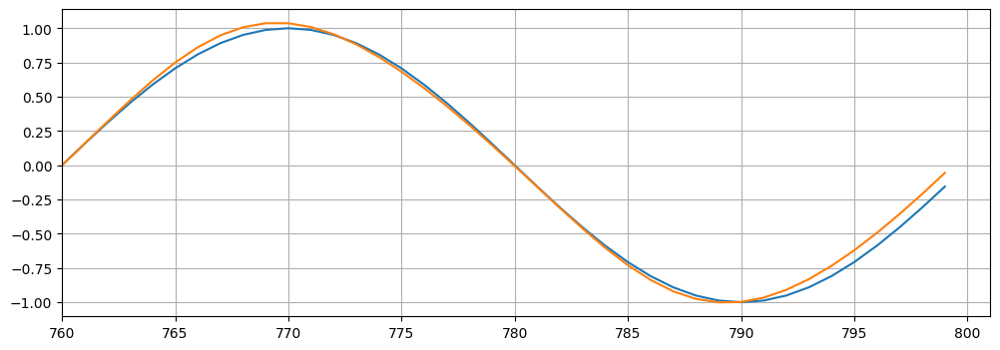

In [16]:
model = RNN()
criterion = nn.MSELoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.01)

epochs = 10
future = 40

for i in range(epochs):

    # tuple-unpack the train_data set
    for x_train, y_train in train_data:

        # reset the parameters and hidden states
        optimizer.zero_grad()
        y_pred = model(x_train)

        loss = criterion(y_pred, y_train)
        loss.backward()
        optimizer.step()

    # print training result
    print(f'Epoch: {i+1:2} Loss: {loss.item():10.8f}')

    # MAKE PREDICTIONS
    preds = train_set[-window_size:].tolist()

    for f in range(future):
        seq = torch.FloatTensor(preds[-window_size:])
        with torch.no_grad():
            preds.append(model(seq).item())

    loss = criterion(torch.tensor(preds[-window_size:]),y[760:])
    print(f'Loss on test predictions: {loss}')

    # Plot from point 700 to the end
    plt.figure(figsize=(12,4))
    plt.xlim(760,801)
    plt.grid(True)
    plt.plot(range(760,800), y.numpy()[-window_size:])
    plt.plot(range(760,800),preds[window_size:])
    plt.show()

#LSTM

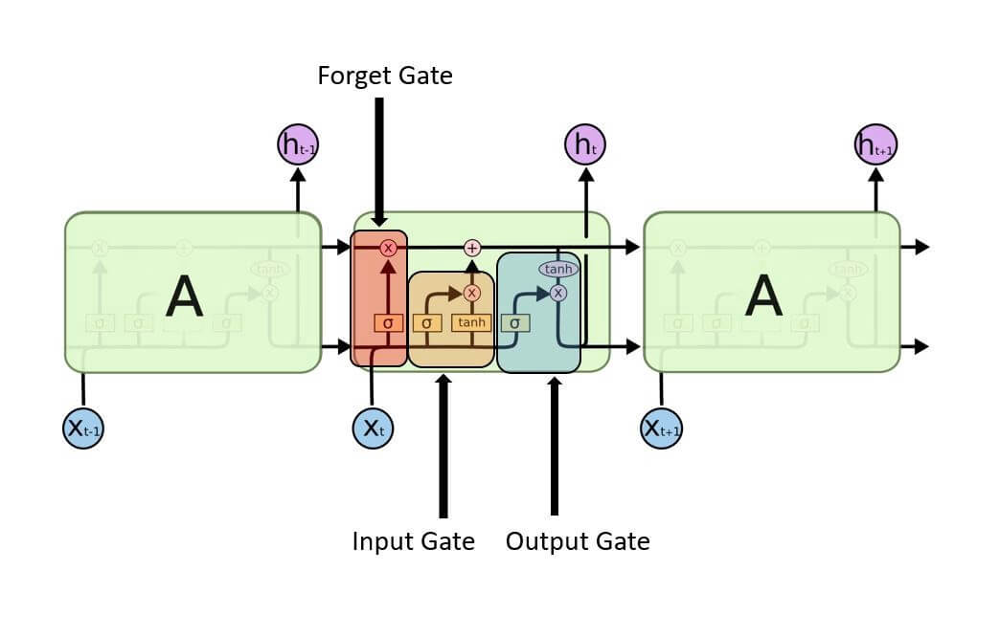

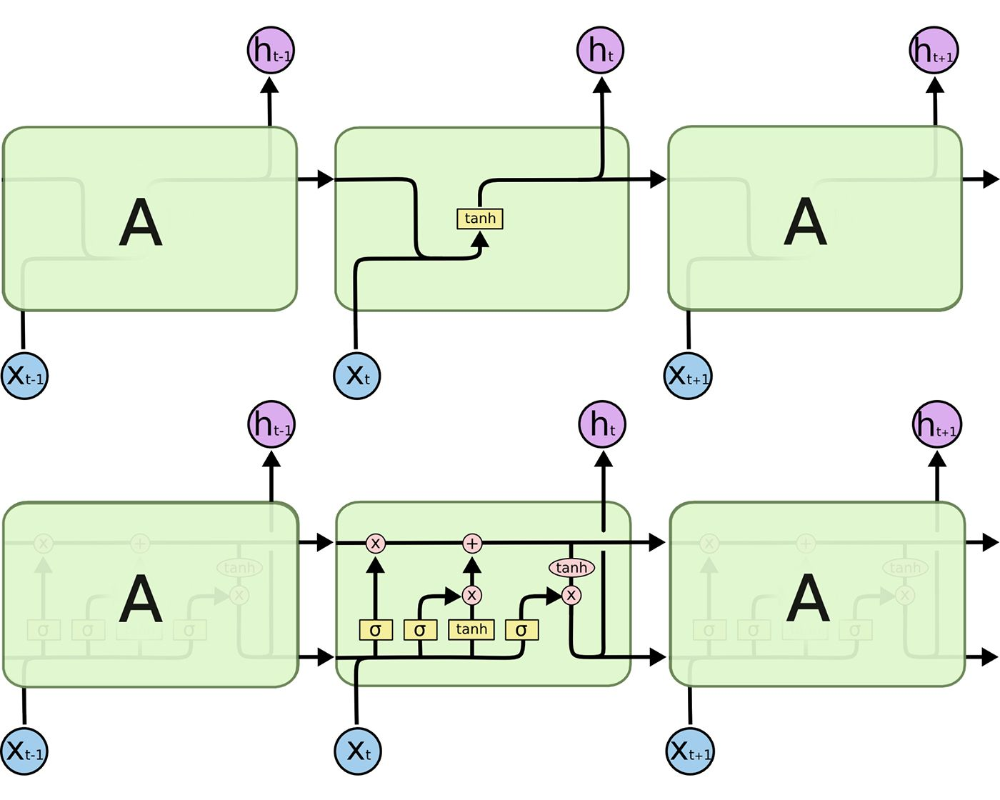

In [39]:
class LSTM(nn.Module):
    def __init__(self, input_size=1, hidden_size=50, out_size=1):
        super().__init__()
        self.hidden_size = hidden_size
        self.lstm = nn.LSTM(input_size,
                            hidden_size,
                            batch_first=True)
        self.linear = nn.Linear(hidden_size, out_size)


    def forward(self,seq):
        hidden = (torch.zeros(1,1,self.hidden_size),
                  torch.zeros(1,1,self.hidden_size))
        lstm_out, hidden = self.lstm(seq.view(1, len(seq), -1),
                                     hidden)
        pred = self.linear(lstm_out.view(len(seq), -1))
        return pred[-1]


Epoch:  1 Loss: 0.07374217
Loss on test predictions: 0.5725046396255493


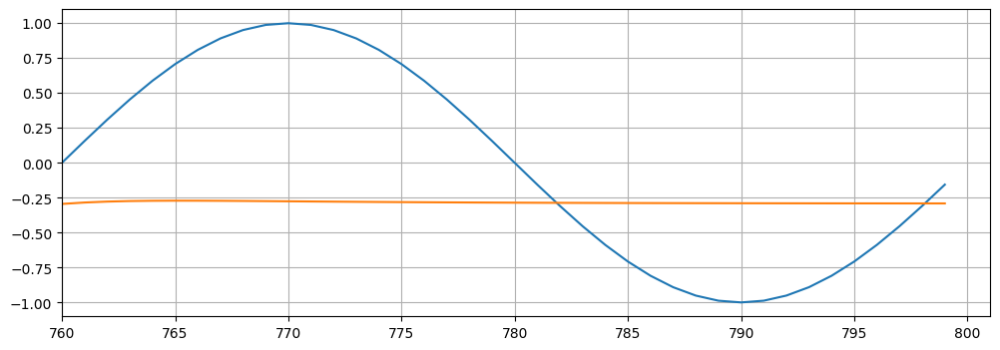

Epoch:  2 Loss: 0.02730523
Loss on test predictions: 0.45238667726516724


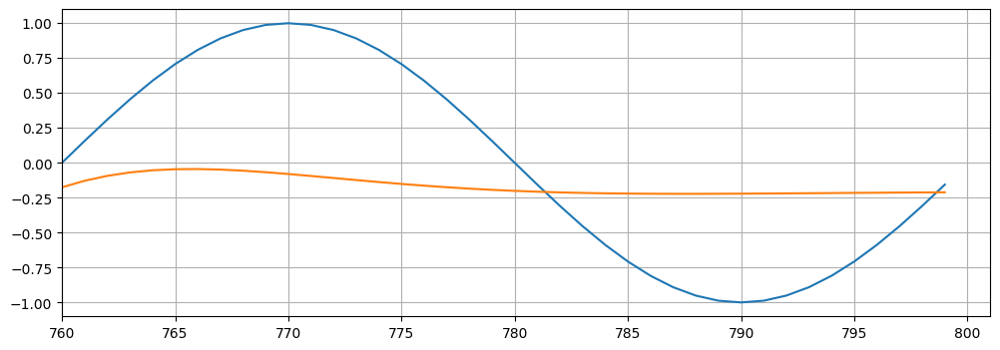

Epoch:  3 Loss: 0.00169266
Loss on test predictions: 0.11600279808044434


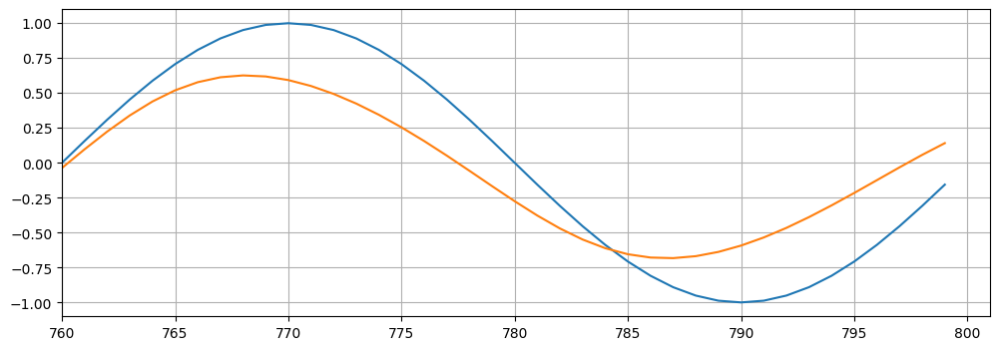

Epoch:  4 Loss: 0.00014176
Loss on test predictions: 0.0041166855953633785


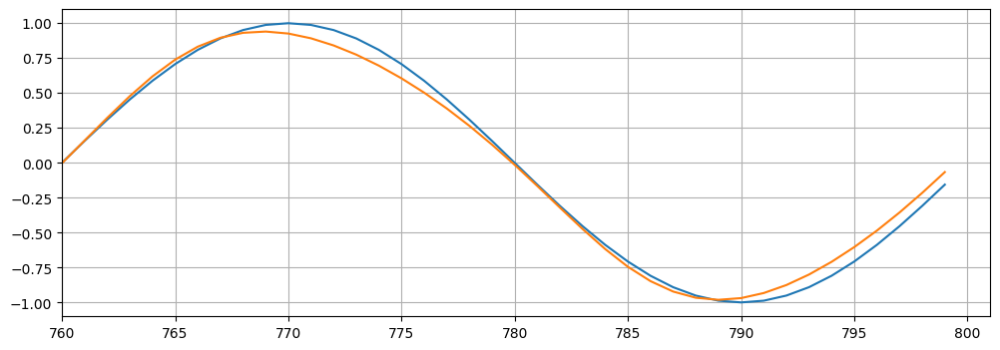

Epoch:  5 Loss: 0.00010364
Loss on test predictions: 0.0018112551188096404


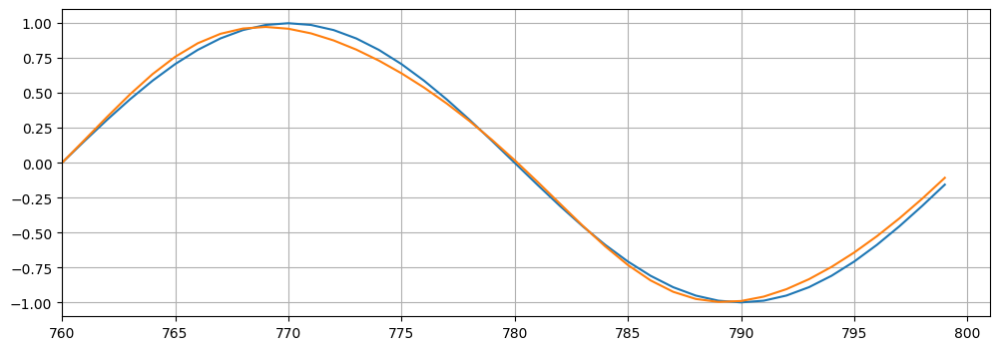

Epoch:  6 Loss: 0.00010449
Loss on test predictions: 0.001617327332496643


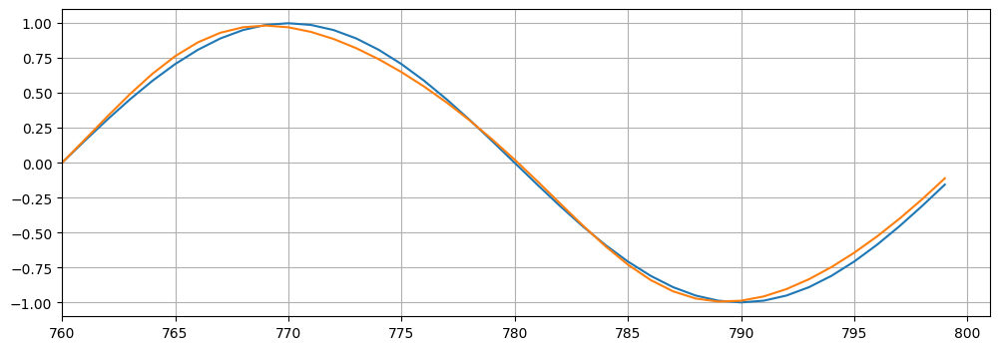

Epoch:  7 Loss: 0.00010605
Loss on test predictions: 0.0015445217723026872


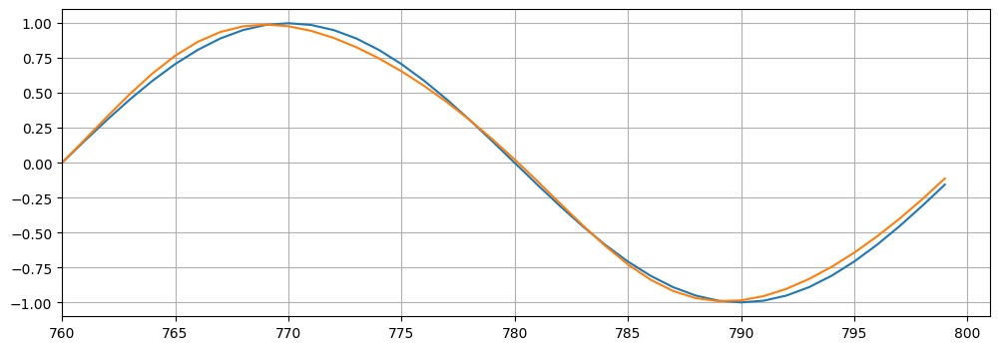

Epoch:  8 Loss: 0.00010668
Loss on test predictions: 0.0015087586361914873


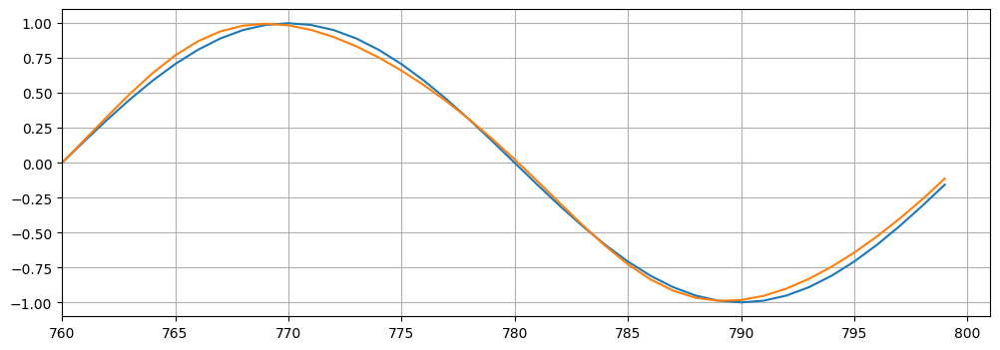

Epoch:  9 Loss: 0.00010647
Loss on test predictions: 0.0014927582815289497


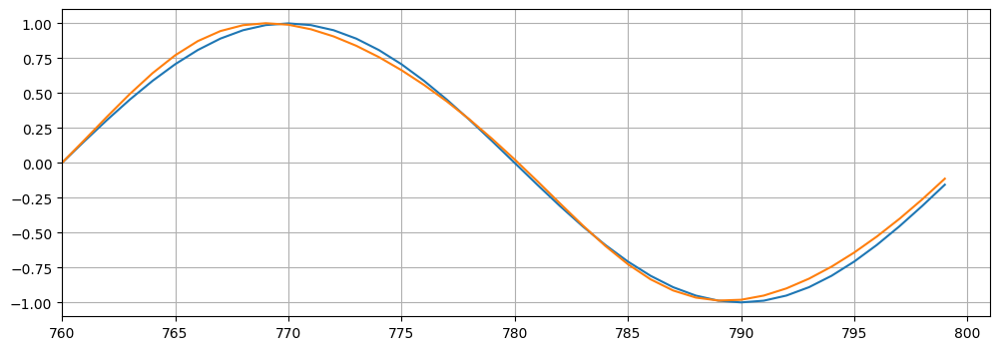

Epoch: 10 Loss: 0.00010560
Loss on test predictions: 0.001487599452957511


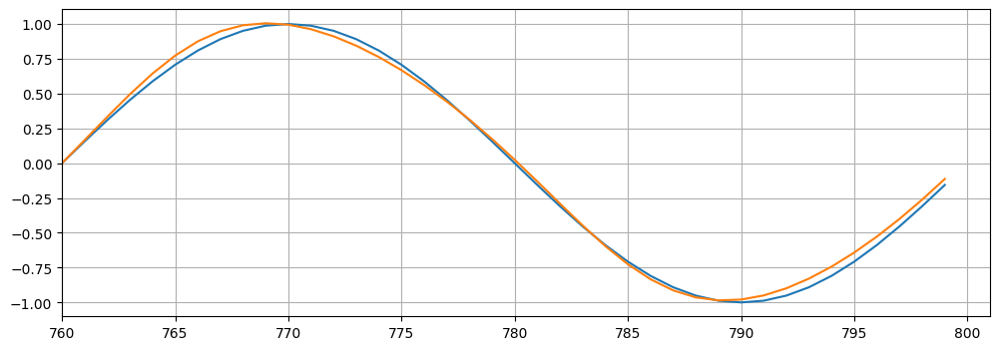

In [40]:
model = LSTM()
criterion = nn.MSELoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.01)

epochs = 10
future = 40

for i in range(epochs):

    # tuple-unpack the train_data set
    for x_train, y_train in train_data:

        # reset the parameters and hidden states
        optimizer.zero_grad()
        y_pred = model(x_train)

        loss = criterion(y_pred, y_train)
        loss.backward()
        optimizer.step()

    # print training result
    print(f'Epoch: {i+1:2} Loss: {loss.item():10.8f}')

    # MAKE PREDICTIONS
    preds = train_set[-window_size:].tolist()

    for f in range(future):
        seq = torch.FloatTensor(preds[-window_size:])
        with torch.no_grad():
            preds.append(model(seq).item())

    loss = criterion(torch.tensor(preds[-window_size:]),y[760:])
    print(f'Loss on test predictions: {loss}')

    # Plot from point 700 to the end
    plt.figure(figsize=(12,4))
    plt.xlim(760,801)
    plt.grid(True)
    plt.plot(range(760,800), y.numpy()[-window_size:])
    plt.plot(range(760,800),preds[window_size:])
    plt.show()

#GRU

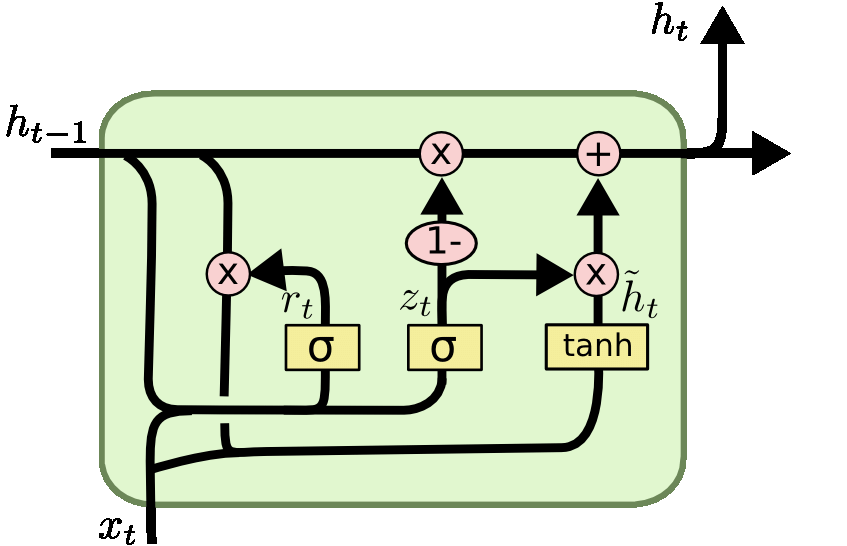

In [43]:
class GRU(nn.Module):
    def __init__(self, input_size=1, hidden_size=50, out_size=1):
        super().__init__()
        self.hidden_size = hidden_size
        self.gru = nn.GRU(input_size,
                            hidden_size,
                            batch_first=True)
        self.linear = nn.Linear(hidden_size, out_size)

    def forward(self, seq):
        hidden = torch.zeros(1,1,self.hidden_size)

        gru_out, hidden = self.gru(seq.view(1, len(seq), -1), hidden)
        pred = self.linear(gru_out.view(len(seq), -1))
        return pred[-1]

Epoch:  1 Loss: 0.04578309
Loss on test predictions: 0.5314921140670776


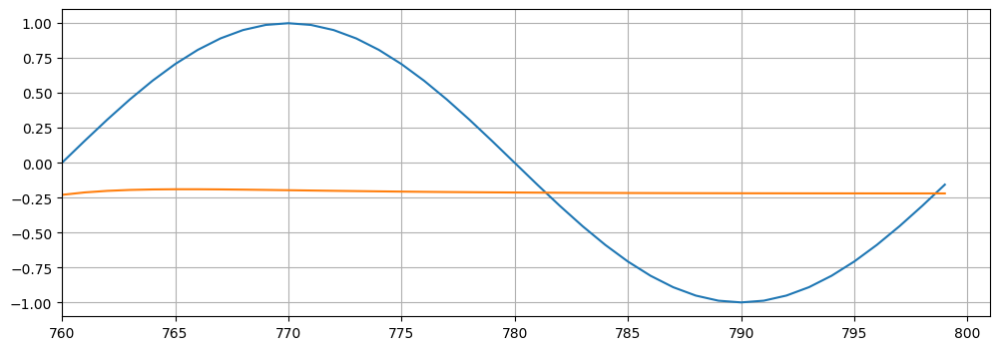

Epoch:  2 Loss: 0.00501799
Loss on test predictions: 0.30797842144966125


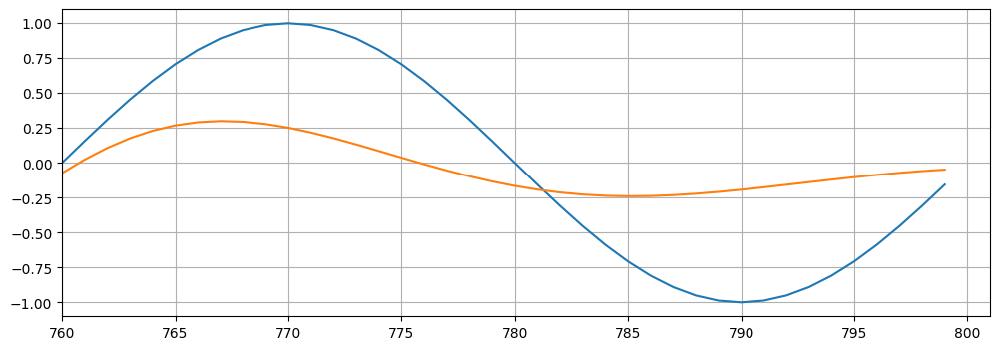

Epoch:  3 Loss: 0.00001851
Loss on test predictions: 0.012626362033188343


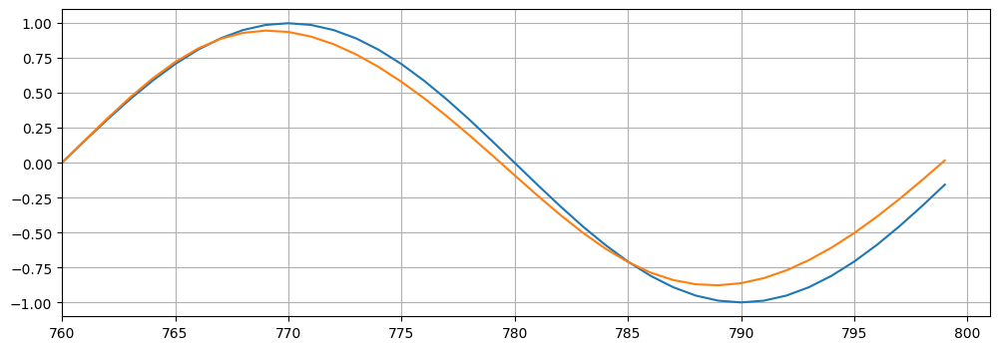

Epoch:  4 Loss: 0.00000079
Loss on test predictions: 0.00190187175758183


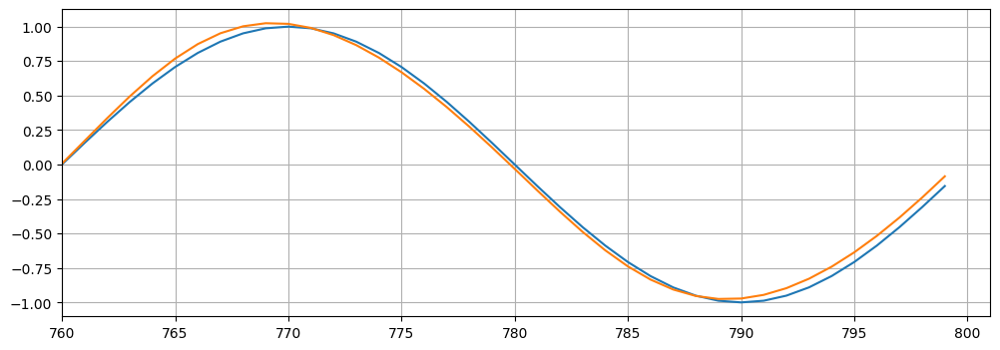

Epoch:  5 Loss: 0.00000108
Loss on test predictions: 0.00167959020473063


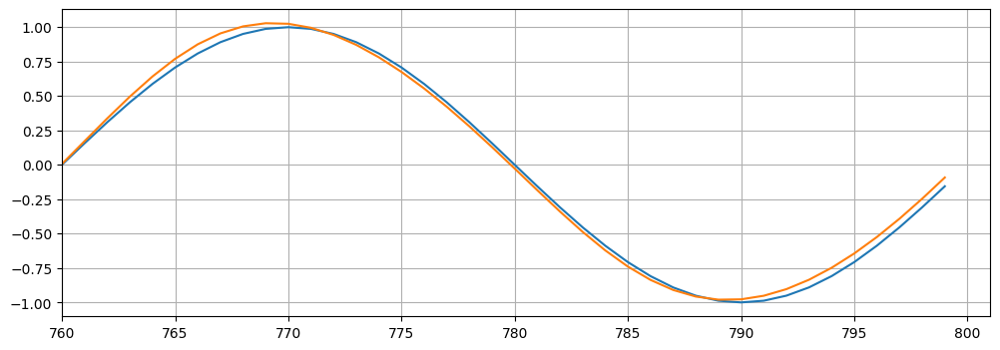

Epoch:  6 Loss: 0.00000089
Loss on test predictions: 0.00163935124874115


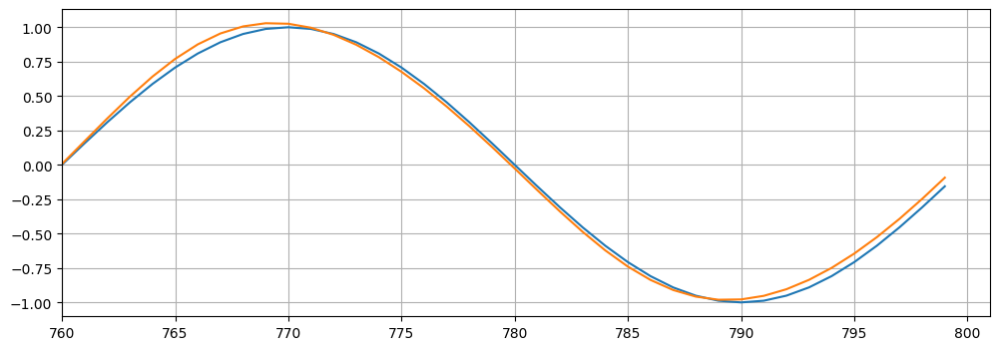

Epoch:  7 Loss: 0.00000071
Loss on test predictions: 0.001606592908501625


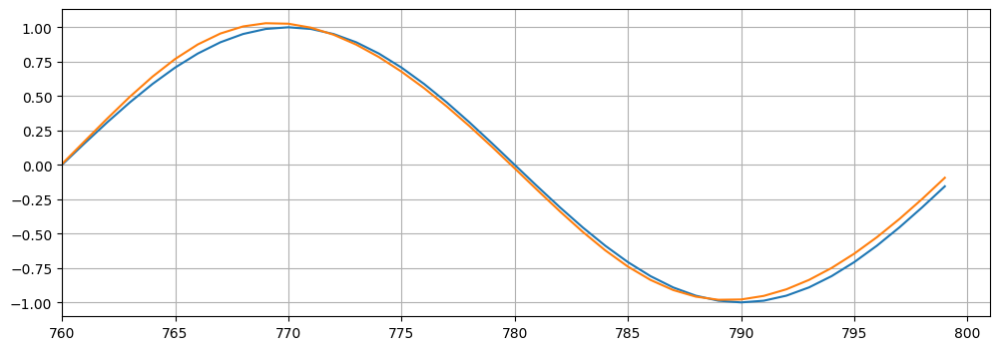

Epoch:  8 Loss: 0.00000055
Loss on test predictions: 0.0015742413233965635


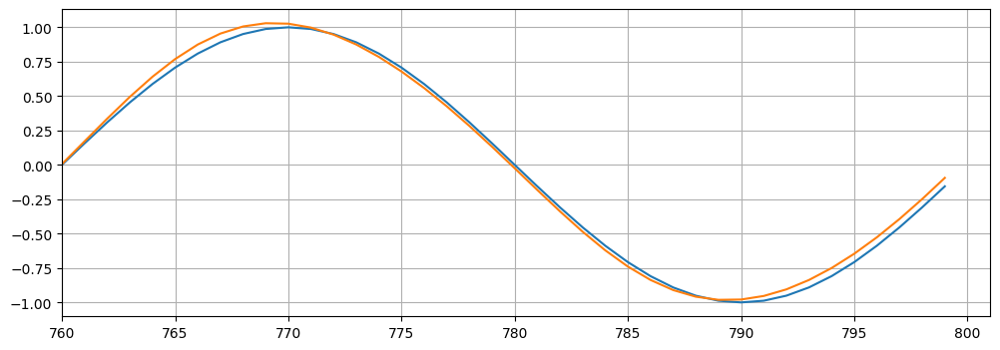

Epoch:  9 Loss: 0.00000041
Loss on test predictions: 0.0015420283889397979


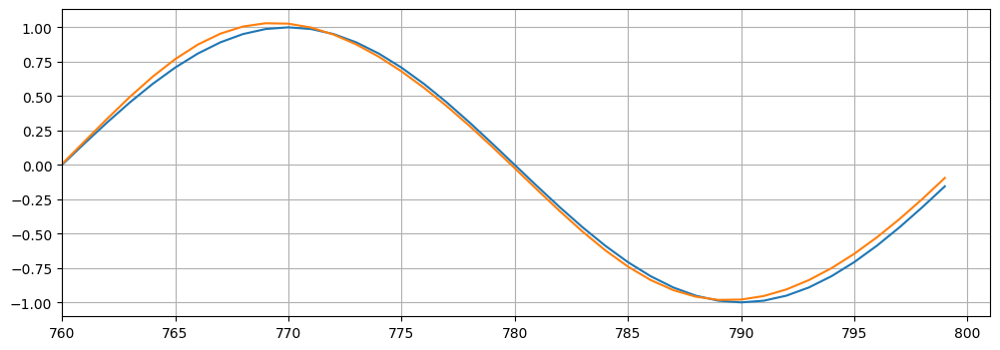

Epoch: 10 Loss: 0.00000030
Loss on test predictions: 0.0015100014861673117


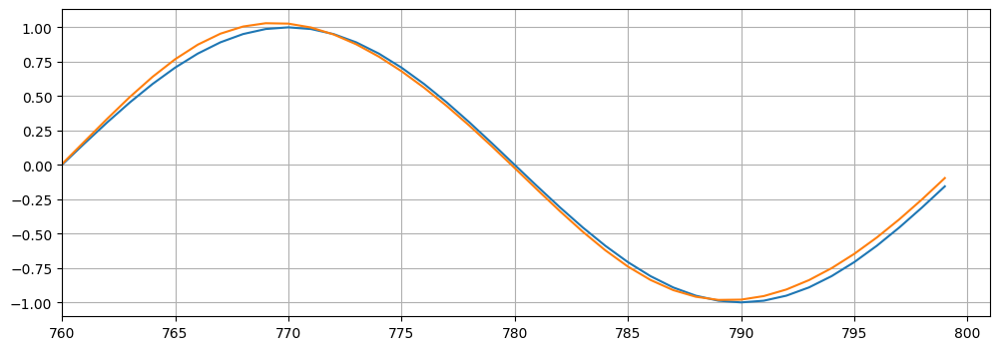

In [44]:
model = GRU()
criterion = nn.MSELoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.01)

epochs = 10
future = 40

for i in range(epochs):

    # tuple-unpack the train_data set
    for x_train, y_train in train_data:

        # reset the parameters and hidden states
        optimizer.zero_grad()
        y_pred = model(x_train)

        loss = criterion(y_pred, y_train)
        loss.backward()
        optimizer.step()

    # print training result
    print(f'Epoch: {i+1:2} Loss: {loss.item():10.8f}')

    # MAKE PREDICTIONS
    preds = train_set[-window_size:].tolist()

    for f in range(future):
        seq = torch.FloatTensor(preds[-window_size:])
        with torch.no_grad():
            preds.append(model(seq).item())

    loss = criterion(torch.tensor(preds[-window_size:]),y[760:])
    print(f'Loss on test predictions: {loss}')

    # Plot from point 700 to the end
    plt.figure(figsize=(12,4))
    plt.xlim(760,801)
    plt.grid(True)
    plt.plot(range(760,800), y.numpy()[-window_size:])
    plt.plot(range(760,800),preds[window_size:])
    plt.show()

#[Workshop] Stock price prediction: LSTM vs GRU

##Data Preparation

In [45]:
!gdown 1Ytf1couC1vtsPjvGNyo1XycGPM286Plh

Downloading...
From: https://drive.google.com/uc?id=1Ytf1couC1vtsPjvGNyo1XycGPM286Plh
To: /content/AOT.csv
100% 110k/110k [00:00<00:00, 74.8MB/s]


In [46]:
import pandas as pd

data = pd.read_csv('AOT.csv', index_col='Date', parse_dates=True)
data

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2017-01-04,63.25,64.50,63.00,64.00,47.714363,14341900
2017-01-05,64.25,64.75,63.75,64.25,47.900749,12762900
2017-01-06,64.50,64.50,63.75,64.00,47.714363,8106700
2017-01-09,64.00,64.00,63.00,63.25,47.155212,10983300
2017-01-10,63.00,63.50,62.75,63.50,47.341595,8163200
...,...,...,...,...,...,...
2024-09-02,25.00,25.00,25.00,25.00,25.000000,0
2024-09-03,25.00,25.00,25.00,25.00,25.000000,0
2024-09-04,25.00,25.00,25.00,25.00,25.000000,0


In [48]:
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset

from sklearn.preprocessing import MinMaxScaler

# Select relevant features (Open, High, Low, Close) as input and Volume as output
input_features = data[['Open', 'High', 'Low', 'Close']].values
output_features = data[['Volume']].values

# Set parameters for sequences
sequence_length = 40

# Create sequences for input and output
def create_sequences(input_data, output_data, seq_length):
    sequences = []
    targets = []

    for i in range(len(input_data) - seq_length):
        seq = input_data[i:i + seq_length]
        target = output_data[i + seq_length]  # Volume at the next time step
        sequences.append(seq)
        targets.append(target)

    return np.array(sequences), np.array(targets)

# Create sequences
X, y = create_sequences(input_features, output_features, sequence_length)

# Split the data into train and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

#########
# Normalize the input features and output features using MinMaxScaler
scaler_input = MinMaxScaler()
scaler_output = MinMaxScaler()

# Fit the scaler only on the training data and transform both training and test data
X_train_reshaped = X_train.reshape(-1, X_train.shape[-1])  # Reshape for scaling
X_train_normalized = scaler_input.fit_transform(X_train_reshaped).reshape(X_train.shape)  # Scale and reshape back

X_test_reshaped = X_test.reshape(-1, X_test.shape[-1])  # Reshape for scaling
X_test_normalized = scaler_input.transform(X_test_reshaped).reshape(X_test.shape)  # Scale and reshape back

# Normalize the output features
y_train_normalized = scaler_output.fit_transform(y_train)  # Fit and transform training output
y_test_normalized = scaler_output.transform(y_test)  # Transform test output
#########

# Convert to PyTorch tensors
train_input_tensor = torch.tensor(X_train_normalized, dtype=torch.float32)
train_output_tensor = torch.tensor(y_train_normalized, dtype=torch.float32)
test_input_tensor = torch.tensor(X_test_normalized, dtype=torch.float32)
test_output_tensor = torch.tensor(y_test_normalized, dtype=torch.float32)

# Create Tensor datasets and DataLoaders
train_dataset = TensorDataset(train_input_tensor, train_output_tensor)
test_dataset = TensorDataset(test_input_tensor, test_output_tensor)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)  # Adjust batch size as needed
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)     # For evaluation, no shuffle

# Display the shapes of the tensors
print("Train Input Tensor Shape:", train_input_tensor.shape)  # Should be (N_train, 40, 4)
print("Train Output Tensor Shape:", train_output_tensor.shape)  # Should be (N_train, 1)
print("Test Input Tensor Shape:", test_input_tensor.shape)  # Should be (N_test, 40, 4)
print("Test Output Tensor Shape:", test_output_tensor.shape)  # Should be (N_test, 1)

Train Input Tensor Shape: torch.Size([1460, 40, 4])
Train Output Tensor Shape: torch.Size([1460, 1])
Test Input Tensor Shape: torch.Size([365, 40, 4])
Test Output Tensor Shape: torch.Size([365, 1])


## Your work

In [66]:
class LSTM(nn.Module):
    def __init__(self, input_size=4, hidden_size=50, out_size=1):
        super().__init__()
        self.hidden_size = hidden_size
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.linear = nn.Linear(hidden_size, out_size)

    def forward(self, seq):
        hidden = (torch.zeros(1, seq.size(0), self.hidden_size),
                  torch.zeros(1, seq.size(0), self.hidden_size))
        lstm_out, hidden = self.lstm(seq, hidden)
        pred = self.linear(lstm_out[:, -1, :])

        return pred


In [71]:
class GRU(nn.Module):
    def __init__(self, input_size=4, hidden_size=50, out_size=1):
        super().__init__()
        self.hidden_size = hidden_size
        self.gru = nn.GRU(input_size, hidden_size, batch_first=True)
        self.linear = nn.Linear(hidden_size, out_size)

    def forward(self, seq):
        hidden = torch.zeros(1, seq.size(0), self.hidden_size)
        gru_out, hidden = self.gru(seq, hidden)
        pred = self.linear(gru_out[:, -1, :])

        return pred

Epoch:  1 Loss: 0.00700551
Loss on test predictions: 0.01020092610269785


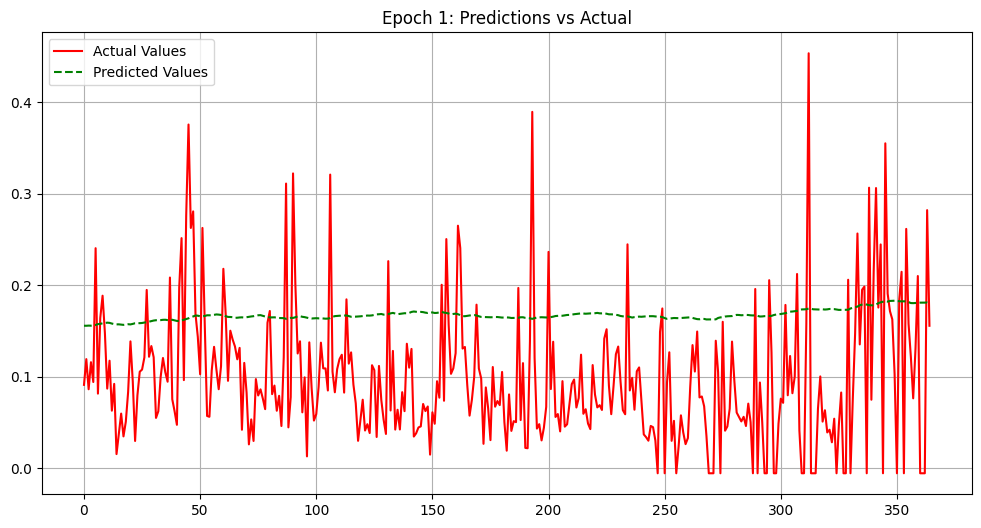

Epoch:  2 Loss: 0.00251622
Loss on test predictions: 0.01081078127026558


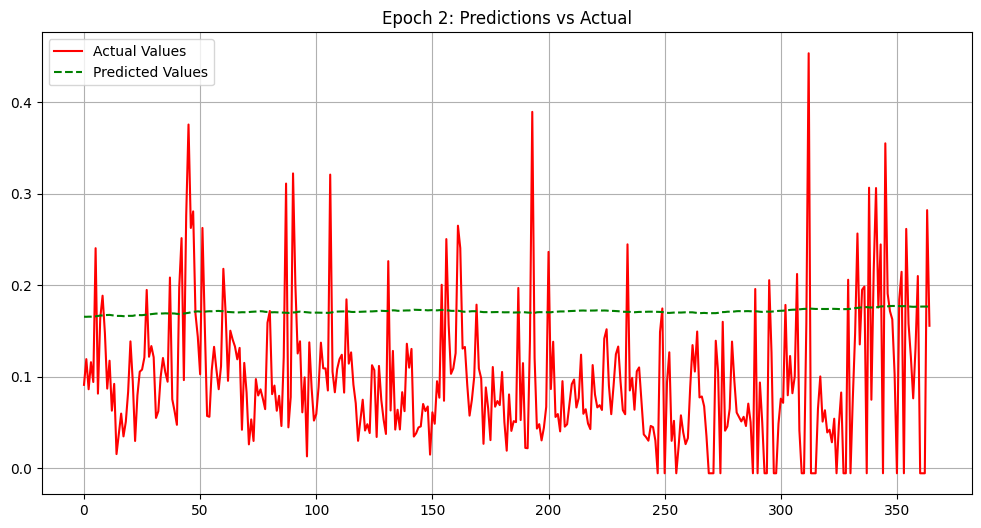

Epoch:  3 Loss: 0.00189675
Loss on test predictions: 0.007969720289111137


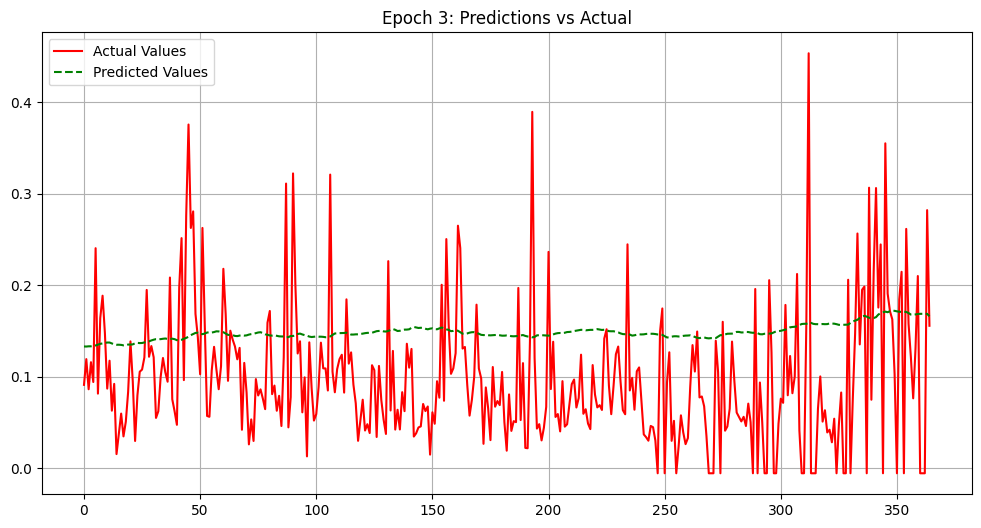

Epoch:  4 Loss: 0.00035233
Loss on test predictions: 0.04930033162236214


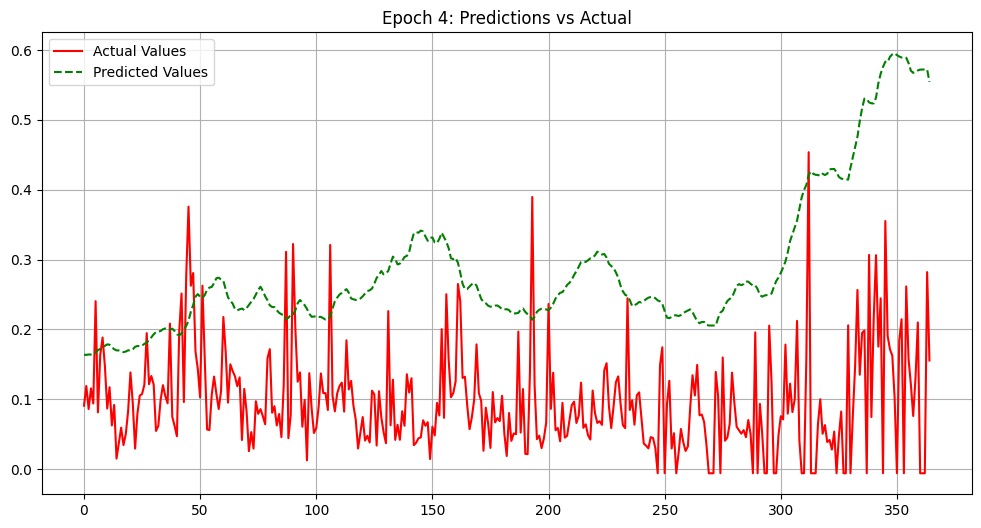

Epoch:  5 Loss: 0.00340885
Loss on test predictions: 0.01889094151556492


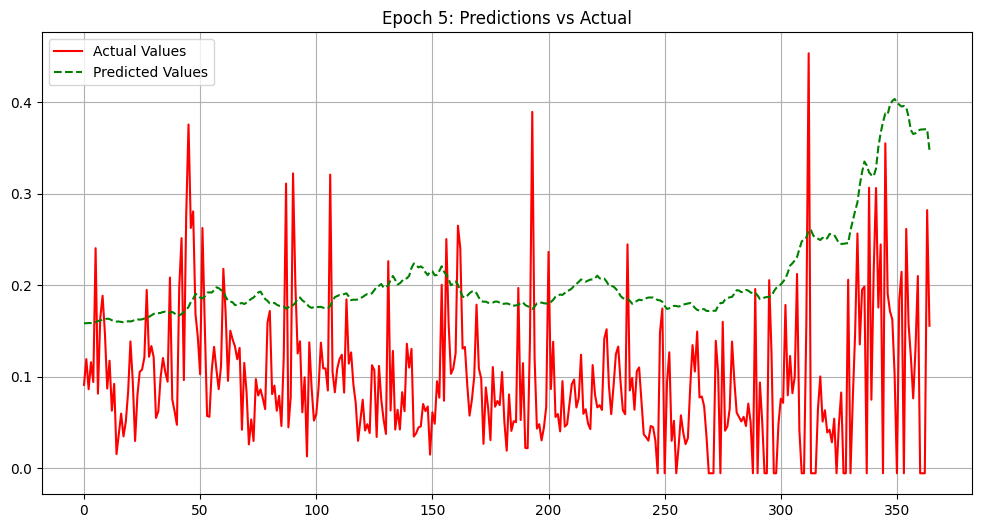

Epoch:  6 Loss: 0.00176187
Loss on test predictions: 0.016784166917204857


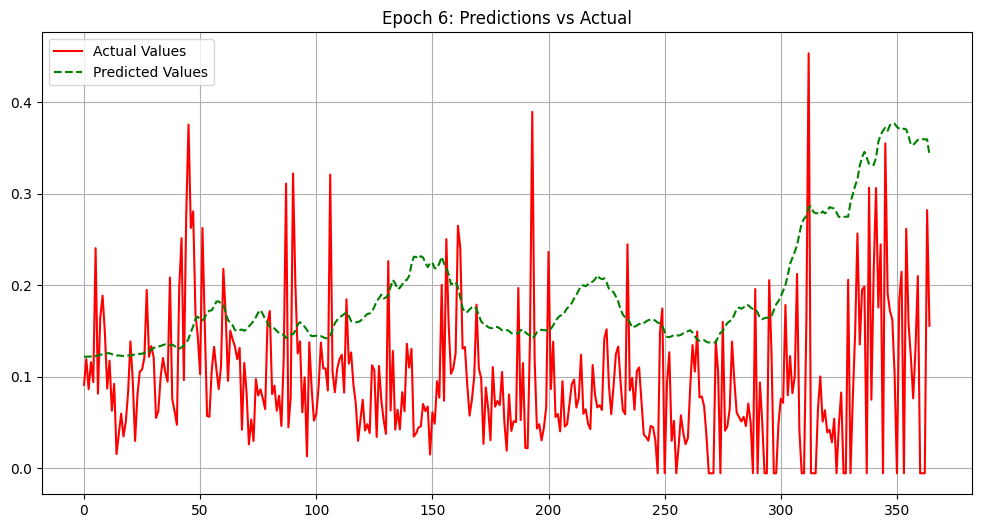

Epoch:  7 Loss: 0.04651722
Loss on test predictions: 0.03277917578816414


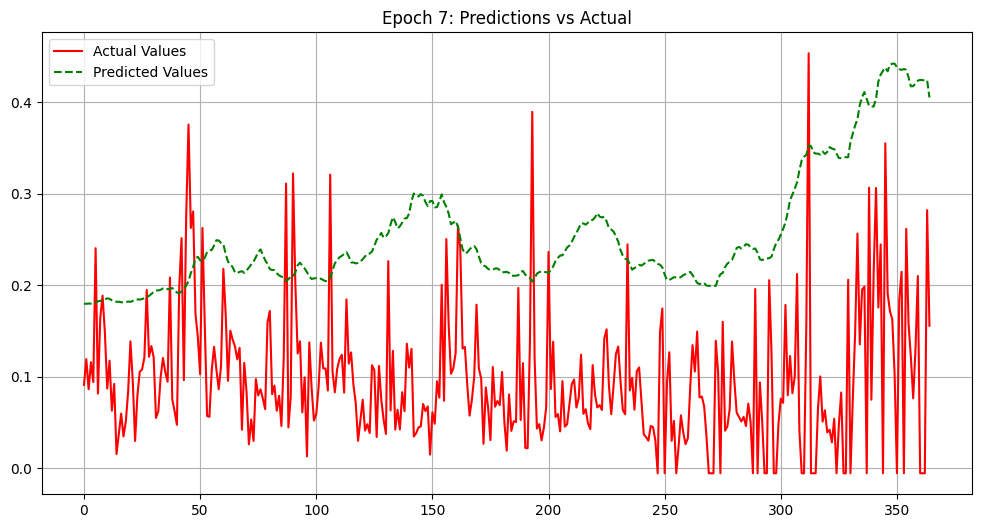

Epoch:  8 Loss: 0.05670034
Loss on test predictions: 0.024577731266617775


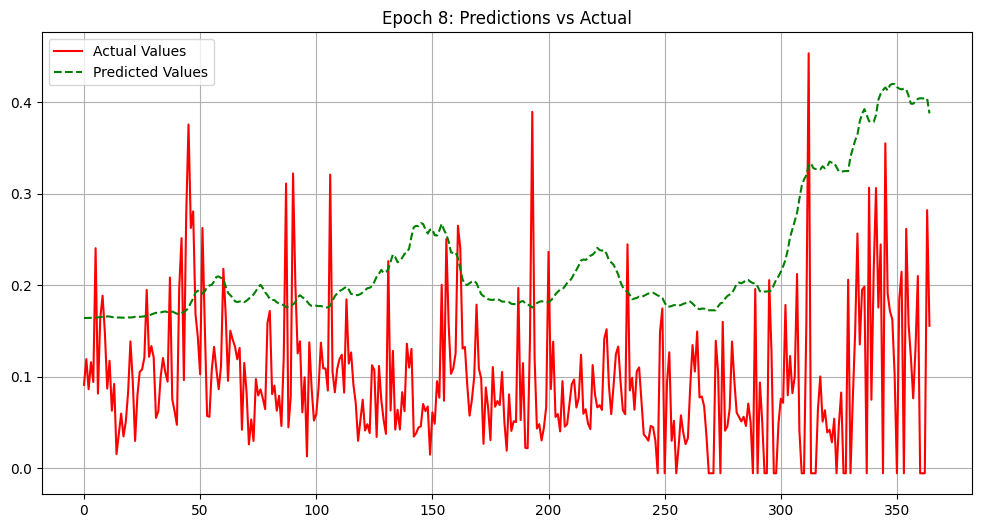

Epoch:  9 Loss: 0.01404537
Loss on test predictions: 0.03795243054628372


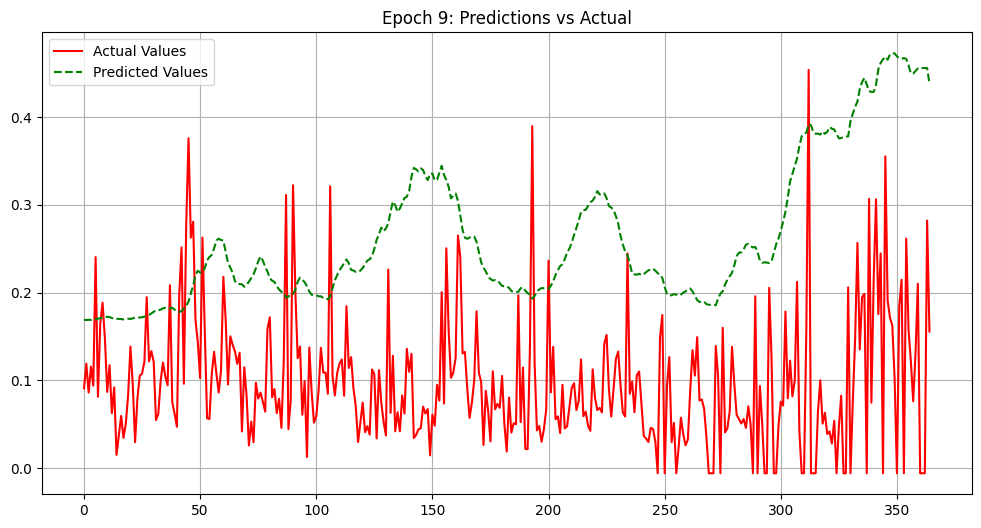

Epoch: 10 Loss: 0.00090246
Loss on test predictions: 0.047886814922094345


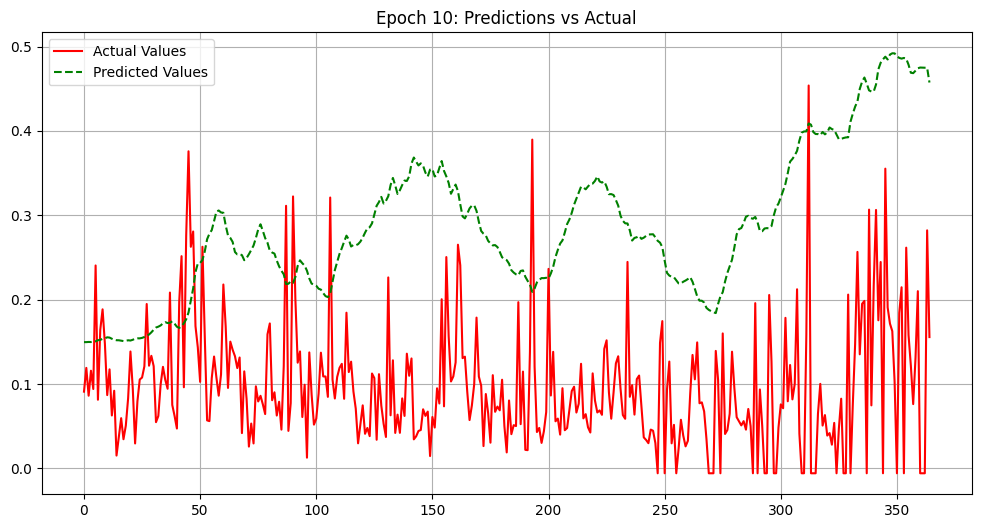

Epoch: 11 Loss: 0.00453259
Loss on test predictions: 0.02858591265976429


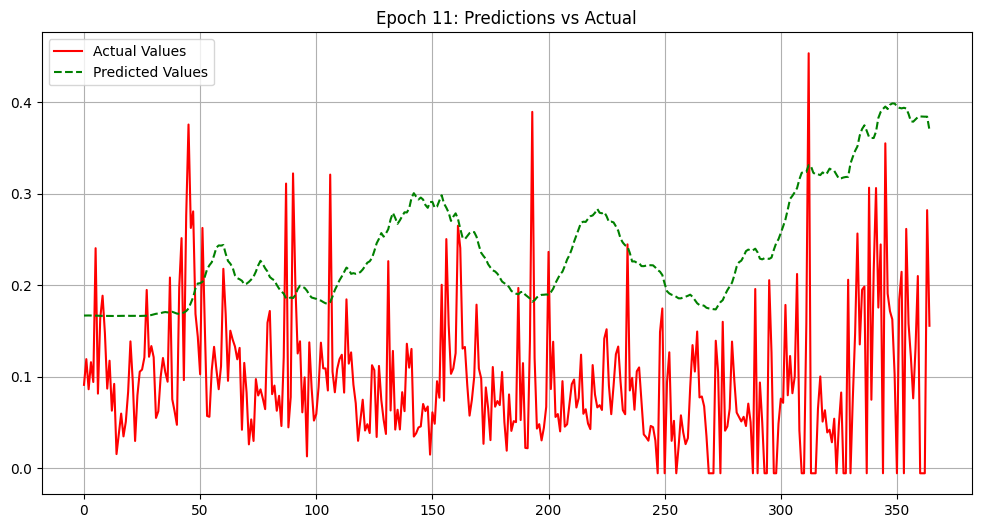

Epoch: 12 Loss: 0.00830196
Loss on test predictions: 0.03528991714119911


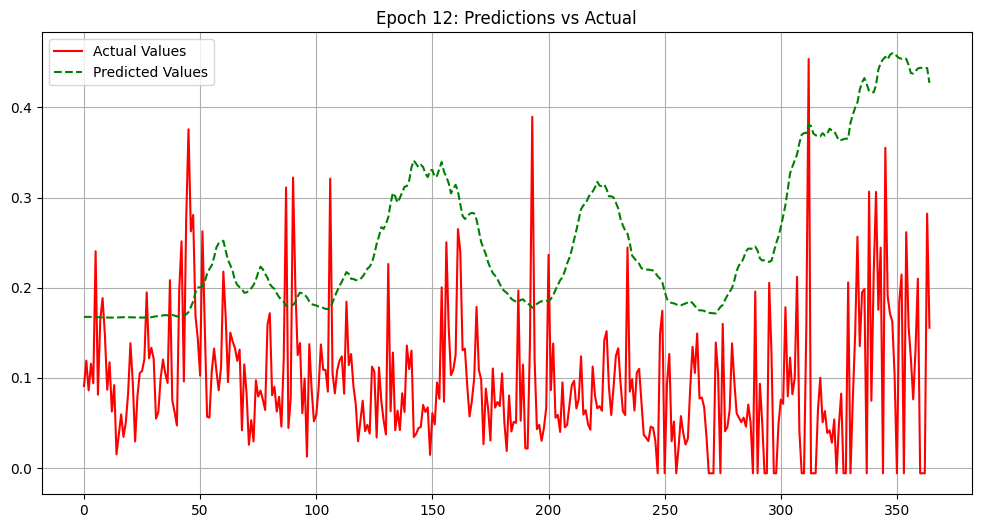

Epoch: 13 Loss: 0.00326821
Loss on test predictions: 0.022818855941295624


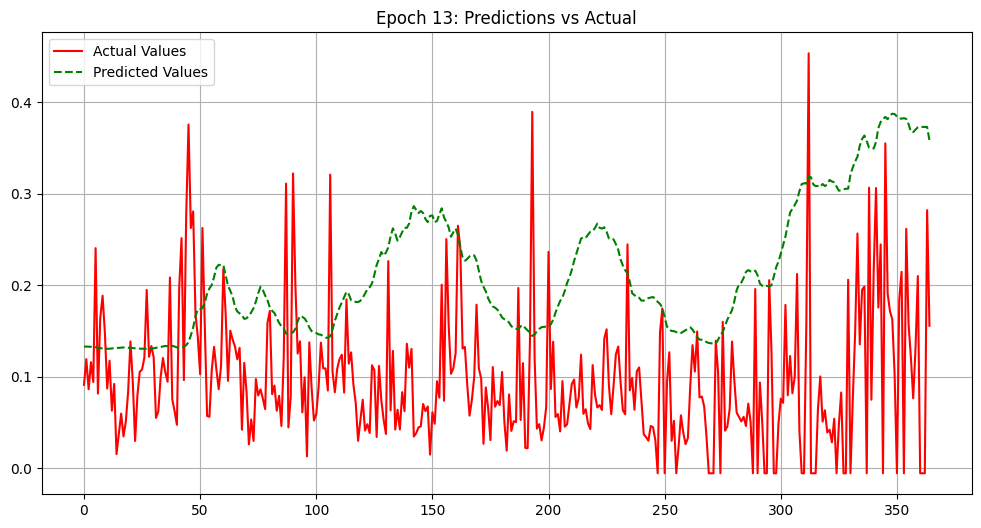

Epoch: 14 Loss: 0.01028566
Loss on test predictions: 0.035929124802351


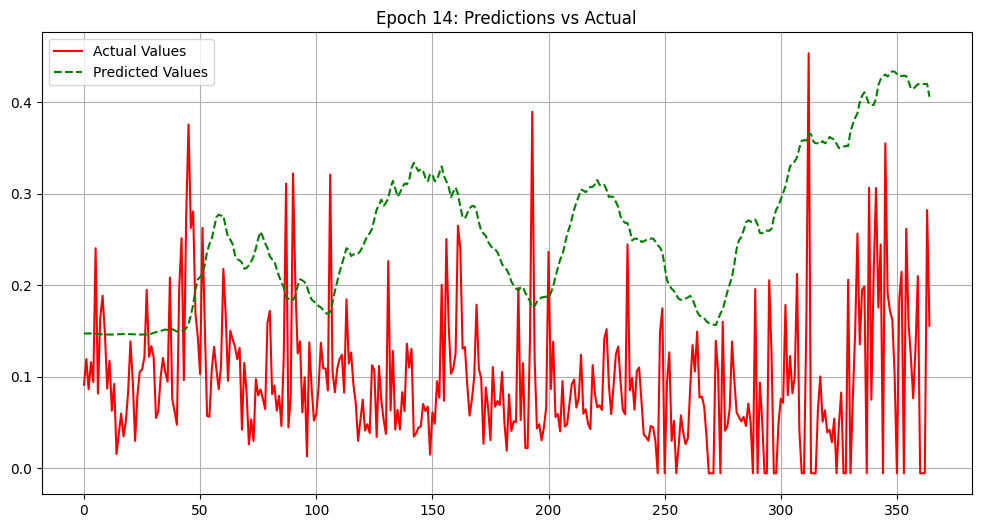

Epoch: 15 Loss: 0.00420927
Loss on test predictions: 0.054604873061180115


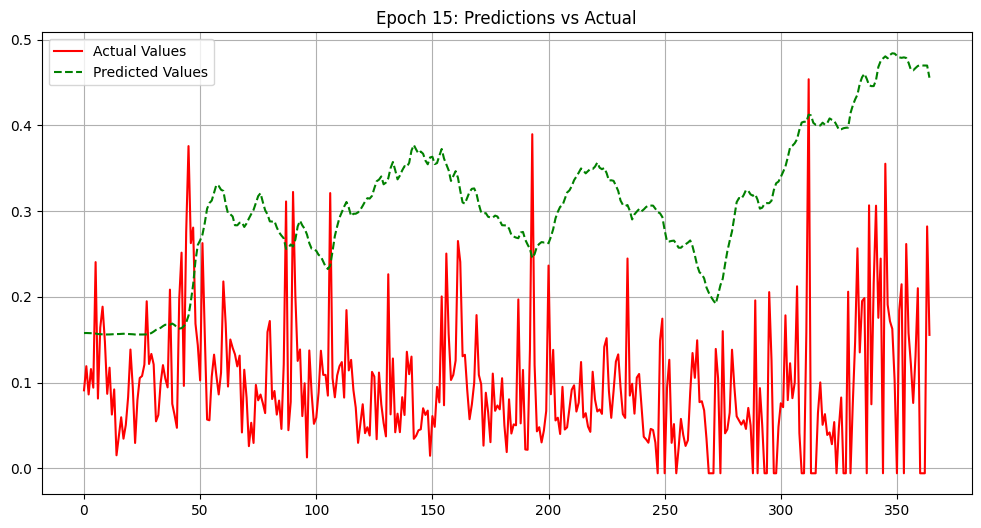

Epoch: 16 Loss: 0.01424997
Loss on test predictions: 0.033098477870225906


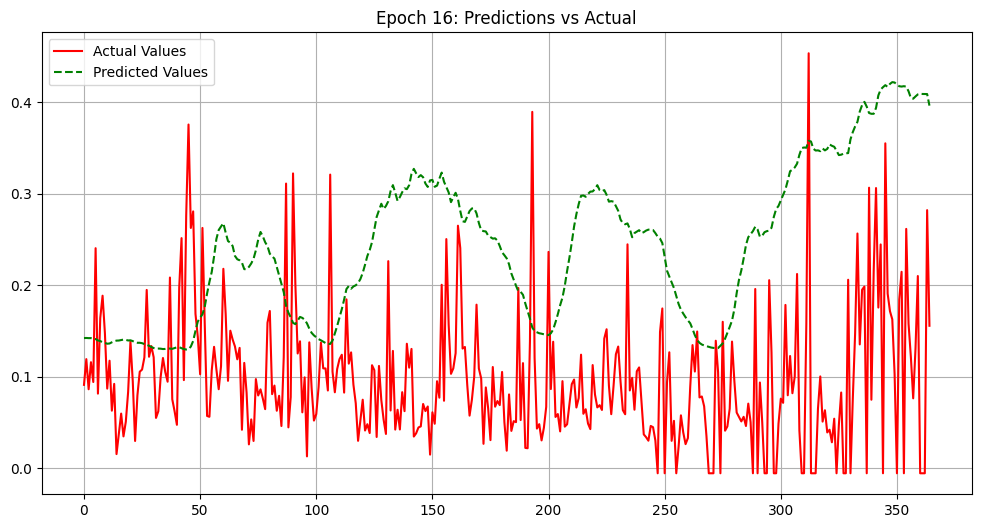

Epoch: 17 Loss: 0.00517046
Loss on test predictions: 0.048317667096853256


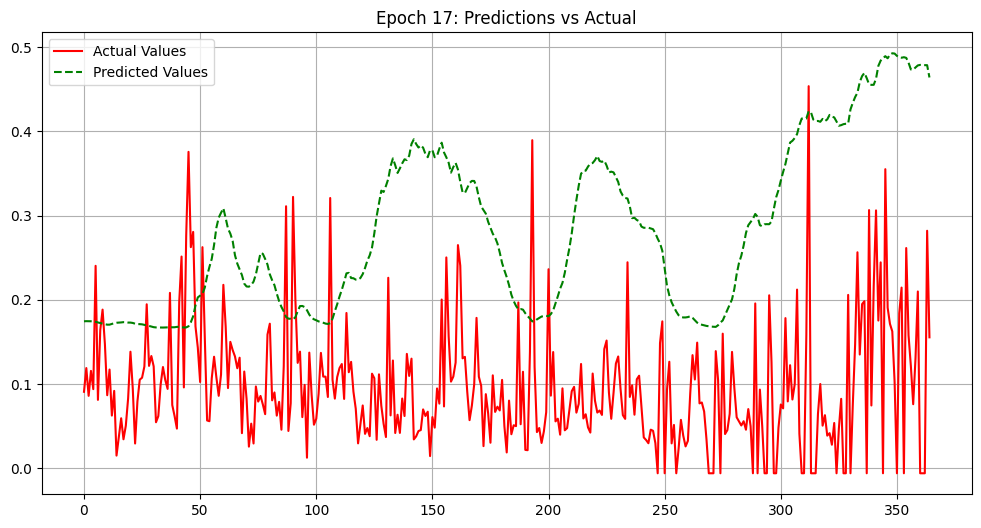

Epoch: 18 Loss: 0.00622714
Loss on test predictions: 0.10507609695196152


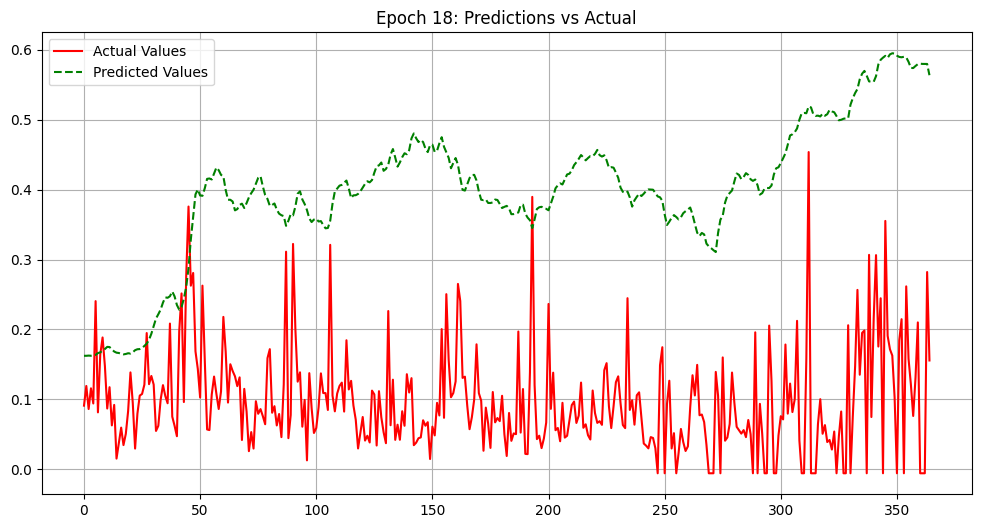

Epoch: 19 Loss: 0.00289411
Loss on test predictions: 0.04752261936664581


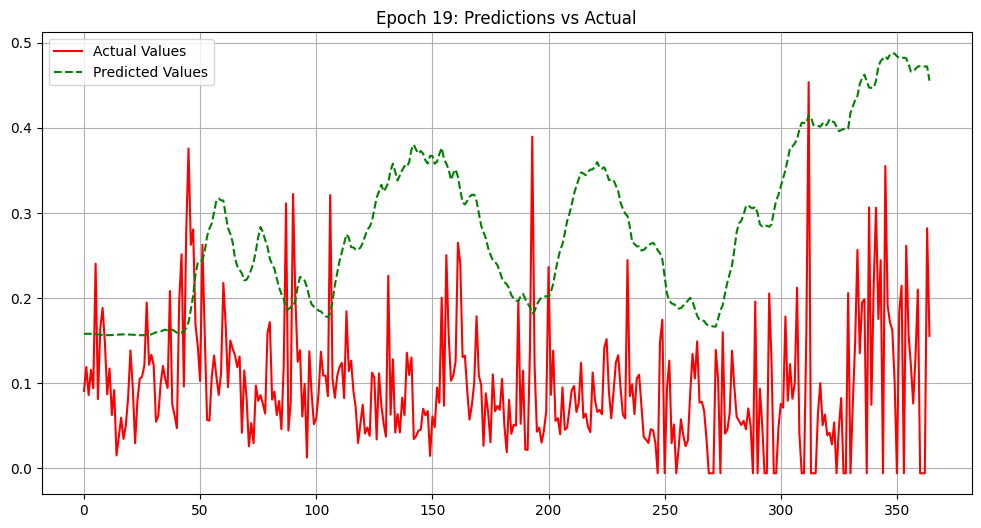

Epoch: 20 Loss: 0.01640318
Loss on test predictions: 0.04722103103995323


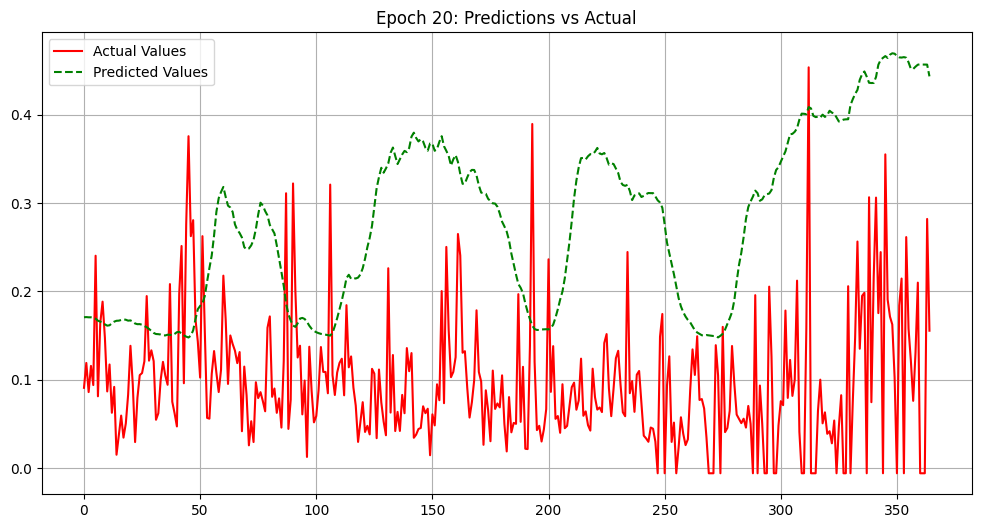

Epoch: 21 Loss: 0.00224082
Loss on test predictions: 0.0418262742459774


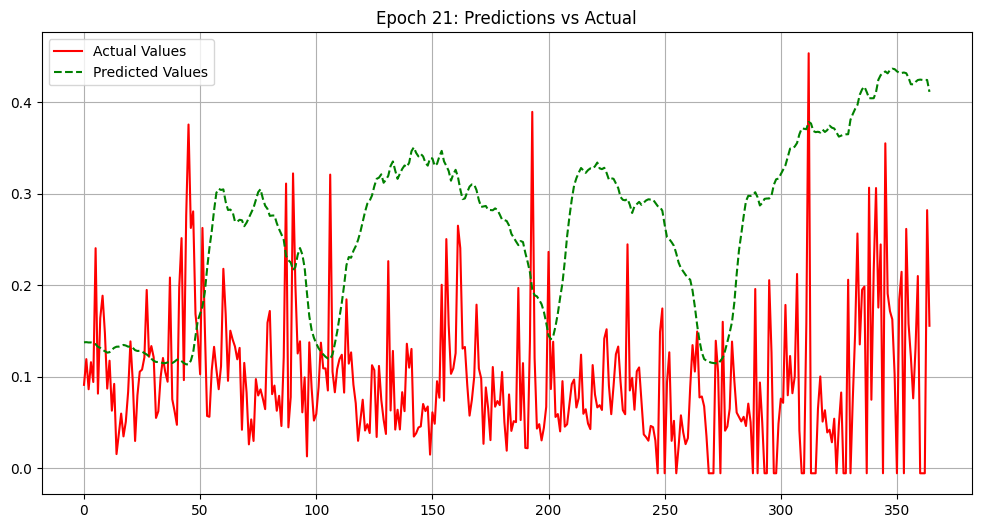

Epoch: 22 Loss: 0.00430479
Loss on test predictions: 0.06190016120672226


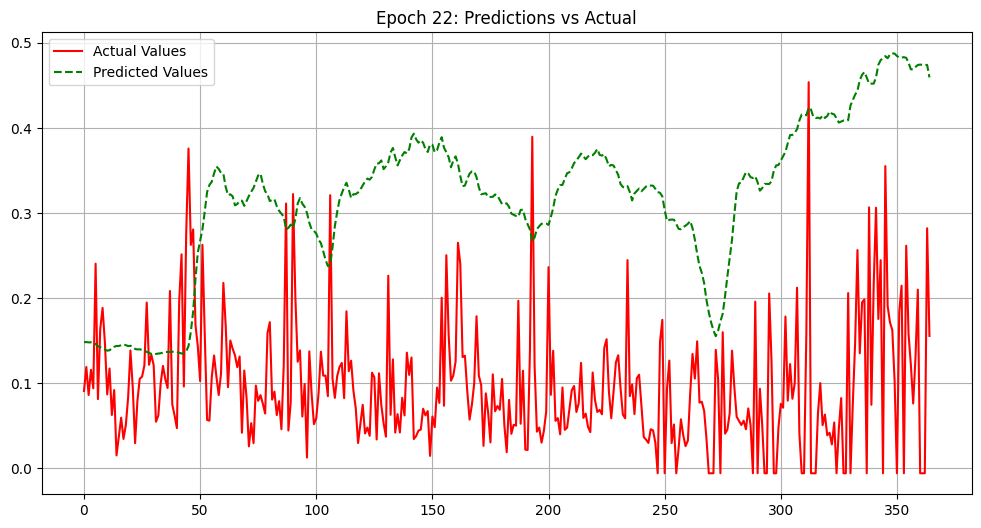

Epoch: 23 Loss: 0.00209203
Loss on test predictions: 0.05448067560791969


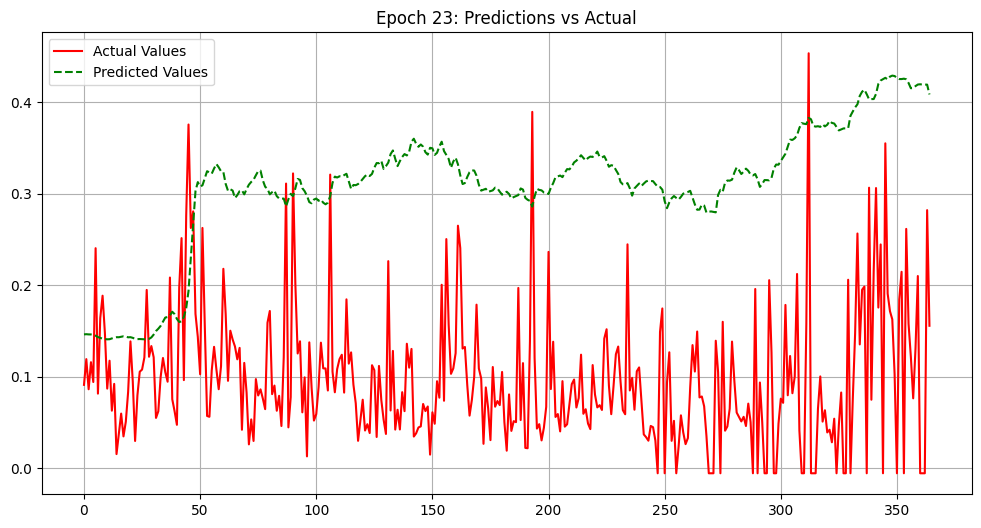

Epoch: 24 Loss: 0.00402234
Loss on test predictions: 0.05330944433808327


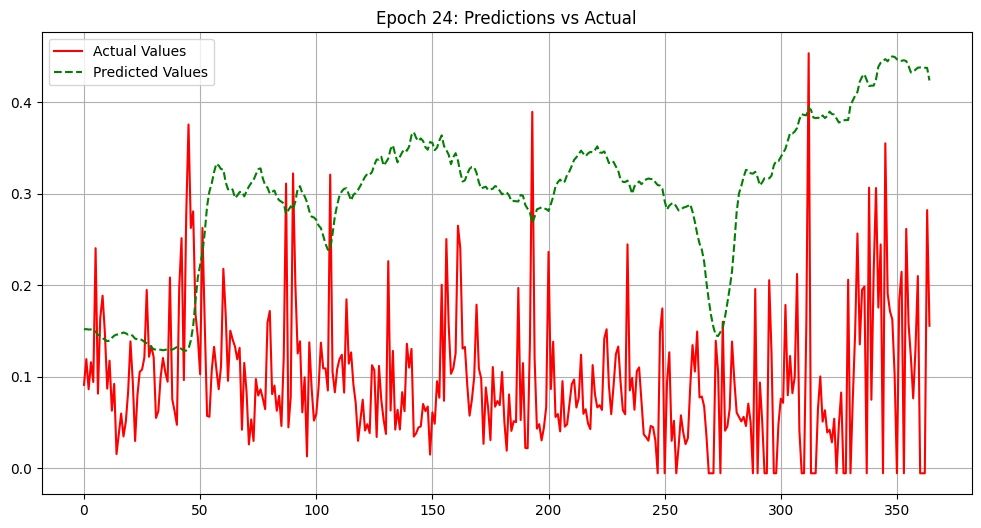

Epoch: 25 Loss: 0.01676453
Loss on test predictions: 0.0392511747777462


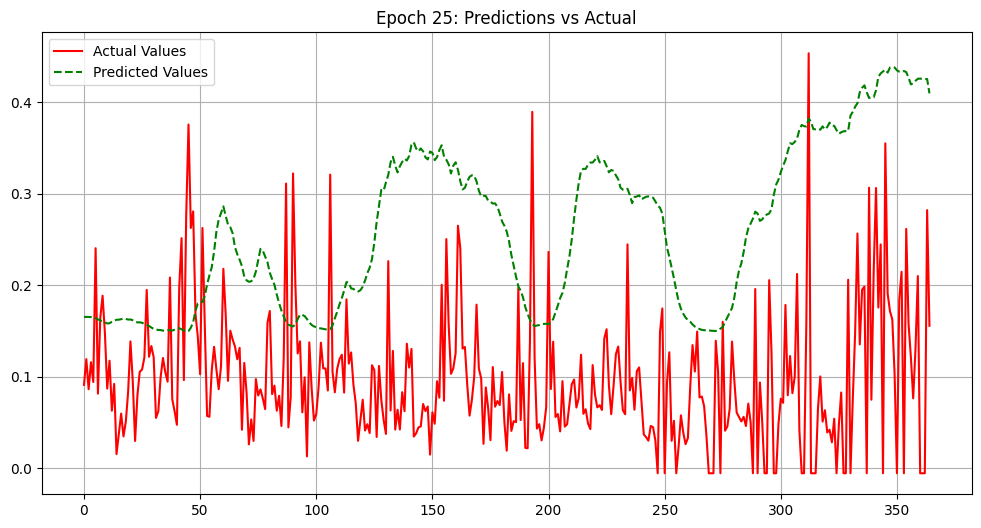

Epoch: 26 Loss: 0.00308835
Loss on test predictions: 0.051433756947517395


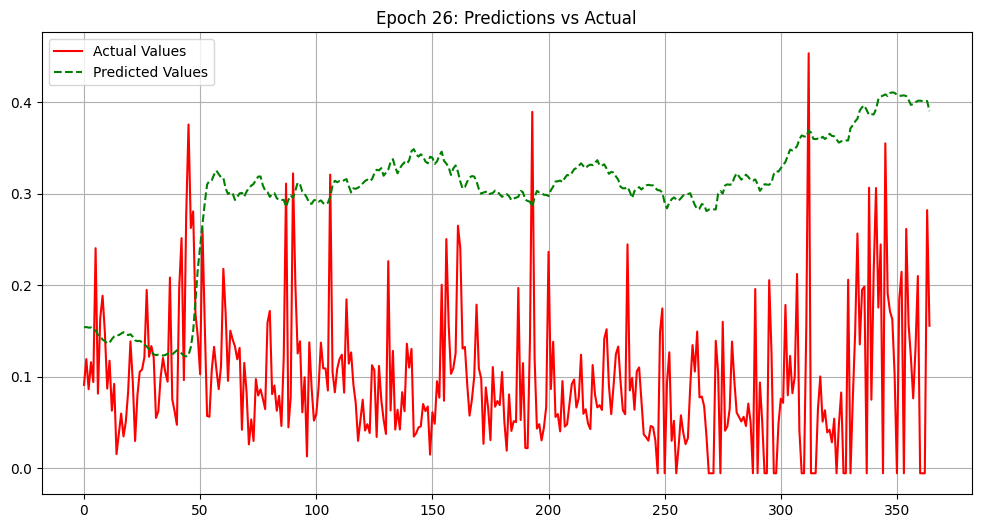

Epoch: 27 Loss: 0.00908994
Loss on test predictions: 0.03988557681441307


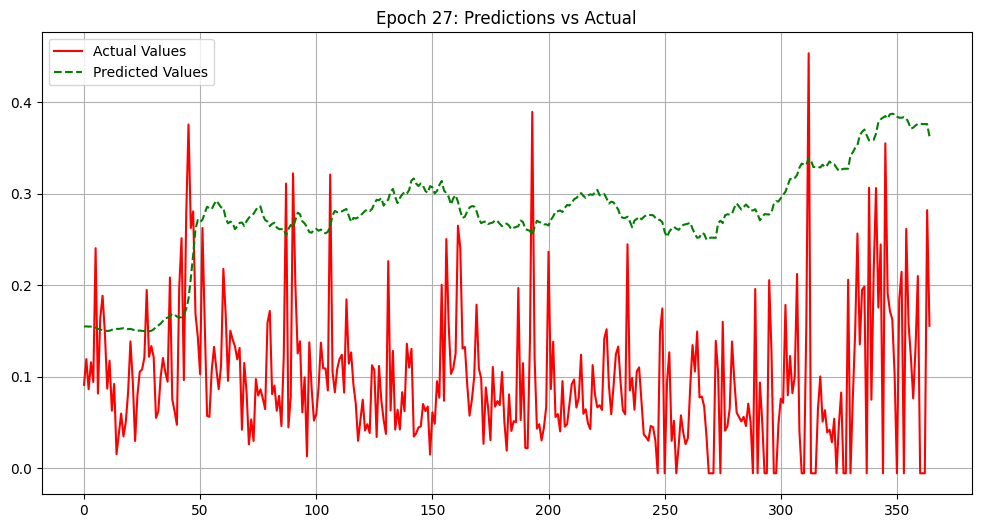

Epoch: 28 Loss: 0.00336600
Loss on test predictions: 0.08328213542699814


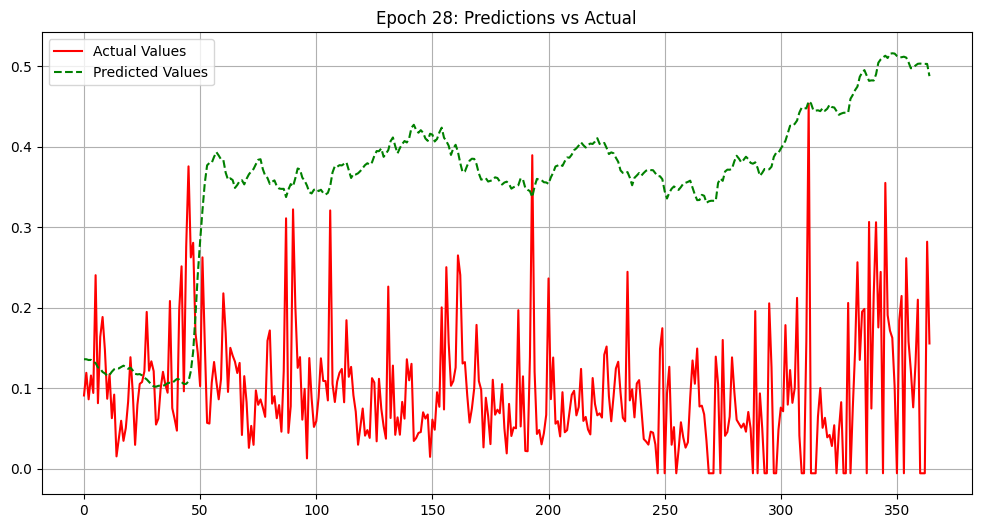

Epoch: 29 Loss: 0.01690779
Loss on test predictions: 0.07030478864908218


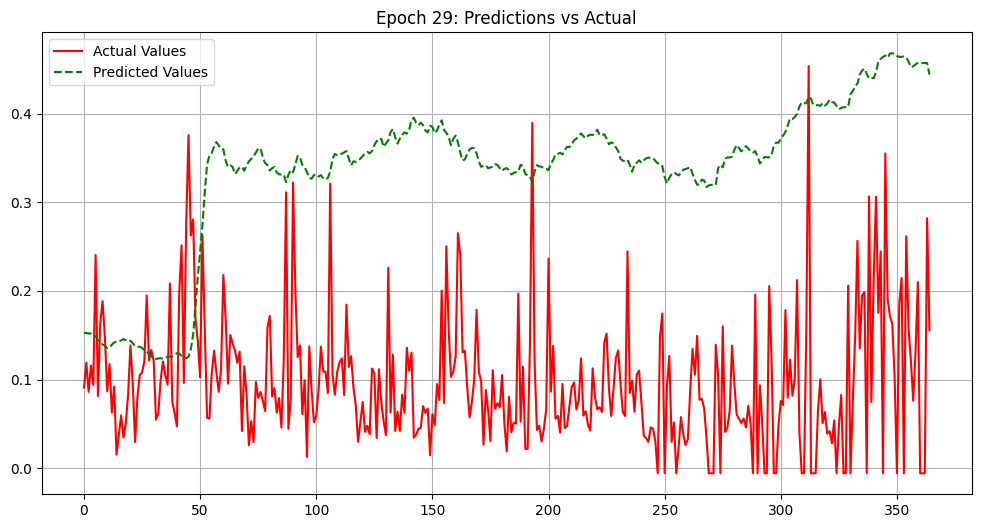

Epoch: 30 Loss: 0.00846253
Loss on test predictions: 0.05293845012784004


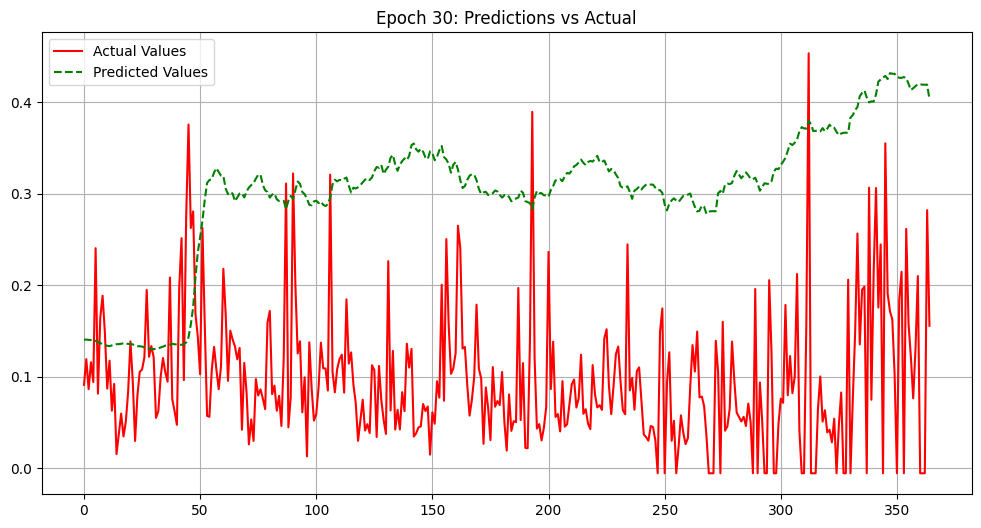

Epoch: 31 Loss: 0.00360347
Loss on test predictions: 0.07857971638441086


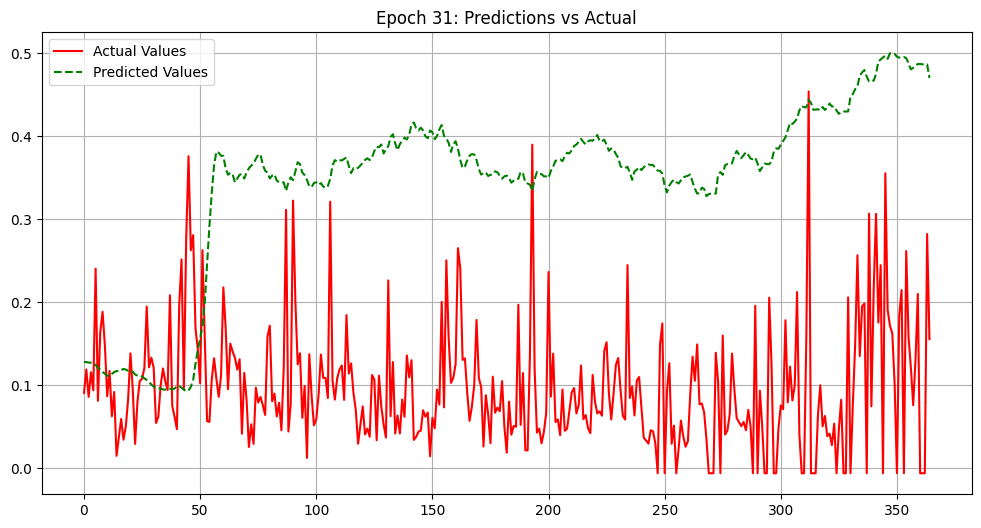

Epoch: 32 Loss: 0.00494939
Loss on test predictions: 0.06595095992088318


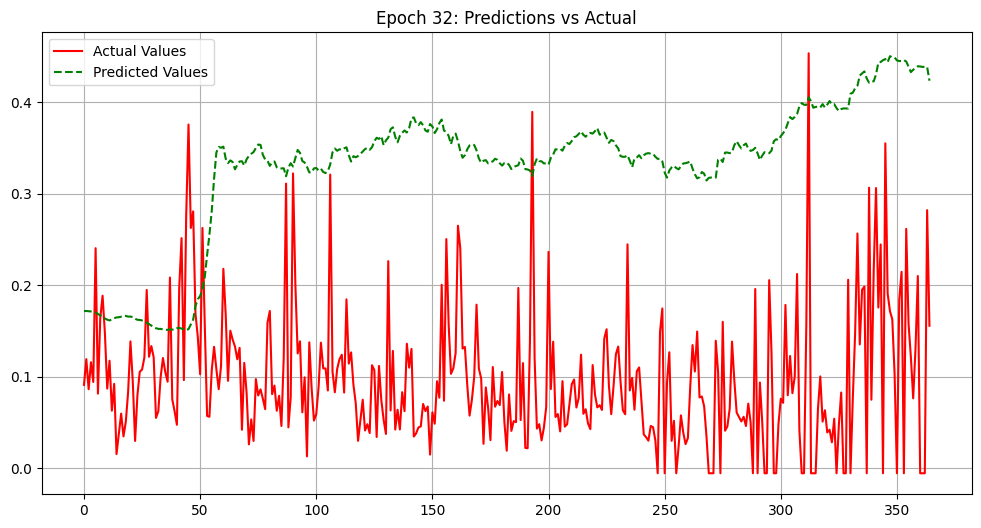

Epoch: 33 Loss: 0.00167971
Loss on test predictions: 0.07146140933036804


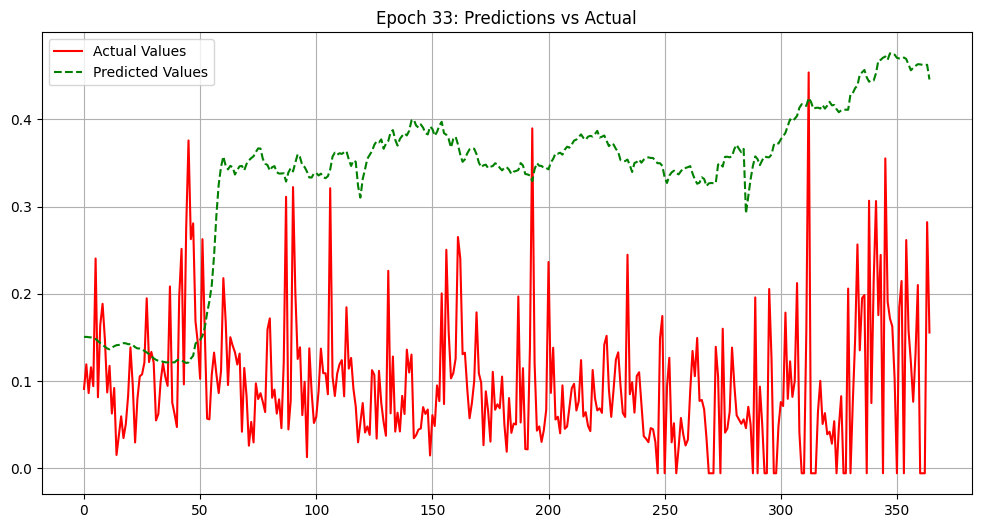

Epoch: 34 Loss: 0.00551869
Loss on test predictions: 0.09836526960134506


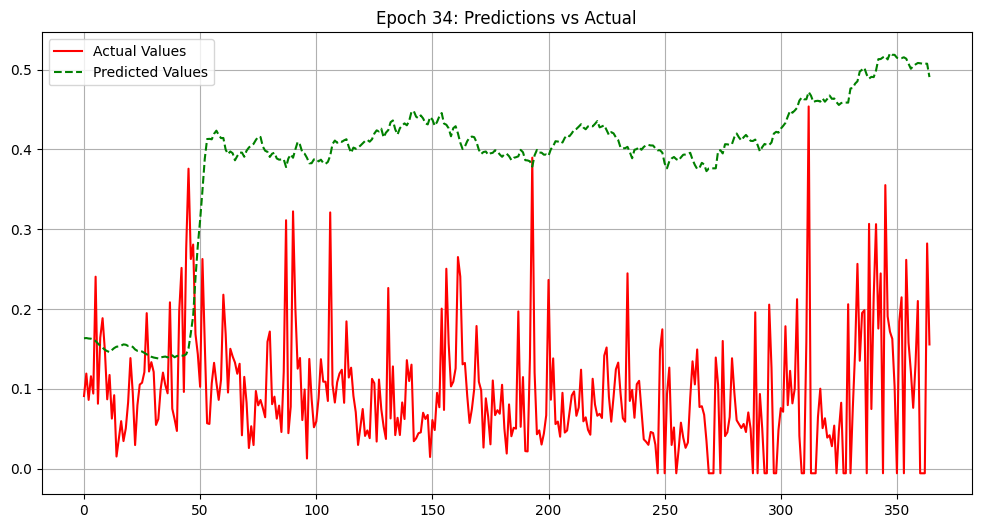

Epoch: 35 Loss: 0.00830126
Loss on test predictions: 0.054966505616903305


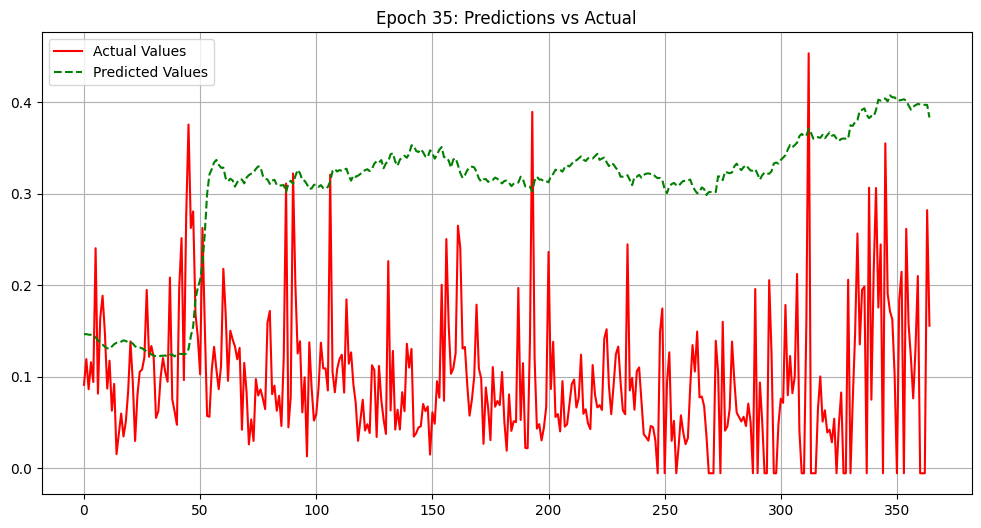

Epoch: 36 Loss: 0.00253235
Loss on test predictions: 0.05617670714855194


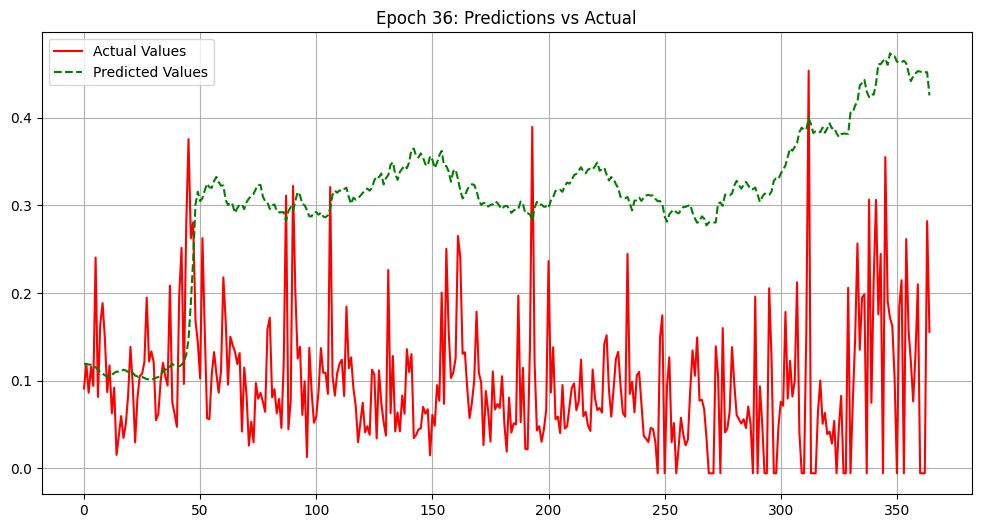

Epoch: 37 Loss: 0.00381700
Loss on test predictions: 0.05418333411216736


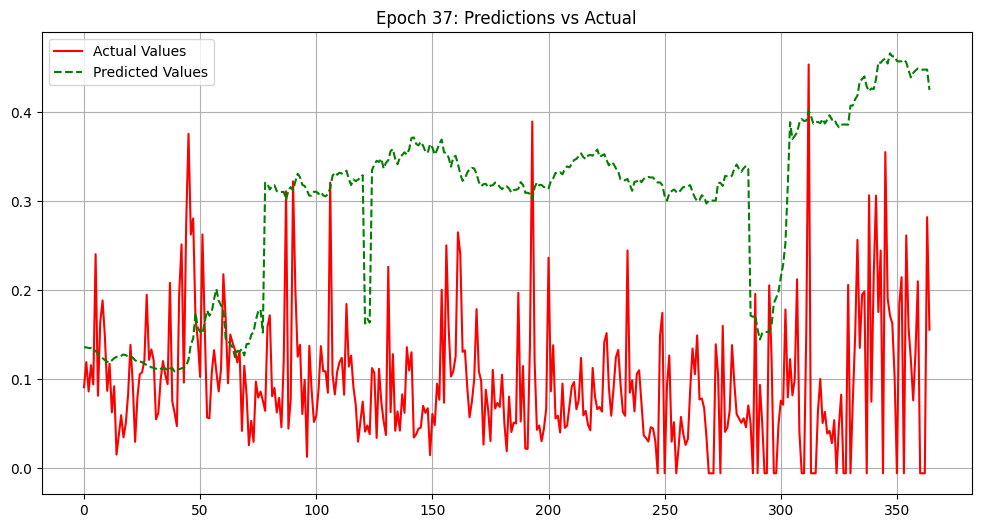

Epoch: 38 Loss: 0.01091246
Loss on test predictions: 0.07936455309391022


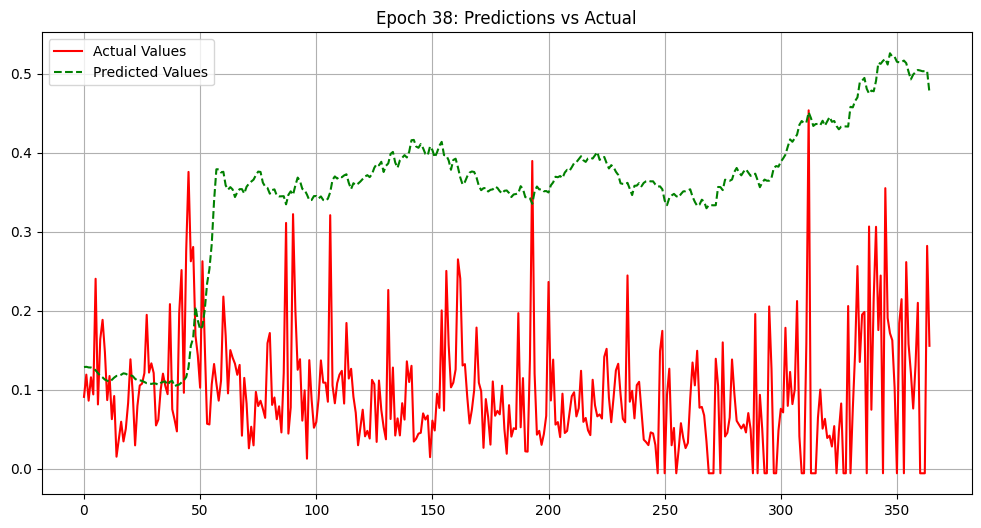

Epoch: 39 Loss: 0.00545912
Loss on test predictions: 0.05855023115873337


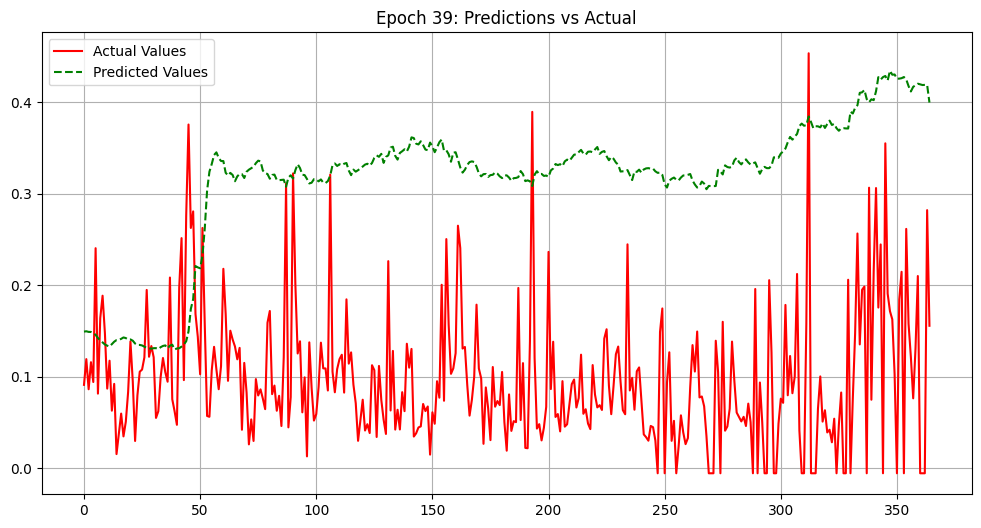

Epoch: 40 Loss: 0.00157206
Loss on test predictions: 0.07446928322315216


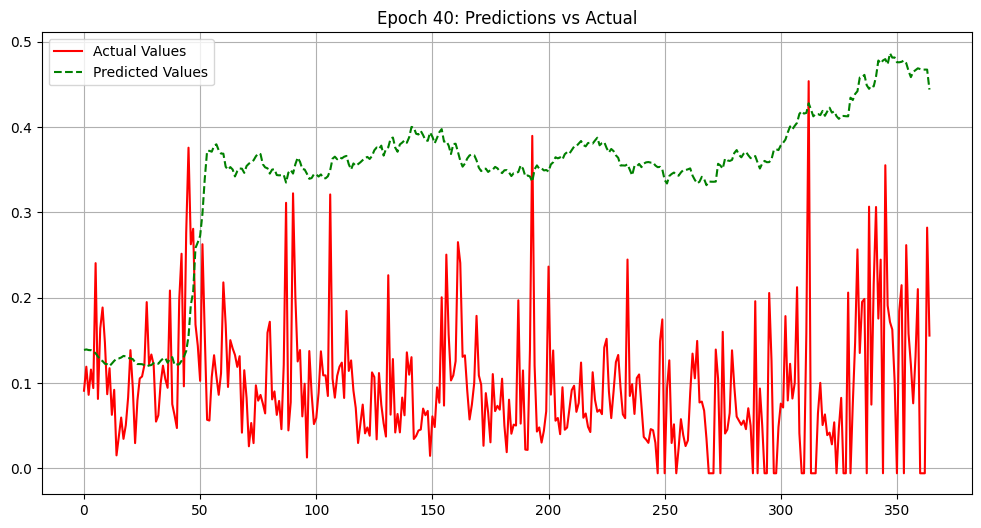

Epoch: 41 Loss: 0.00830745
Loss on test predictions: 0.06537602841854095


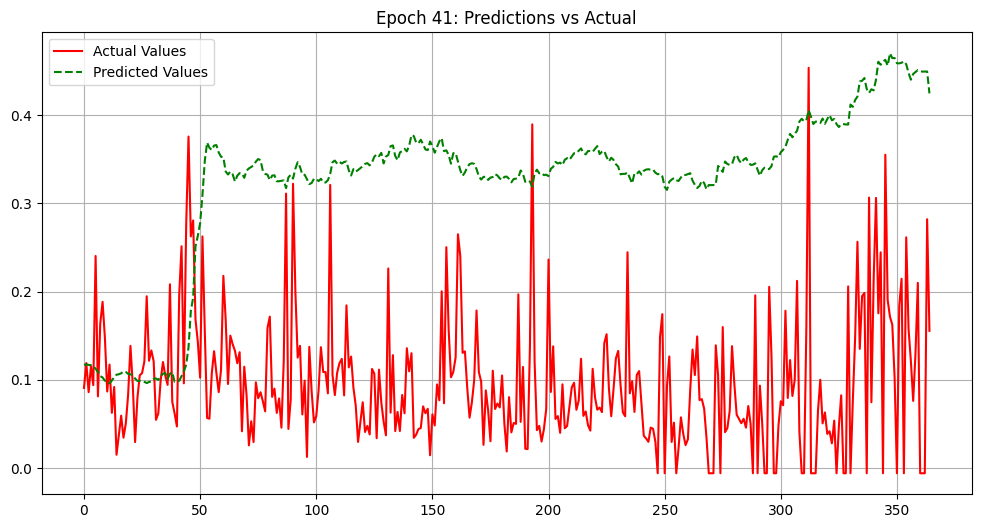

Epoch: 42 Loss: 0.00473091
Loss on test predictions: 0.09063629806041718


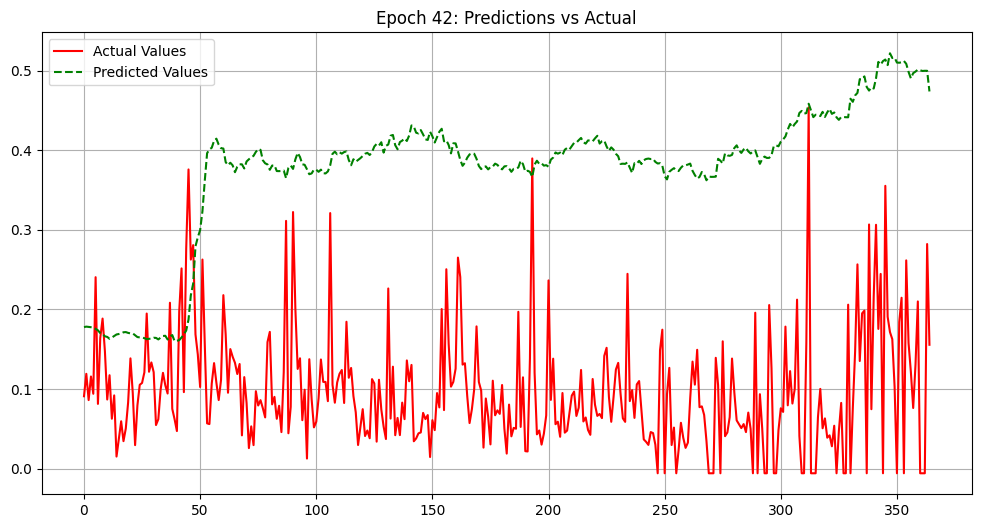

Epoch: 43 Loss: 0.00336549
Loss on test predictions: 0.045130498707294464


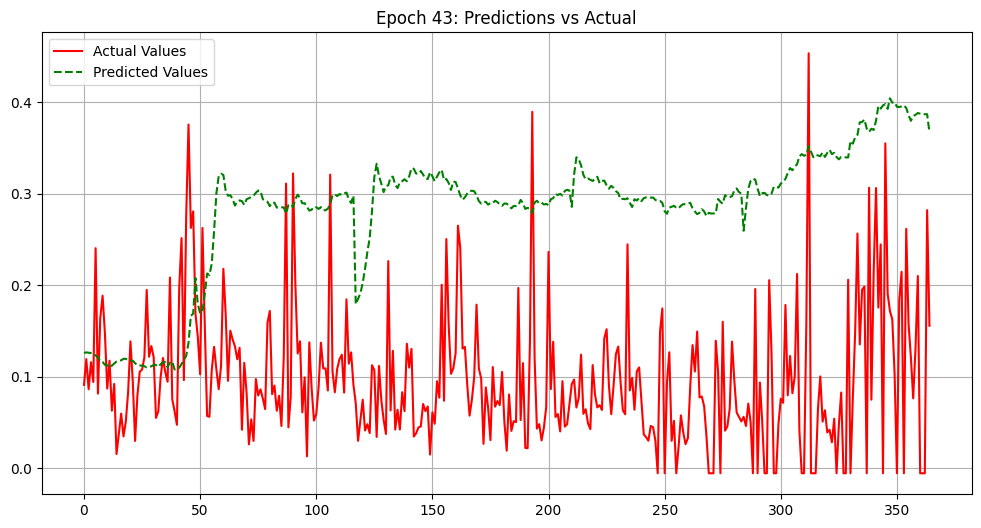

Epoch: 44 Loss: 0.00740920
Loss on test predictions: 0.06771782040596008


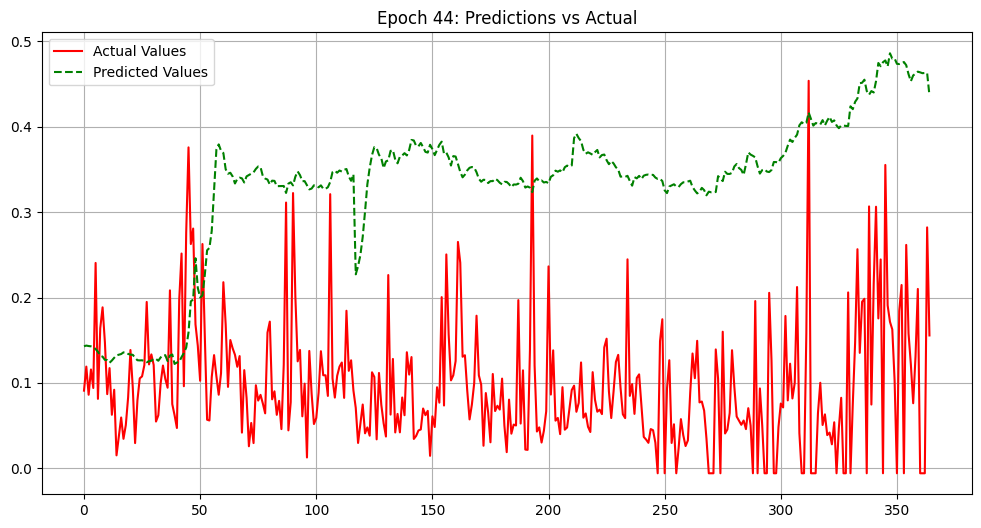

Epoch: 45 Loss: 0.00074028
Loss on test predictions: 0.043459028005599976


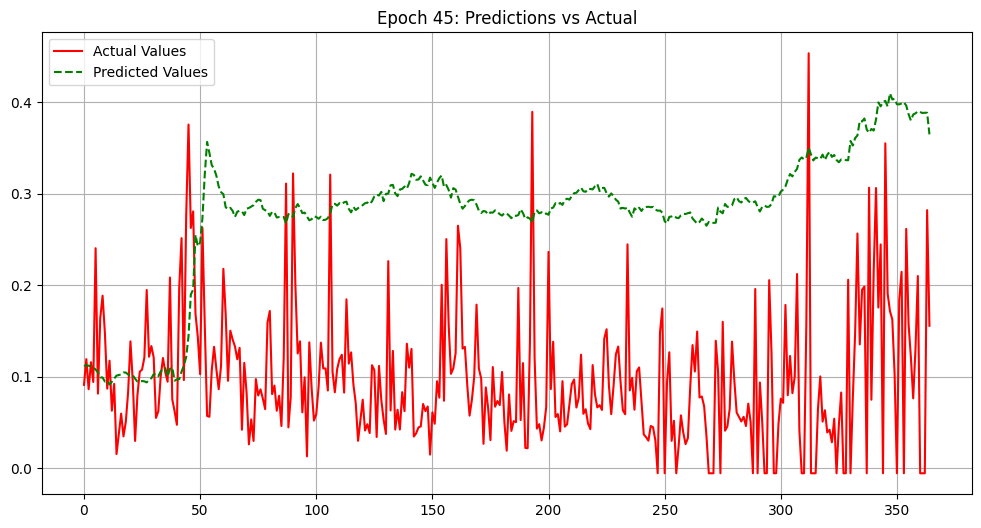

Epoch: 46 Loss: 0.00749879
Loss on test predictions: 0.10987067967653275


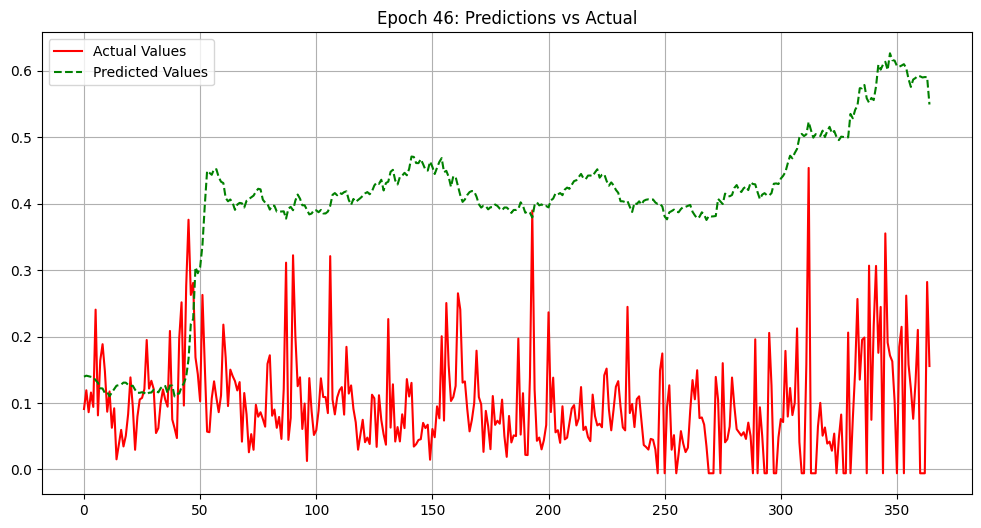

Epoch: 47 Loss: 0.00180165
Loss on test predictions: 0.09634147584438324


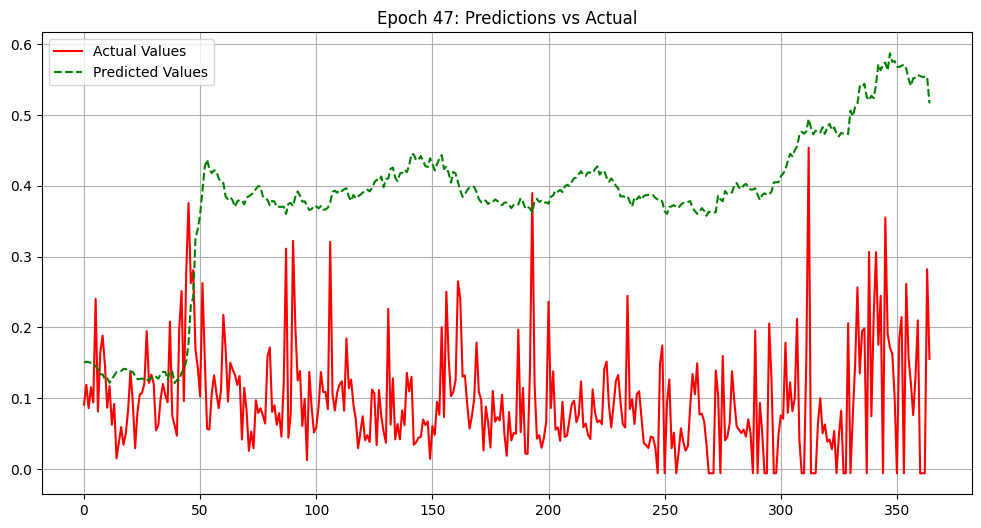

Epoch: 48 Loss: 0.00988058
Loss on test predictions: 0.03782179206609726


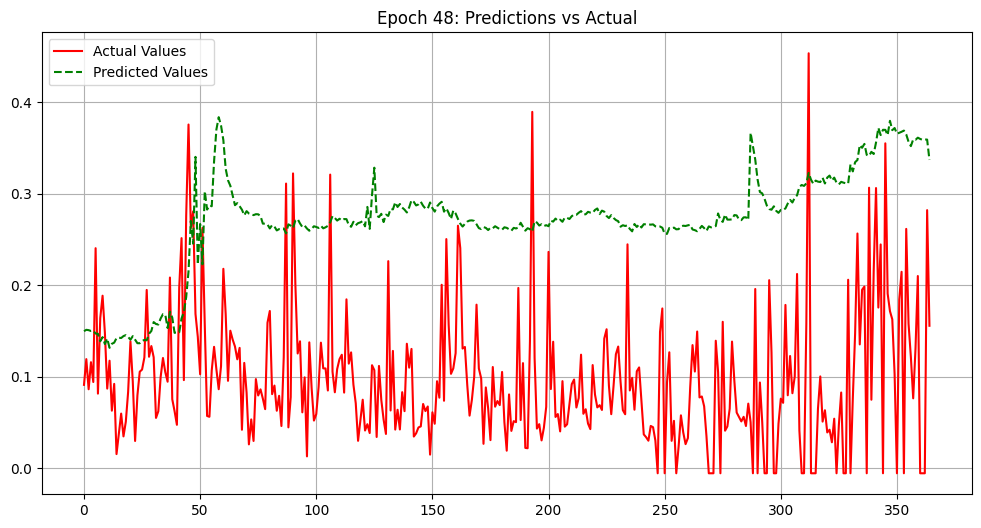

Epoch: 49 Loss: 0.00564037
Loss on test predictions: 0.08241036534309387


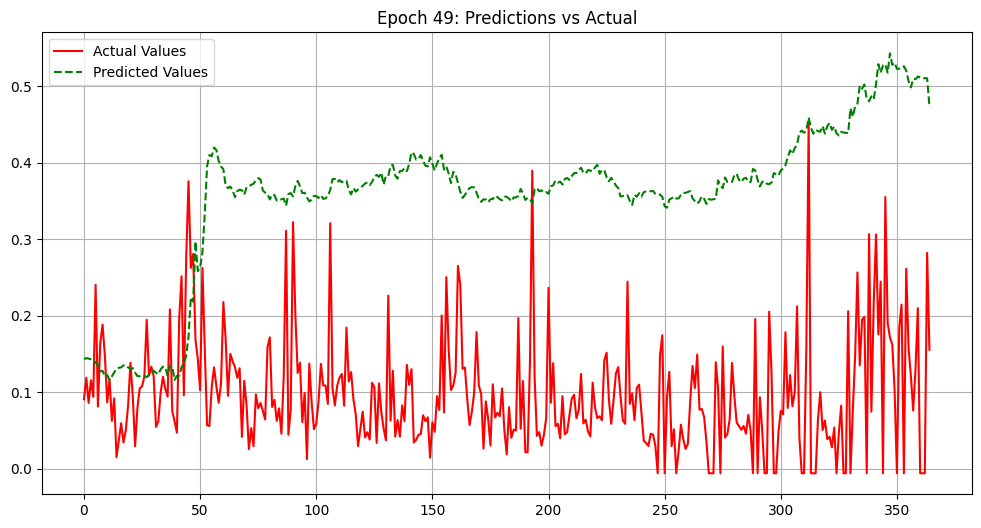

Epoch: 50 Loss: 0.00551808
Loss on test predictions: 0.06014779582619667


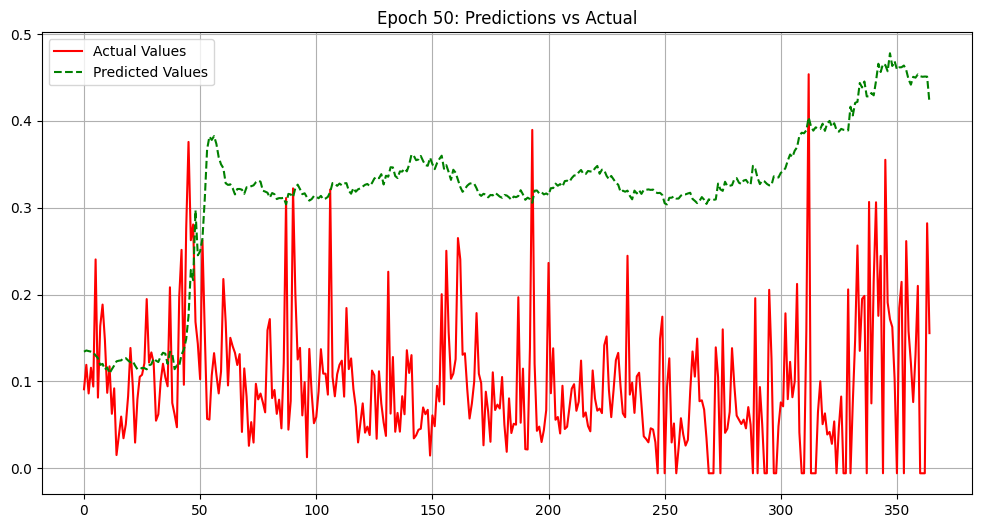

In [70]:
model = LSTM()
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

epochs = 50

for i in range(epochs):
    model.train()
    # tuple-unpack the train_data set
    for inputs, labels in train_loader:

        # reset the parameters and hidden states
        optimizer.zero_grad()

        y_pred = model(inputs)

        loss = criterion(y_pred, labels)
        loss.backward()
        optimizer.step()

    # print training result
    print(f'Epoch: {i+1:2} Loss: {loss.item():10.8f}')

    # MAKE PREDICTIONS
    with torch.no_grad():
      model.eval()  # Set the model to evaluation mode

      preds = []  # Use the last sequence for prediction

      for x in test_loader.dataset.tensors[0]:  # Get all test samples
                x_tensor = x.unsqueeze(0)  # Add batch dimension
                pred = model(x_tensor)
                preds.append(pred.item())

    # Get actual values from the test dataset
    actual = test_loader.dataset.tensors[1].numpy().flatten()

    # Calculate loss on test predictions
    test_loss = criterion(torch.tensor(preds).view(-1, 1), test_loader.dataset.tensors[1])
    print(f'Loss on test predictions: {test_loss.item()}')

    #plot
    plt.figure(figsize=(12, 6))
    plt.plot(actual, label='Actual Values', color='red')
    plt.plot(preds, label='Predicted Values', color='green', linestyle='--')
    plt.title(f'Epoch {i + 1}: Predictions vs Actual')
    plt.legend()
    plt.grid()
    plt.show()


Epoch:  1 Loss: 0.00636934
Loss on test predictions: 0.009387083351612091


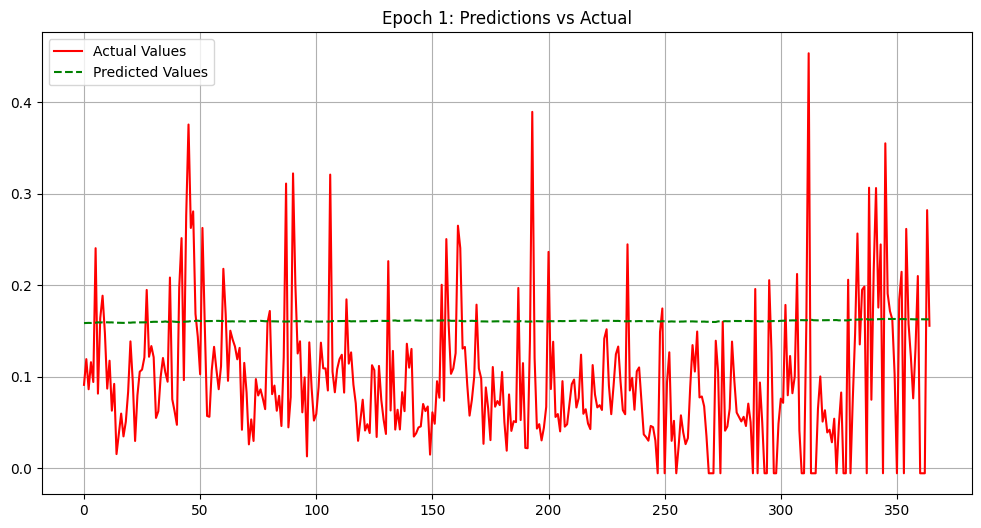

Epoch:  2 Loss: 0.00532942
Loss on test predictions: 0.014162799343466759


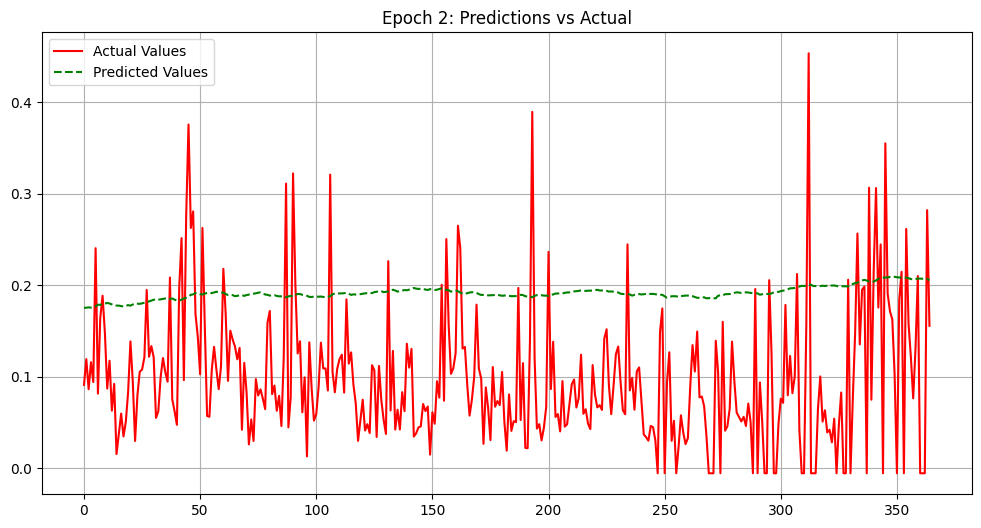

Epoch:  3 Loss: 0.02085036
Loss on test predictions: 0.01411483809351921


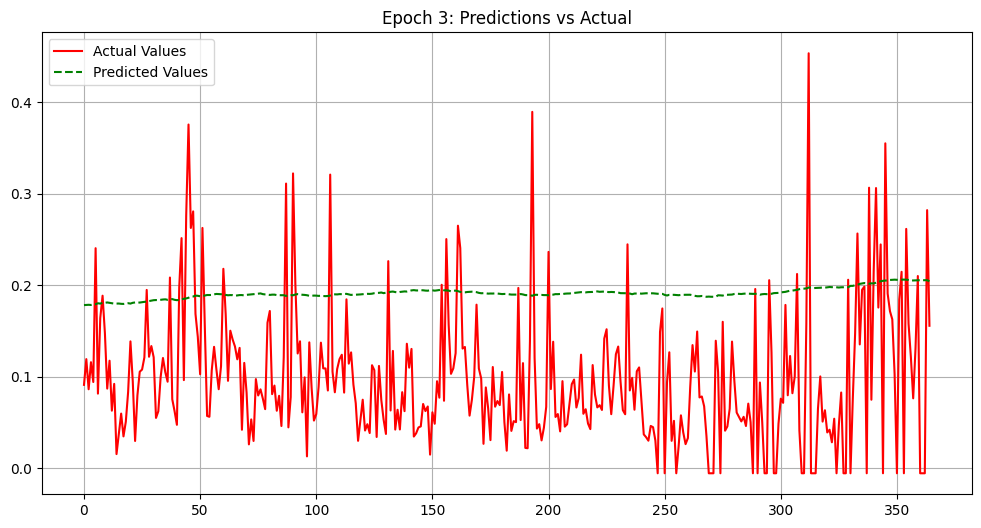

Epoch:  4 Loss: 0.01628546
Loss on test predictions: 0.01987958699464798


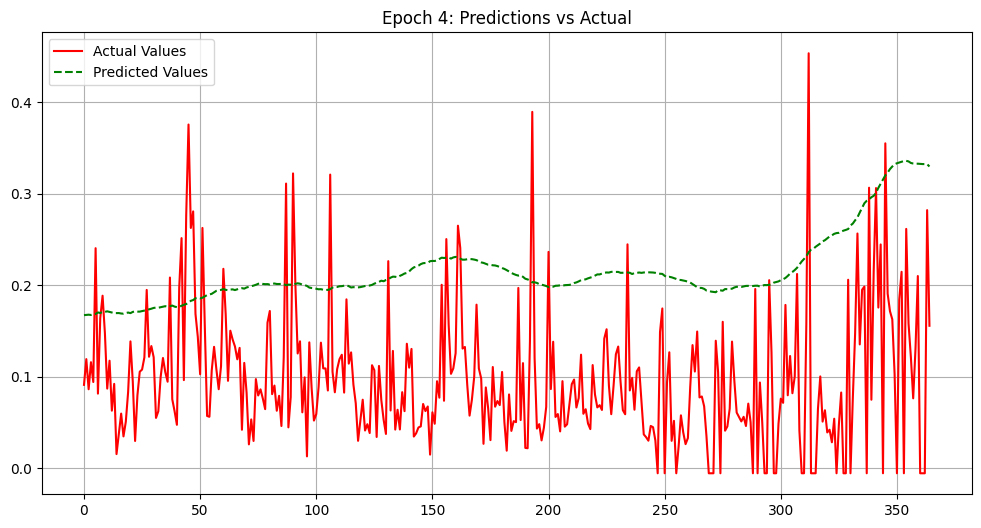

Epoch:  5 Loss: 0.00772431
Loss on test predictions: 0.025427067652344704


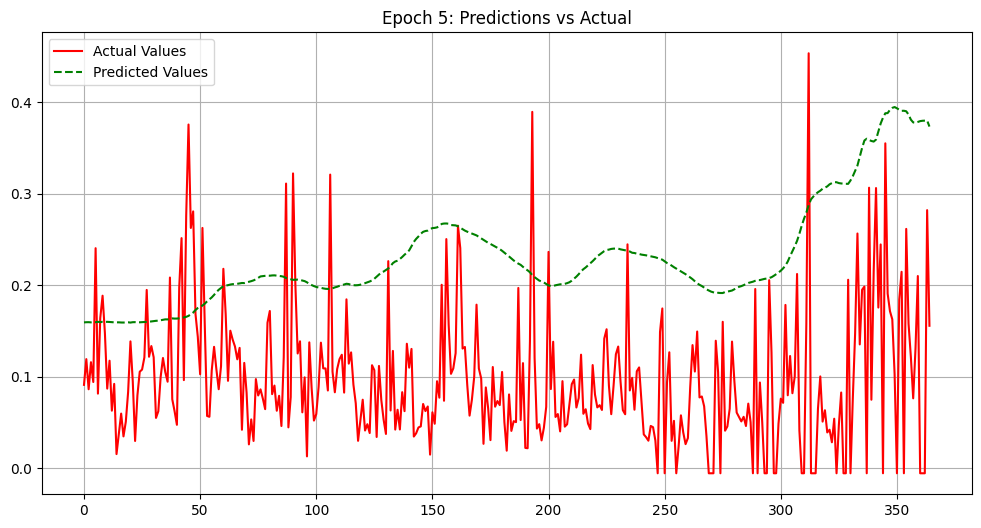

Epoch:  6 Loss: 0.00294639
Loss on test predictions: 0.040601857006549835


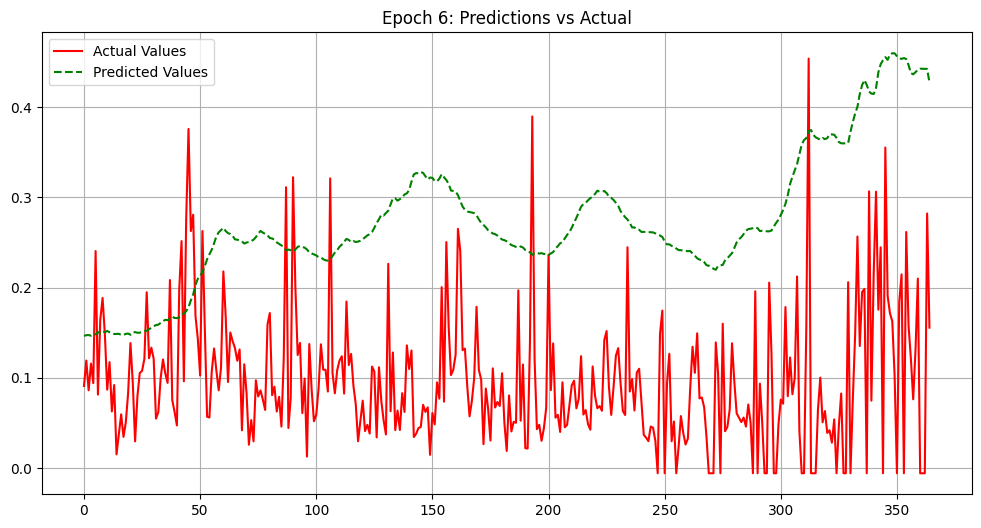

Epoch:  7 Loss: 0.00371509
Loss on test predictions: 0.02999275177717209


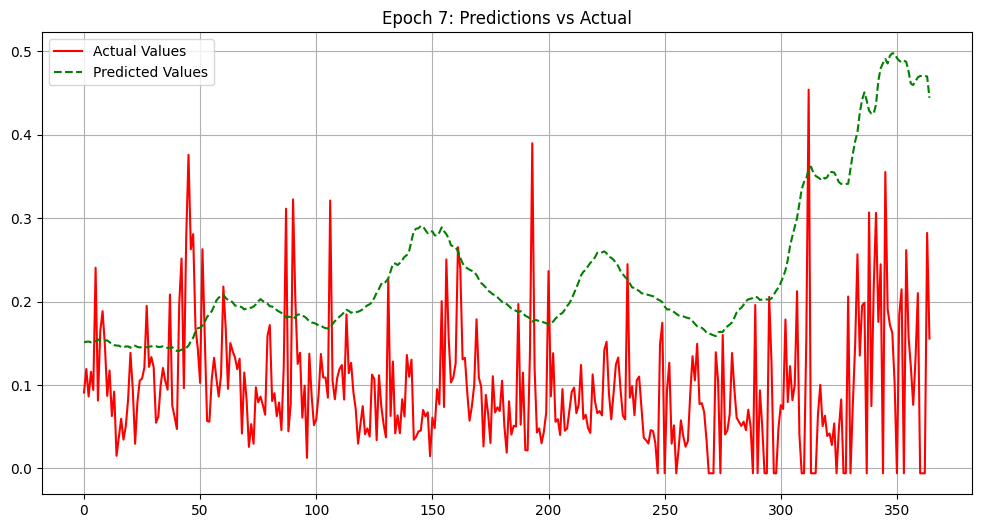

Epoch:  8 Loss: 0.00644496
Loss on test predictions: 0.03428621590137482


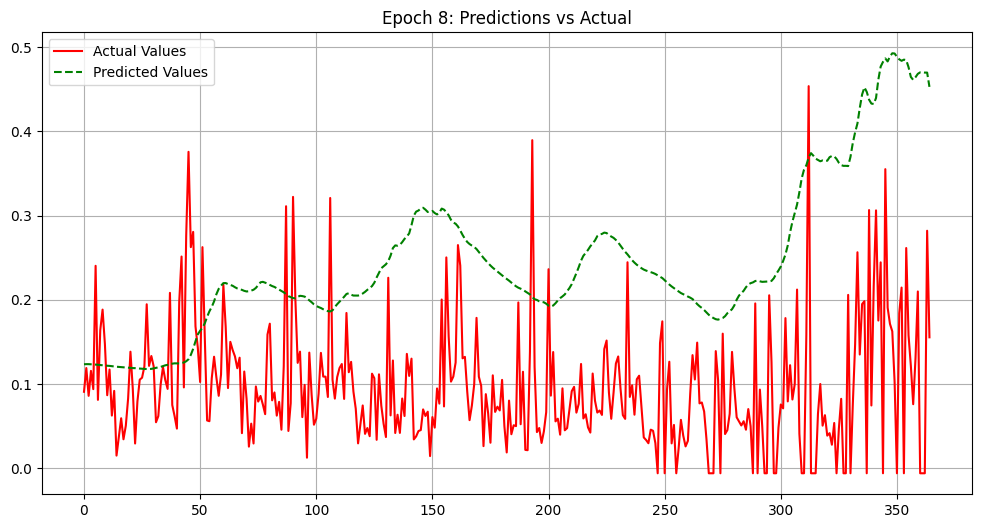

Epoch:  9 Loss: 0.00439335
Loss on test predictions: 0.05373246595263481


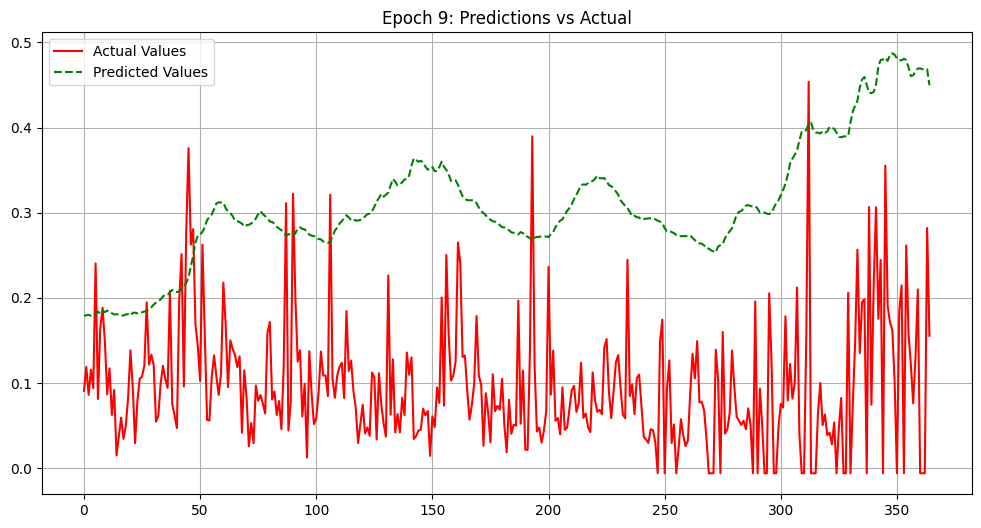

Epoch: 10 Loss: 0.01082593
Loss on test predictions: 0.06412109732627869


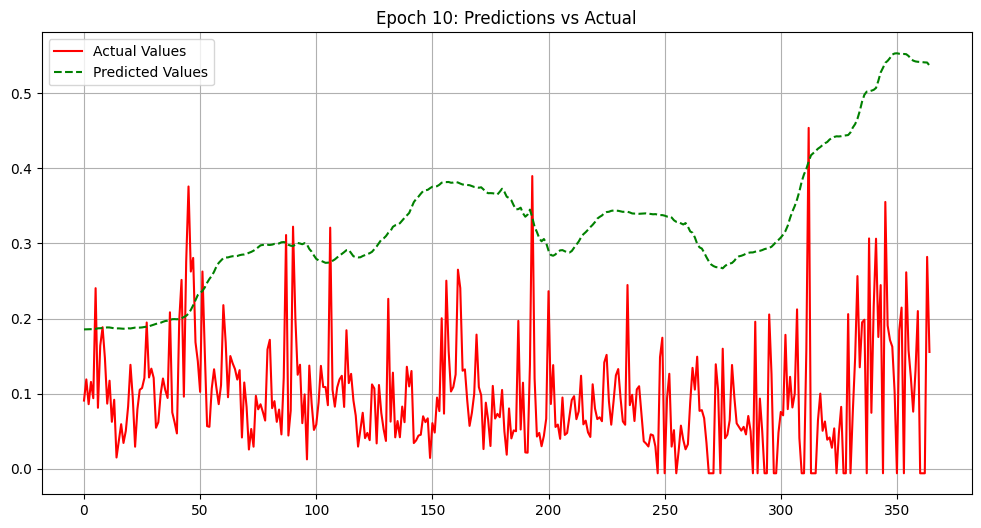

Epoch: 11 Loss: 0.00191911
Loss on test predictions: 0.04913489520549774


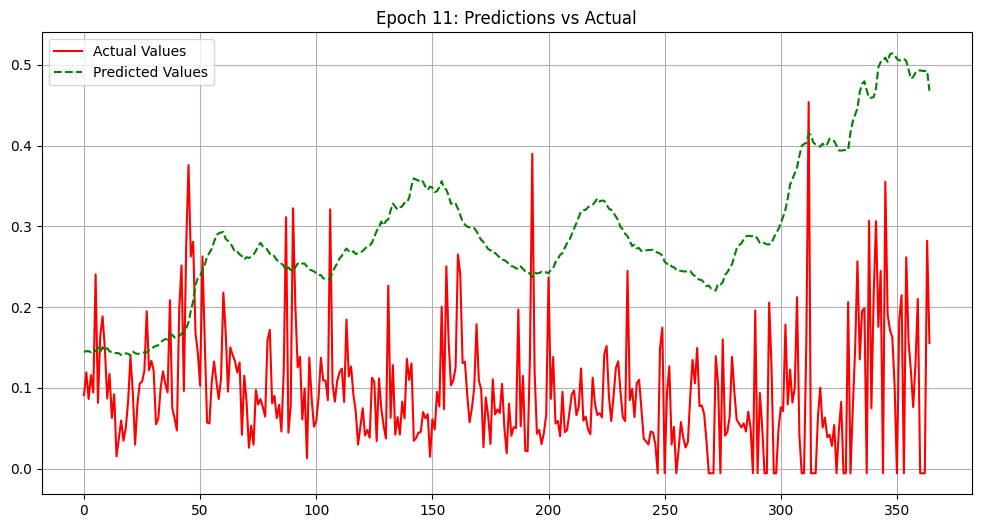

Epoch: 12 Loss: 0.00502830
Loss on test predictions: 0.017152853310108185


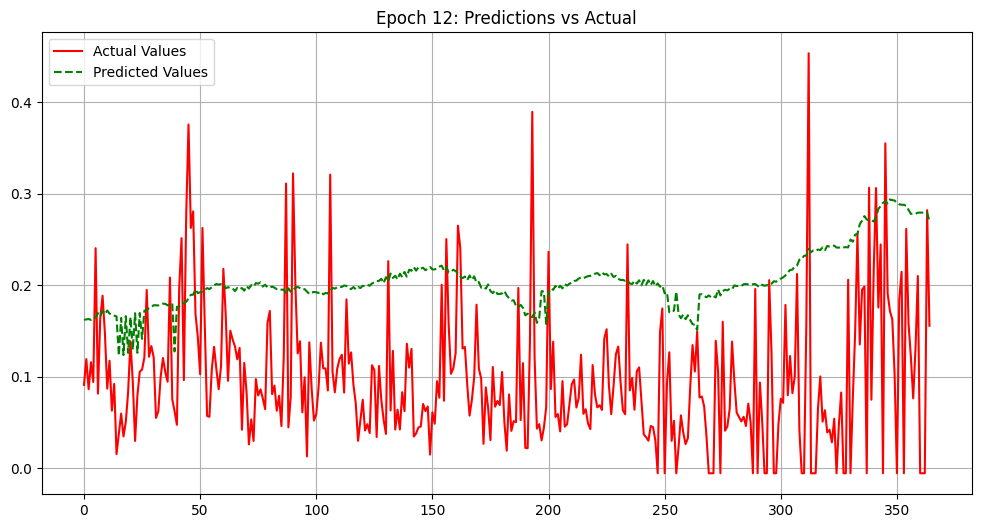

Epoch: 13 Loss: 0.00228349
Loss on test predictions: 0.05519154295325279


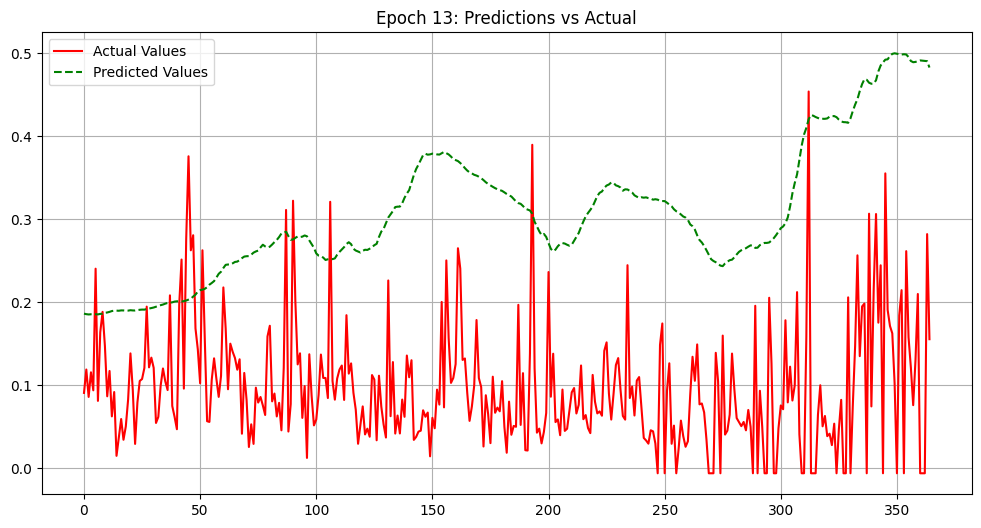

Epoch: 14 Loss: 0.01201638
Loss on test predictions: 0.053595613688230515


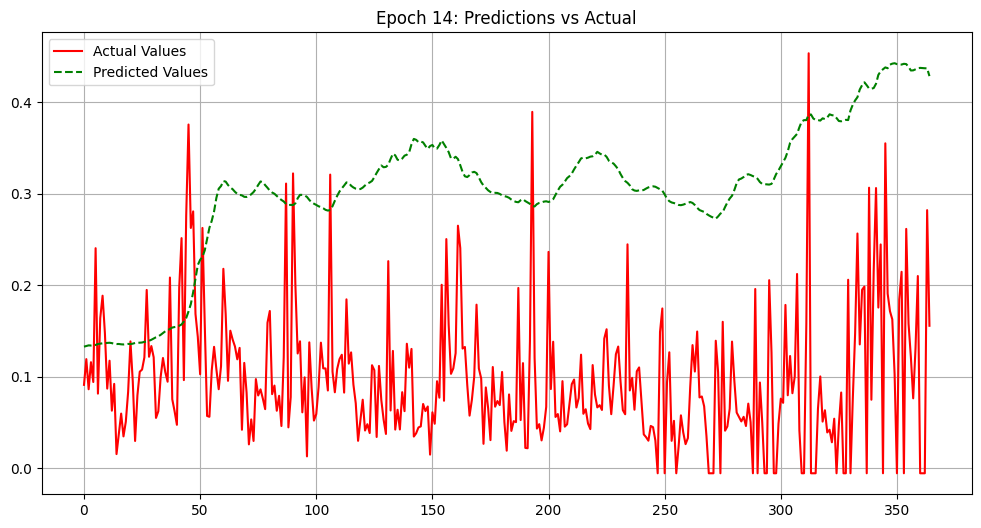

Epoch: 15 Loss: 0.00446730
Loss on test predictions: 0.055324260145425797


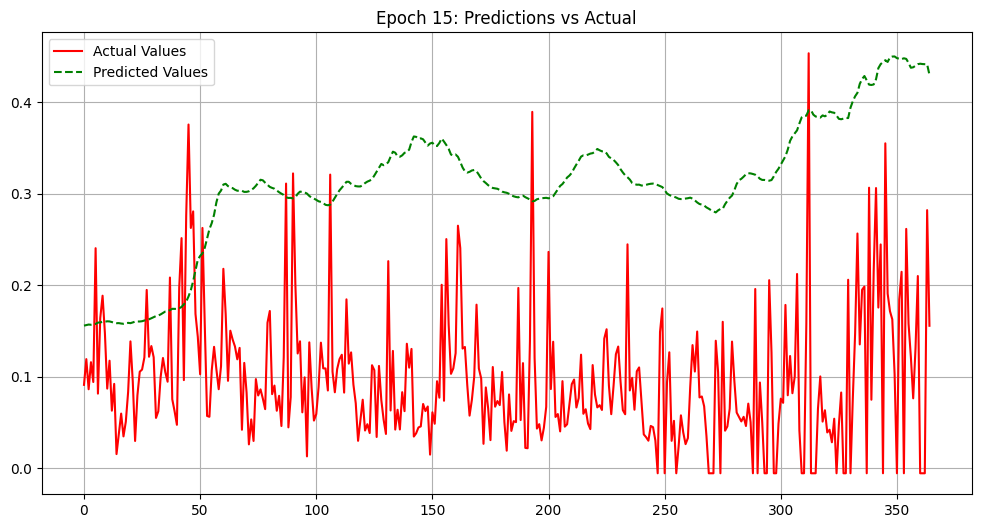

Epoch: 16 Loss: 0.00638692
Loss on test predictions: 0.08409112691879272


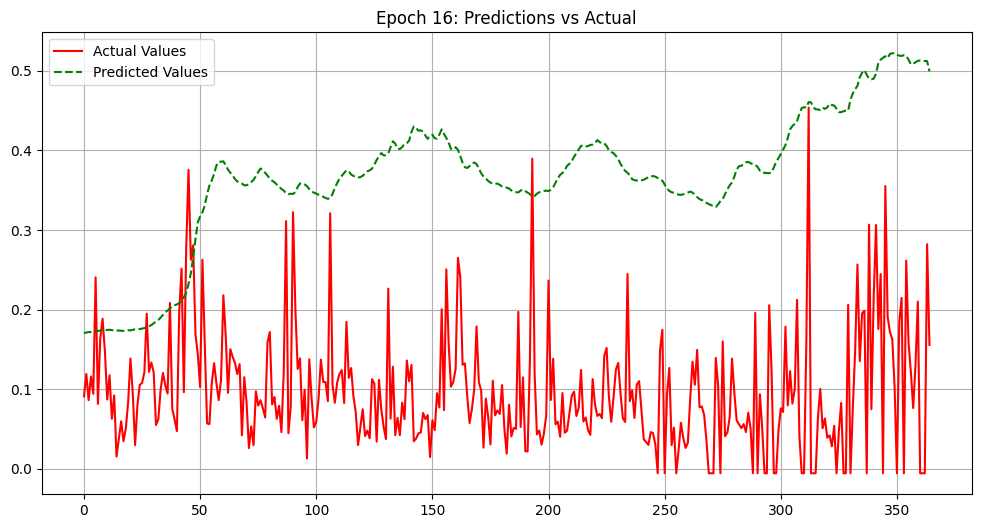

Epoch: 17 Loss: 0.00267154
Loss on test predictions: 0.04232447221875191


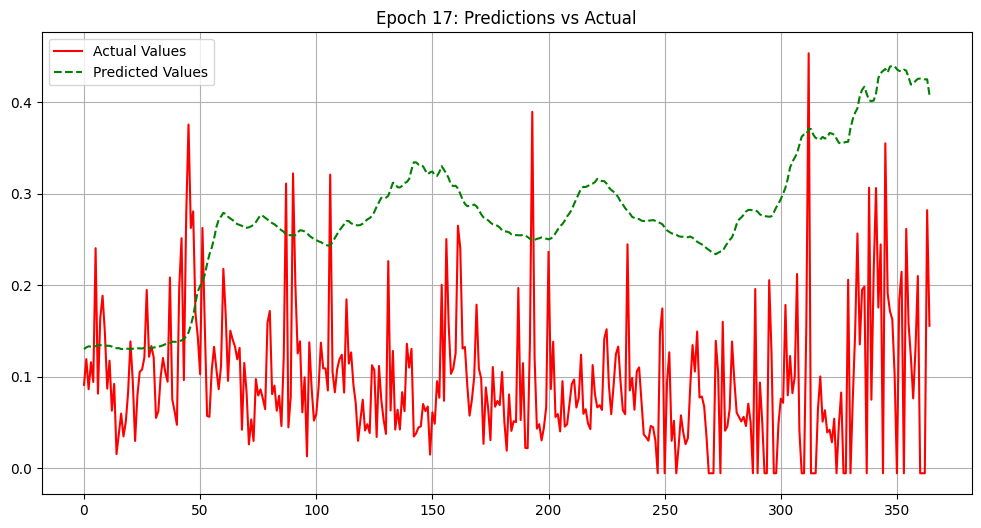

Epoch: 18 Loss: 0.00404229
Loss on test predictions: 0.049241501837968826


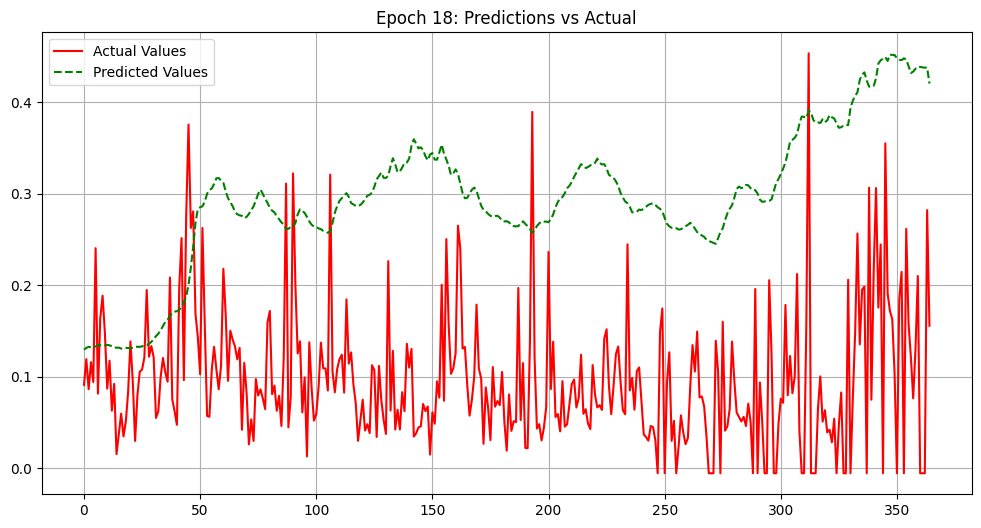

Epoch: 19 Loss: 0.00114073
Loss on test predictions: 0.037461984902620316


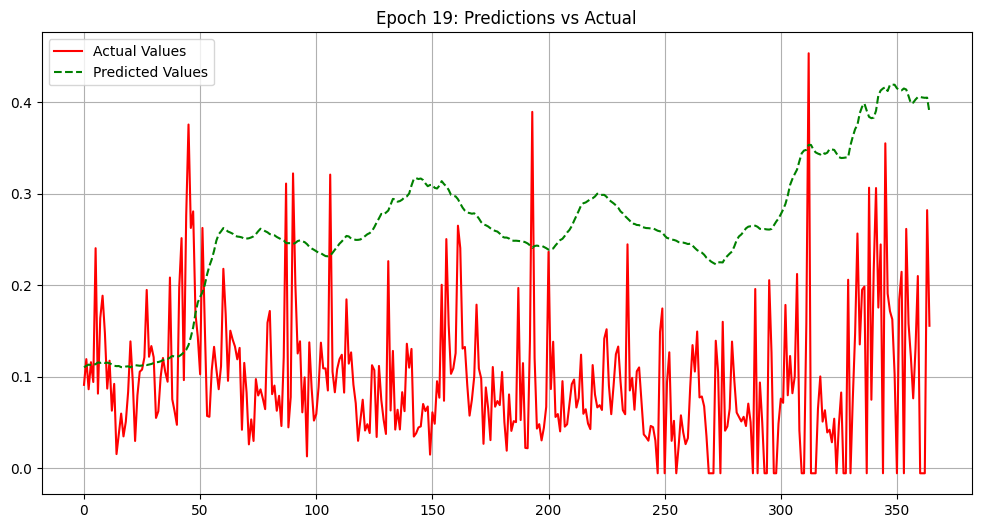

Epoch: 20 Loss: 0.00920952
Loss on test predictions: 0.05554552003741264


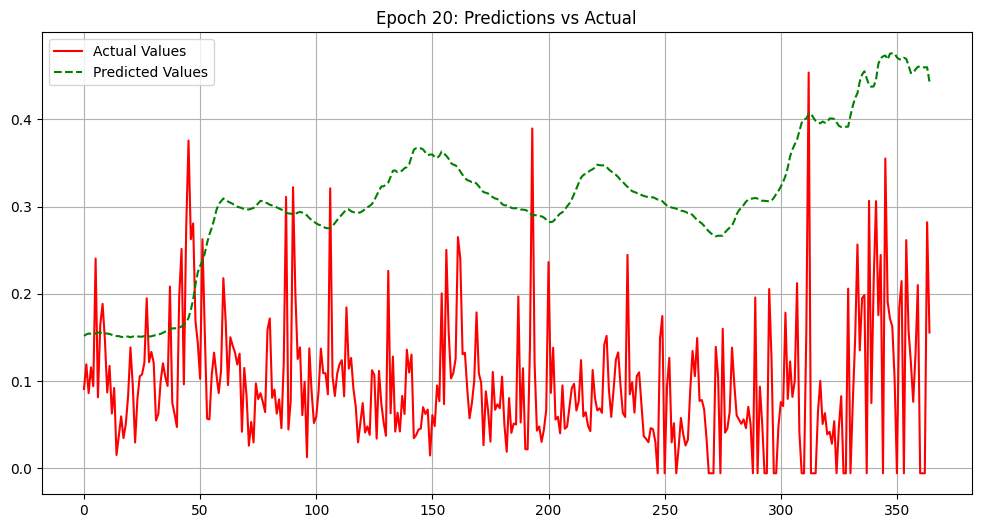

Epoch: 21 Loss: 0.00073888
Loss on test predictions: 0.020313361659646034


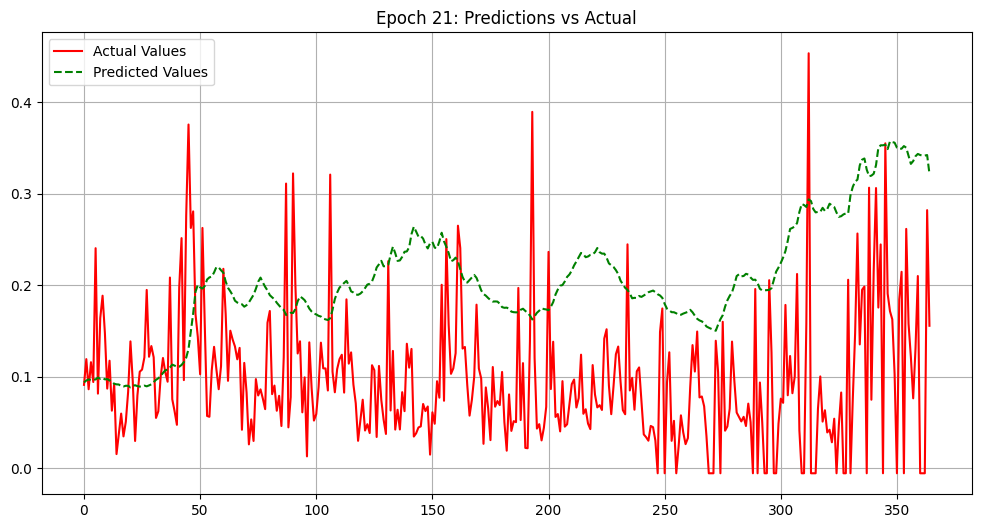

Epoch: 22 Loss: 0.00463246
Loss on test predictions: 0.04291249066591263


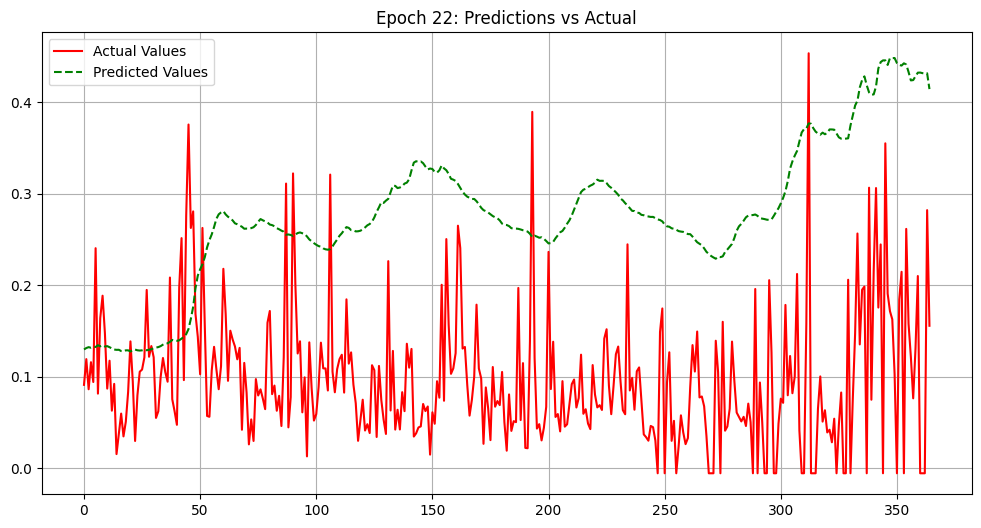

Epoch: 23 Loss: 0.00179858
Loss on test predictions: 0.042336370795965195


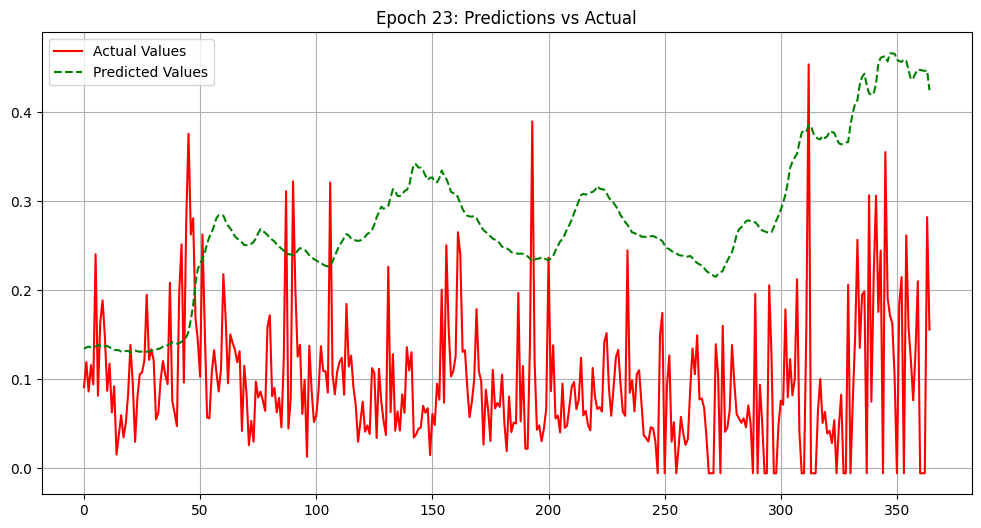

Epoch: 24 Loss: 0.00315813
Loss on test predictions: 0.05750235542654991


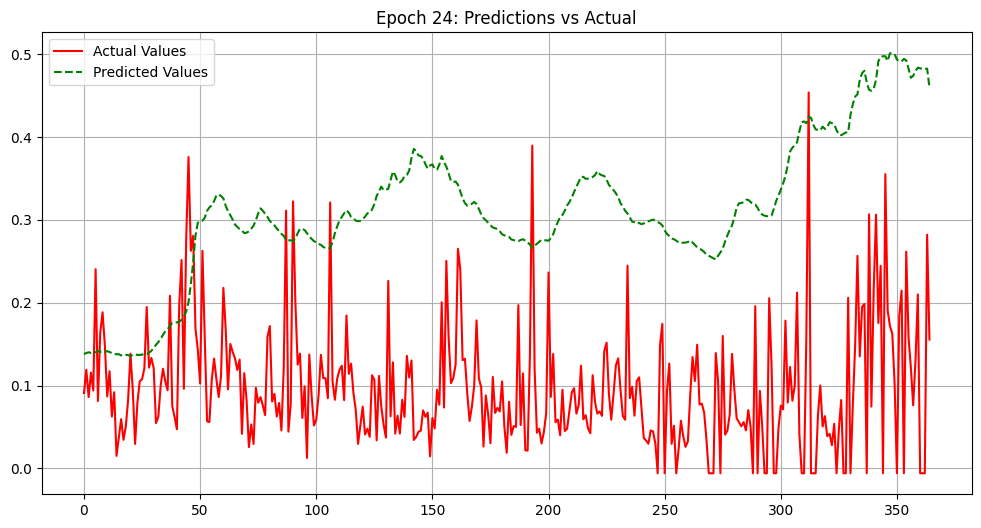

Epoch: 25 Loss: 0.00271300
Loss on test predictions: 0.04682086780667305


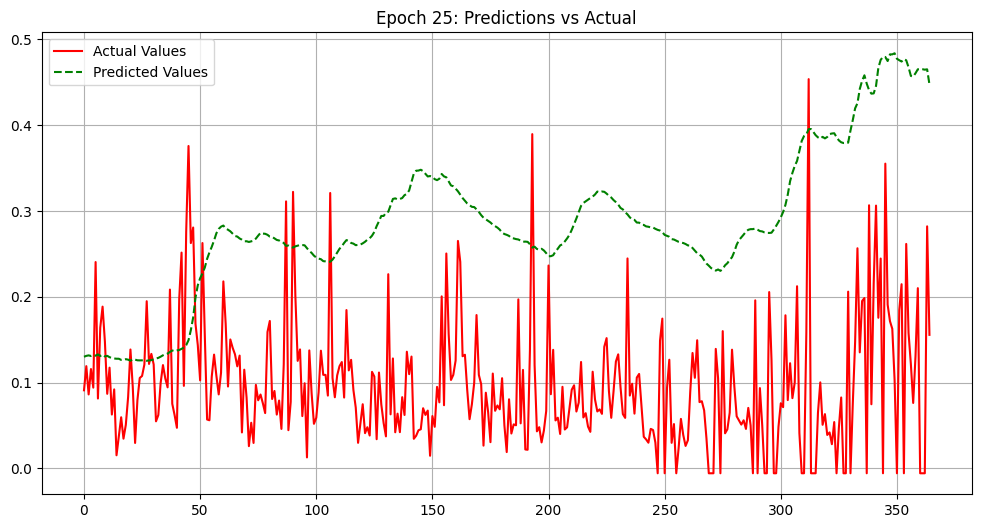

Epoch: 26 Loss: 0.00225384
Loss on test predictions: 0.04153462126851082


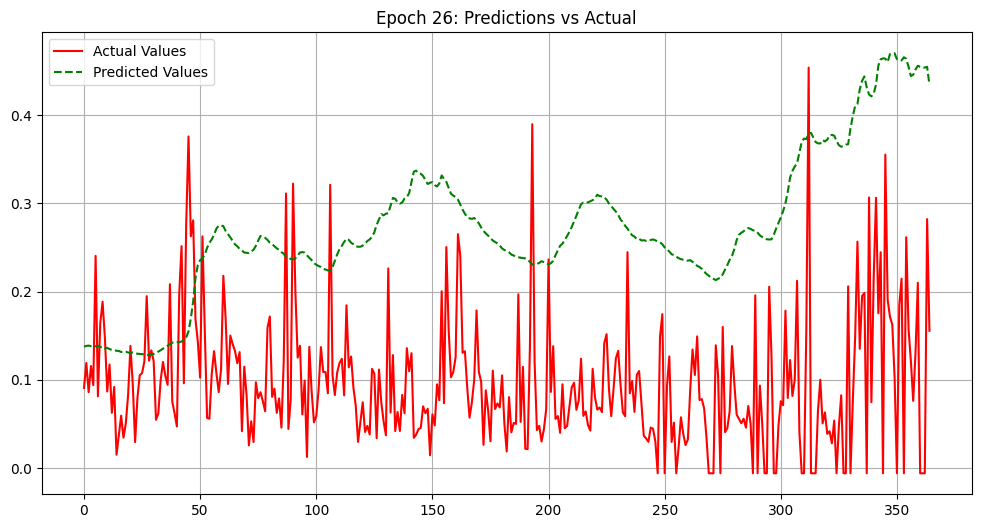

Epoch: 27 Loss: 0.00262628
Loss on test predictions: 0.05395011231303215


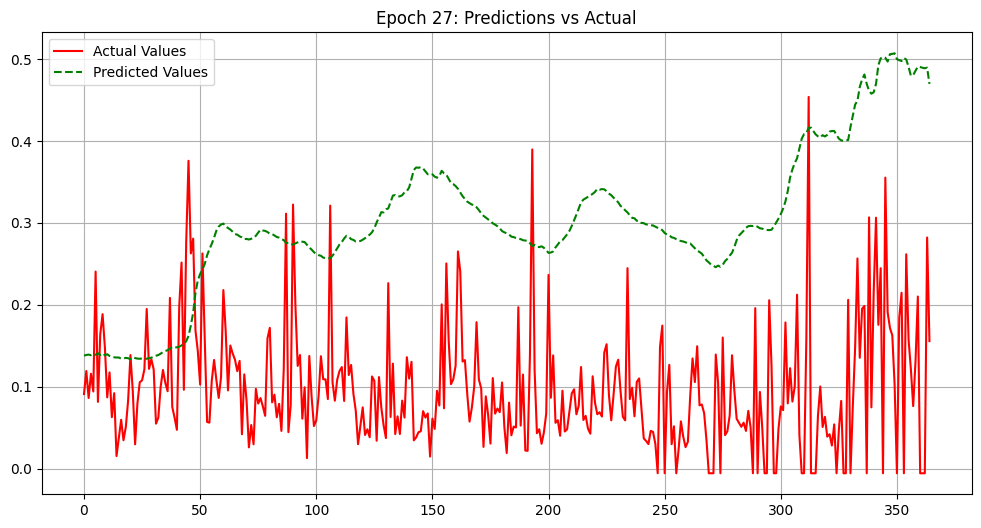

Epoch: 28 Loss: 0.00356099
Loss on test predictions: 0.022664399817585945


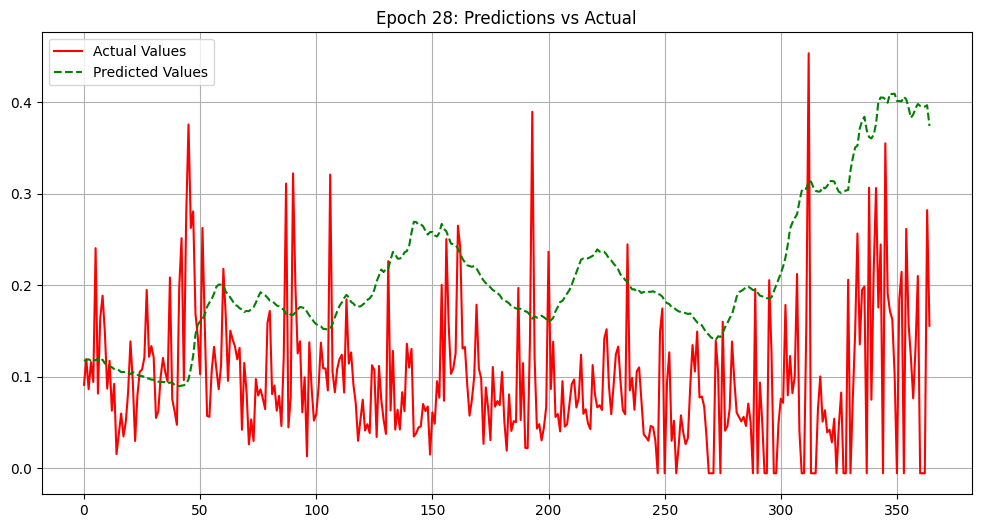

Epoch: 29 Loss: 0.00878296
Loss on test predictions: 0.05817558616399765


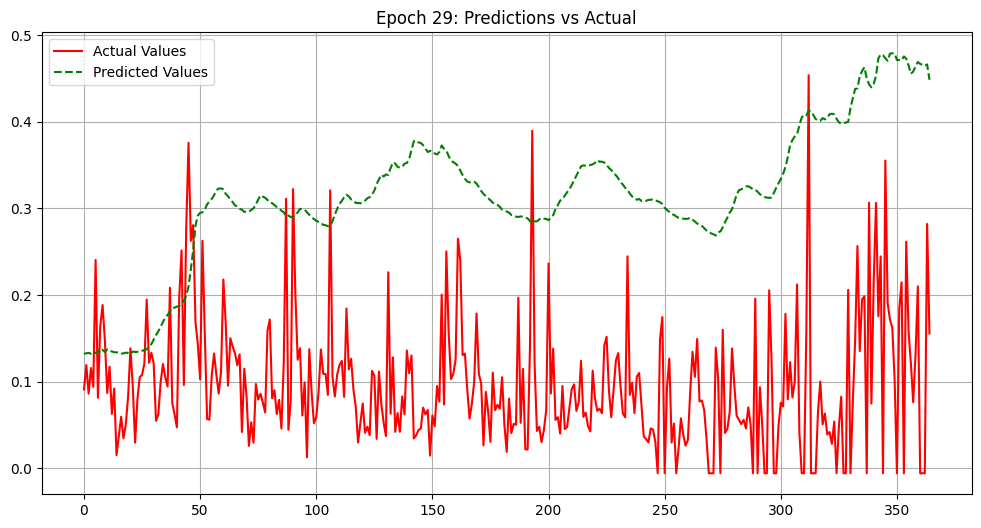

Epoch: 30 Loss: 0.00390560
Loss on test predictions: 0.04114513099193573


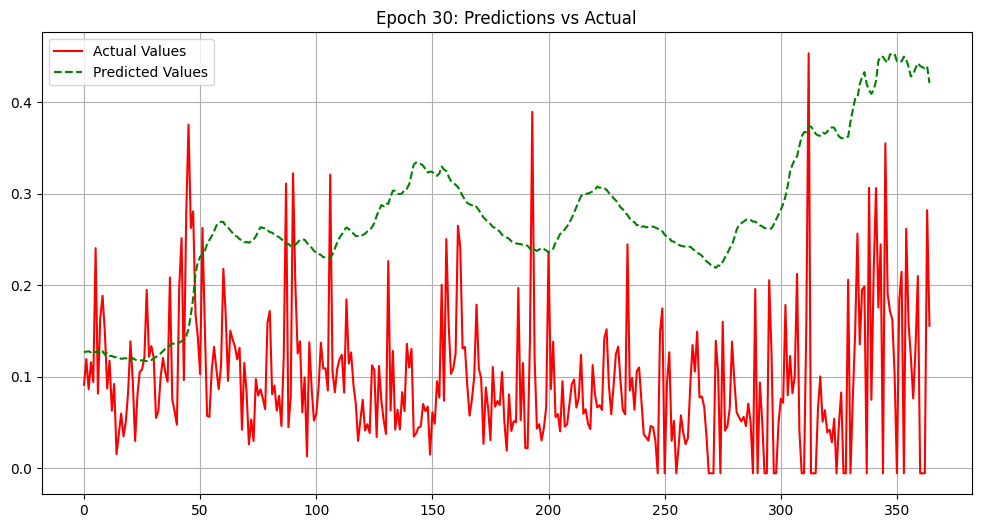

Epoch: 31 Loss: 0.00521677
Loss on test predictions: 0.038072727620601654


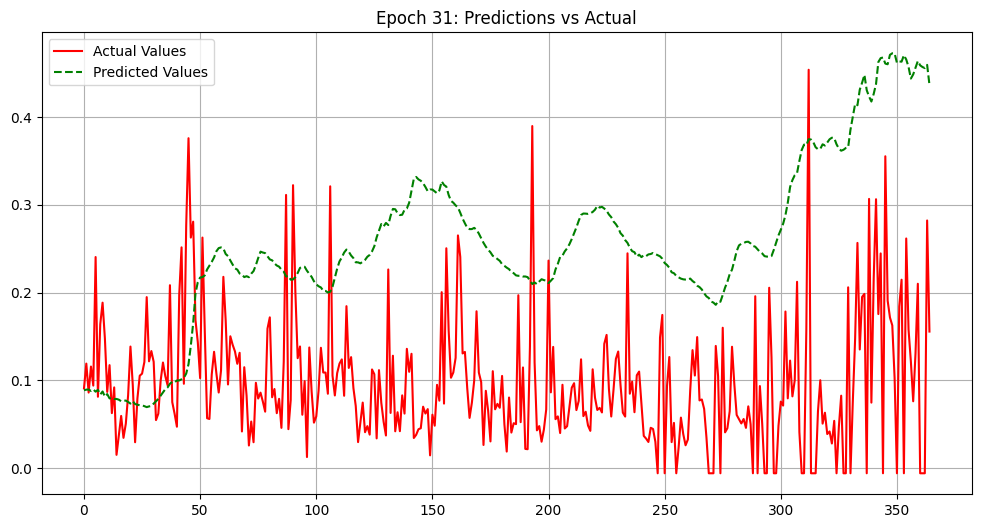

Epoch: 32 Loss: 0.00140803
Loss on test predictions: 0.035930875688791275


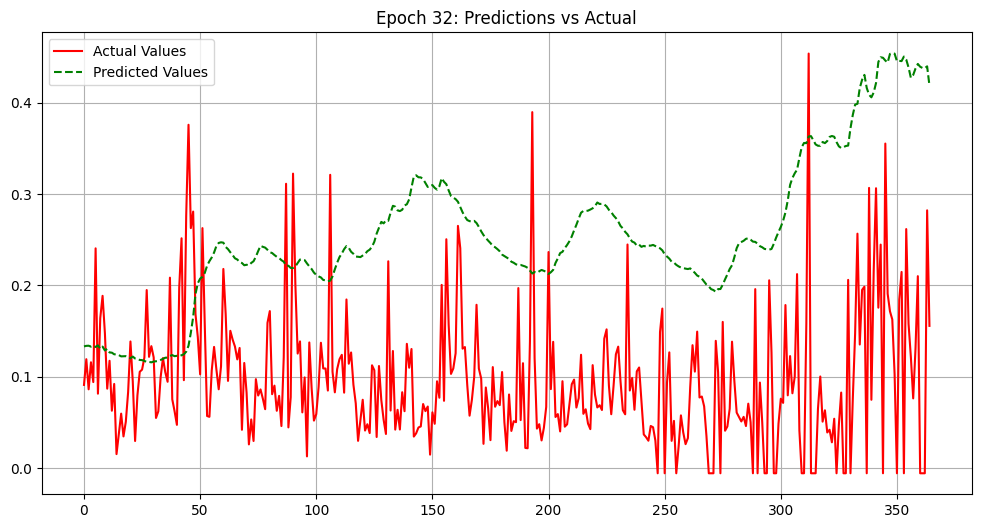

Epoch: 33 Loss: 0.03726933
Loss on test predictions: 0.044892121106386185


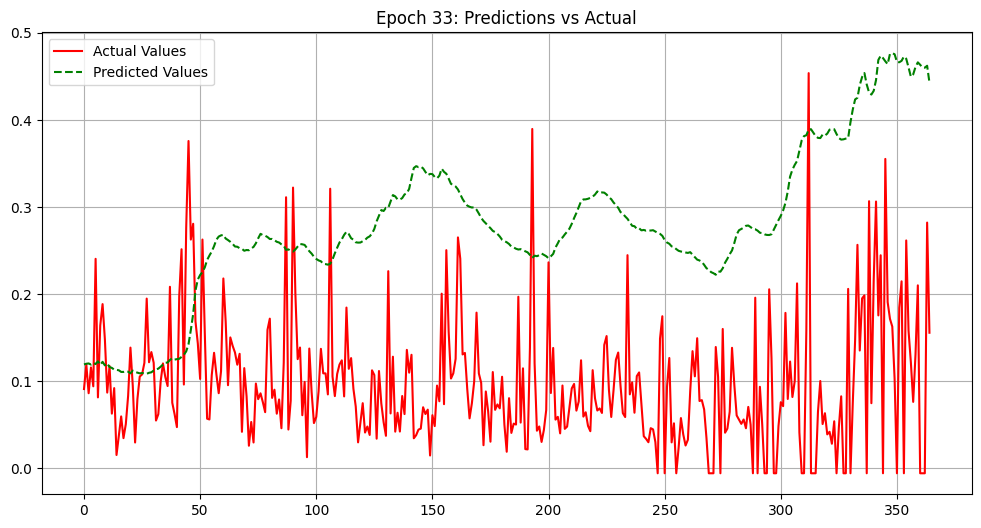

Epoch: 34 Loss: 0.00502494
Loss on test predictions: 0.04357397183775902


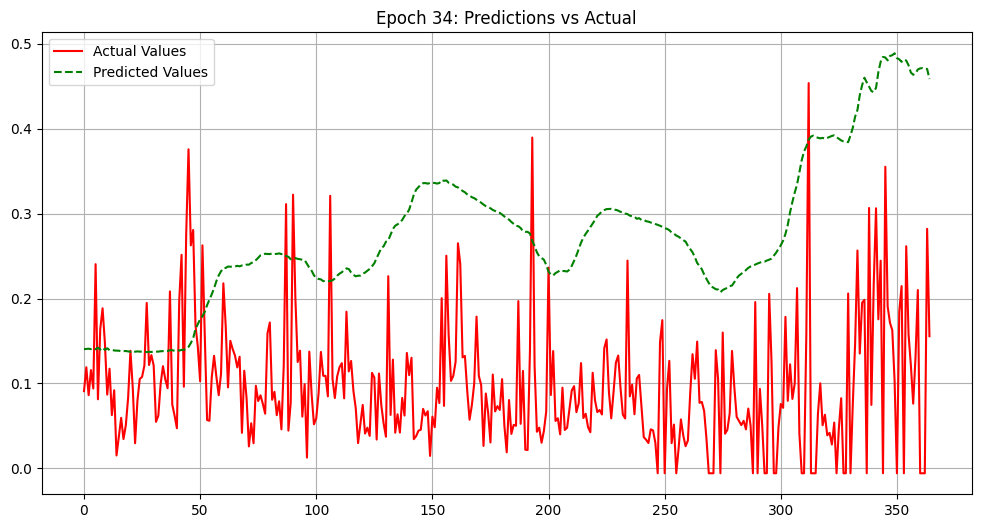

Epoch: 35 Loss: 0.00541476
Loss on test predictions: 0.06023707613348961


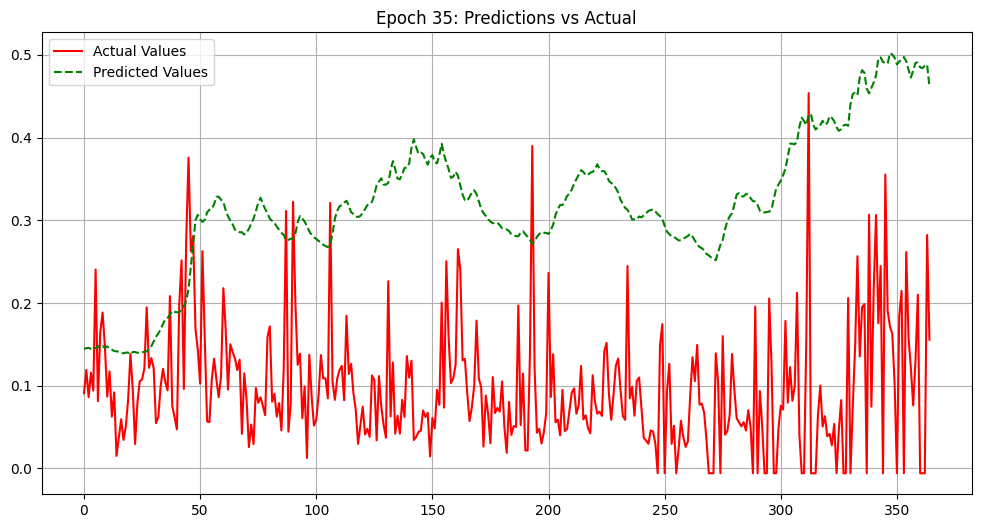

Epoch: 36 Loss: 0.00150872
Loss on test predictions: 0.06801531463861465


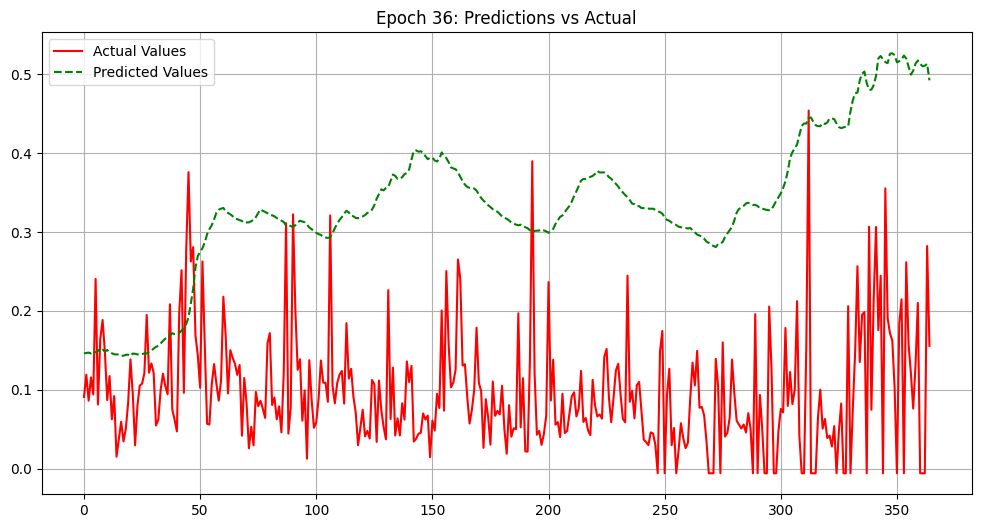

Epoch: 37 Loss: 0.00528270
Loss on test predictions: 0.03464740514755249


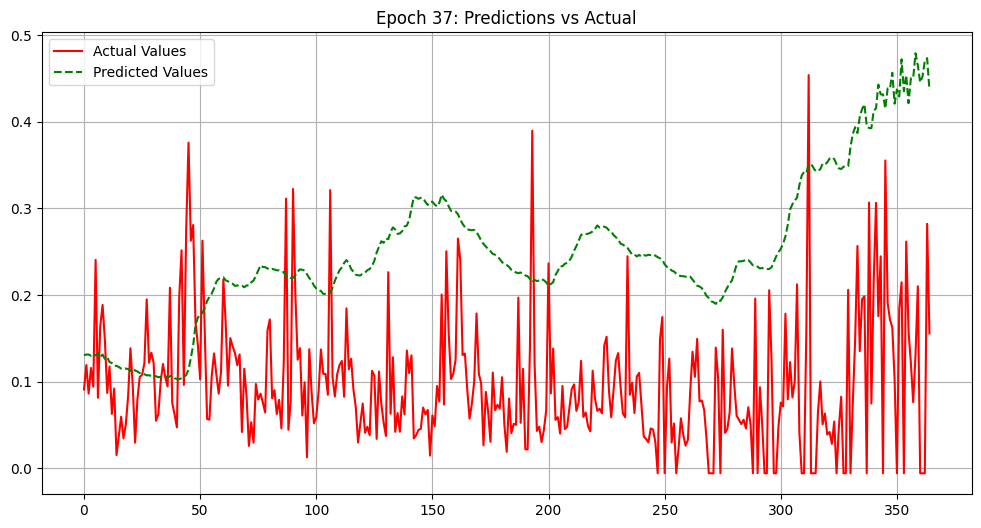

Epoch: 38 Loss: 0.00065547
Loss on test predictions: 0.03347891941666603


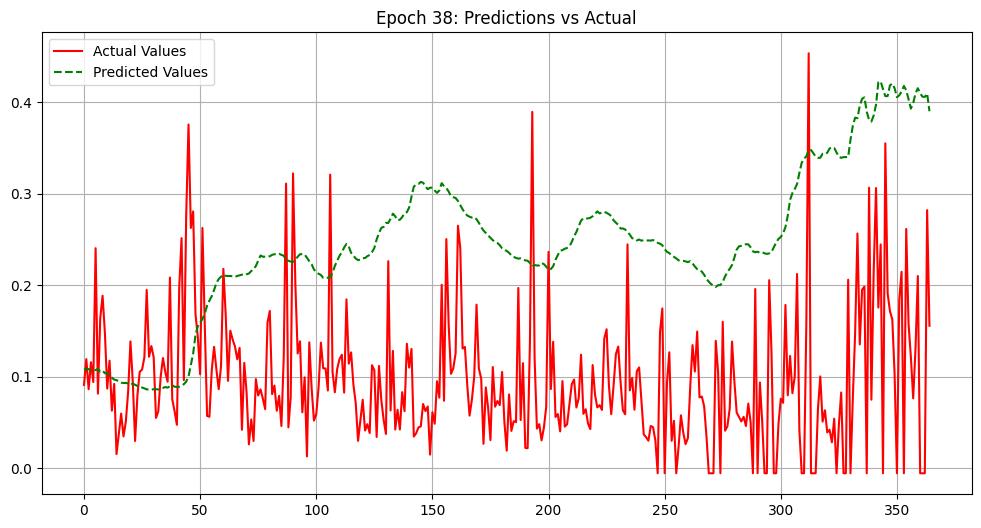

Epoch: 39 Loss: 0.02352649
Loss on test predictions: 0.07208101451396942


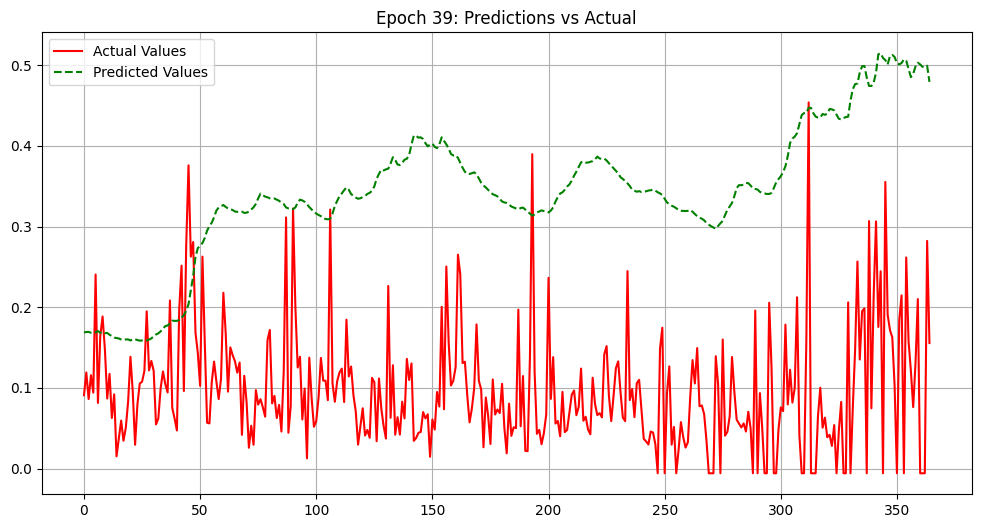

Epoch: 40 Loss: 0.00384921
Loss on test predictions: 0.06609860062599182


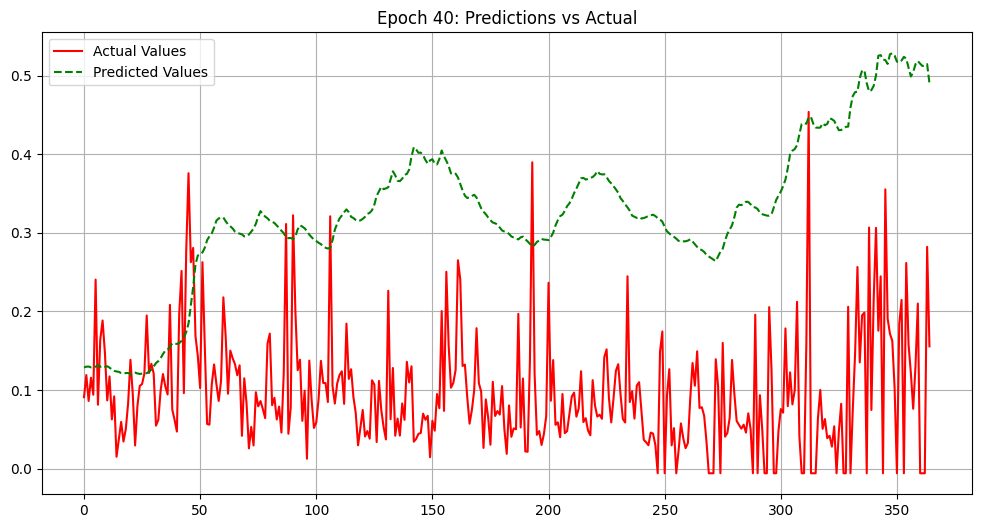

Epoch: 41 Loss: 0.00686943
Loss on test predictions: 0.08925944566726685


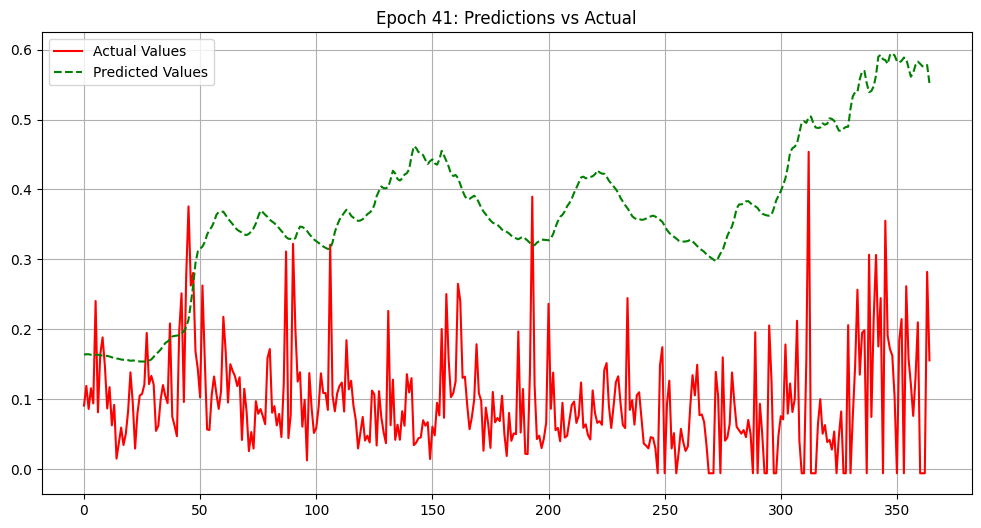

Epoch: 42 Loss: 0.00866750
Loss on test predictions: 0.05646754056215286


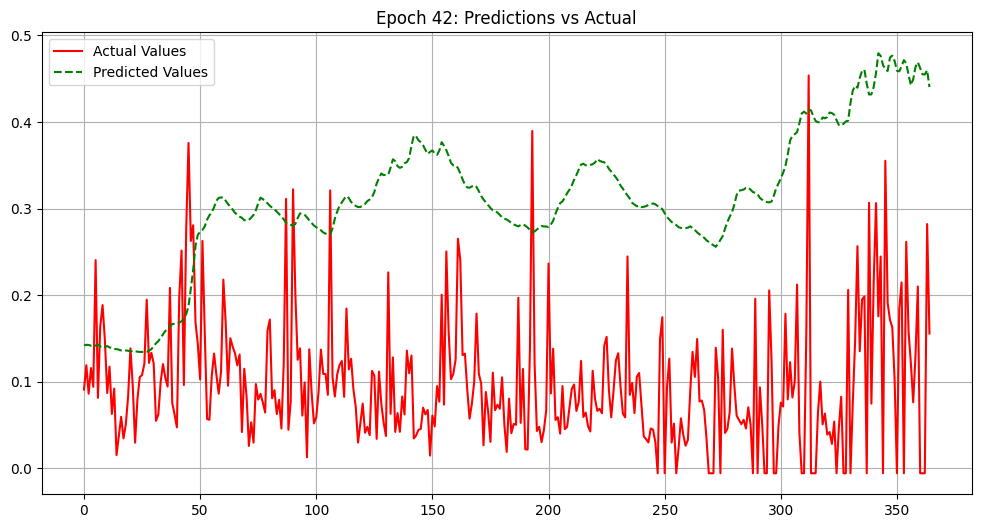

Epoch: 43 Loss: 0.00347634
Loss on test predictions: 0.05945141986012459


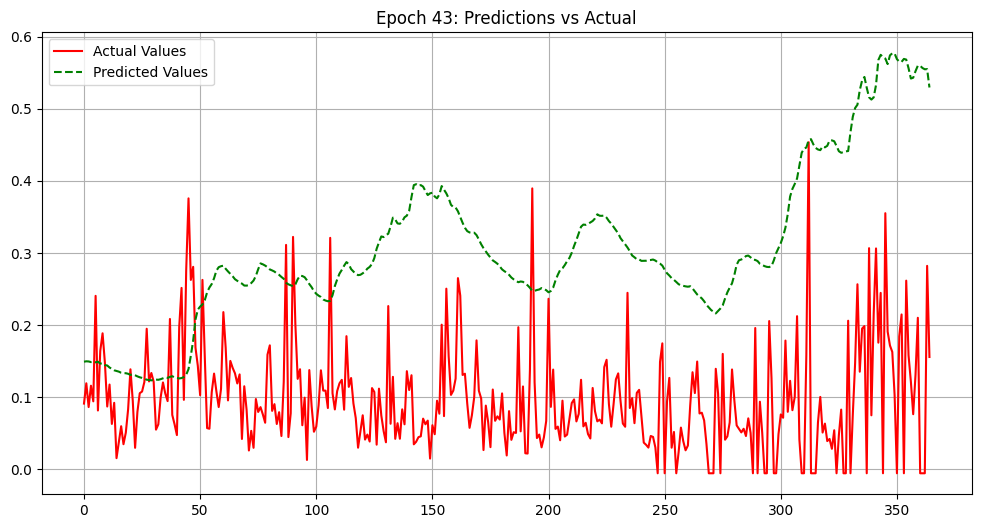

Epoch: 44 Loss: 0.00114894
Loss on test predictions: 0.05260056257247925


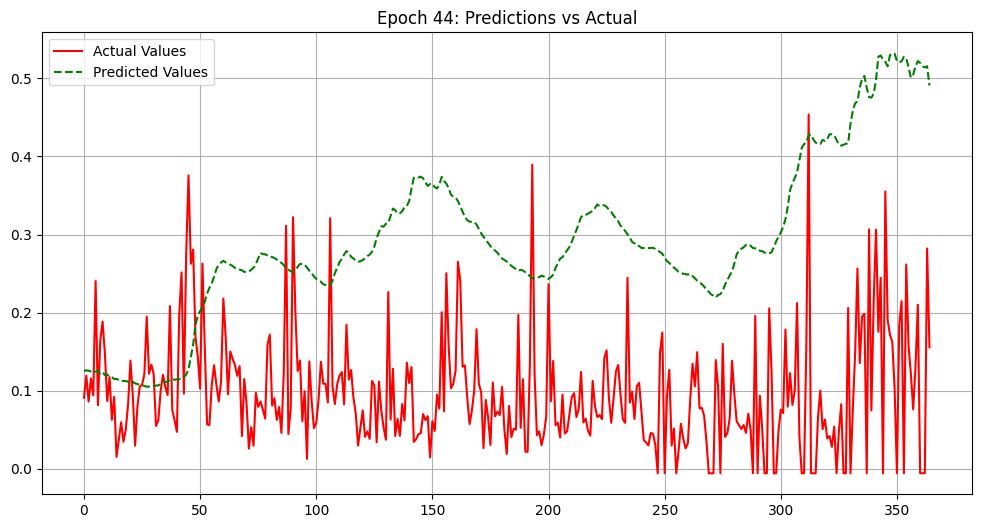

Epoch: 45 Loss: 0.00950446
Loss on test predictions: 0.05146404355764389


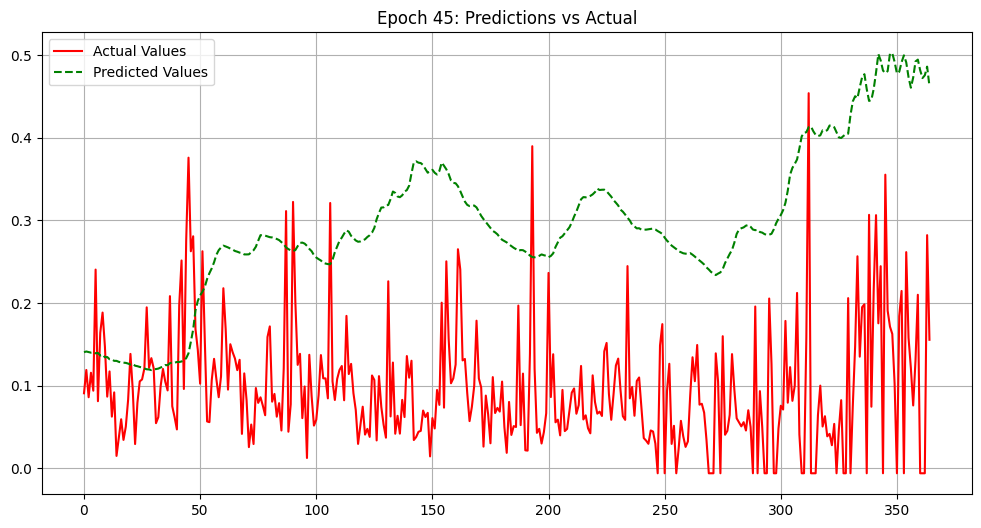

Epoch: 46 Loss: 0.04123370
Loss on test predictions: 0.05958333611488342


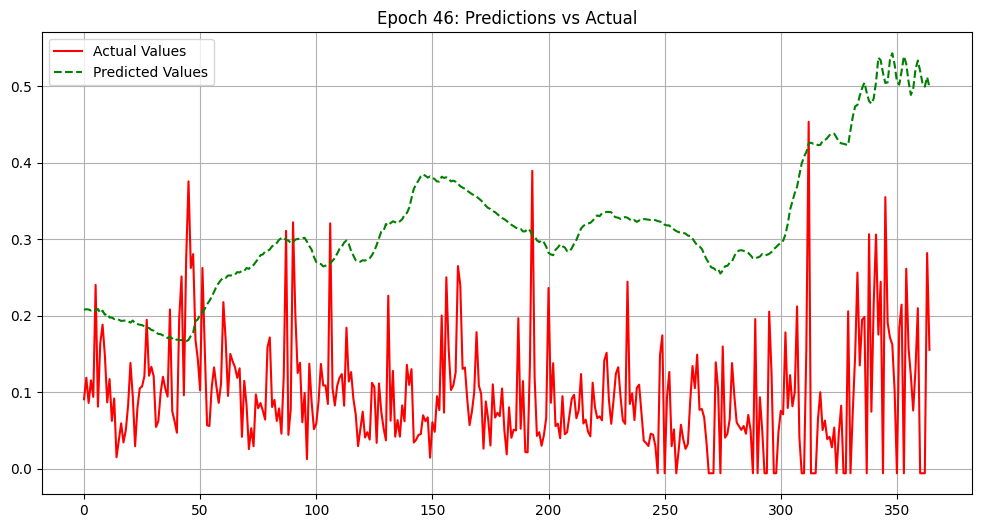

Epoch: 47 Loss: 0.00175225
Loss on test predictions: 0.06092280149459839


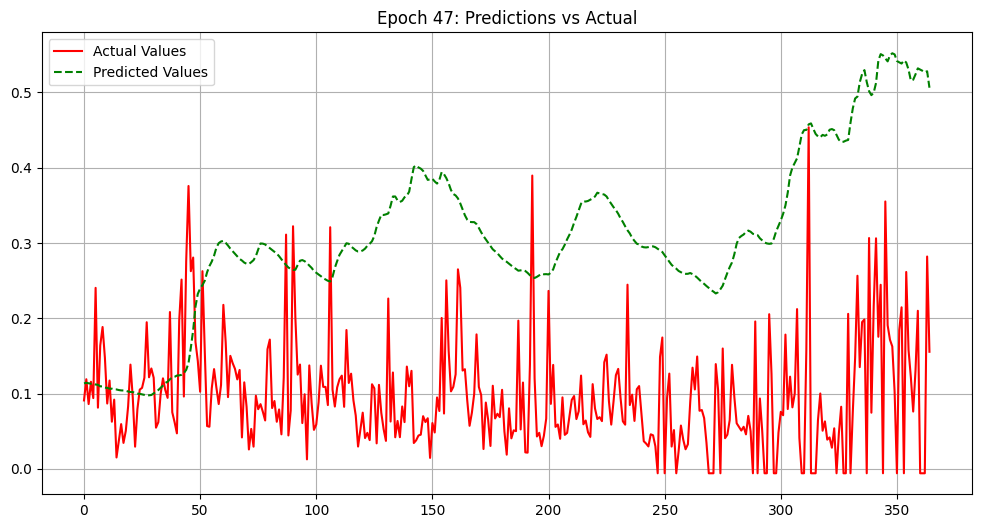

Epoch: 48 Loss: 0.07190607
Loss on test predictions: 0.044582366943359375


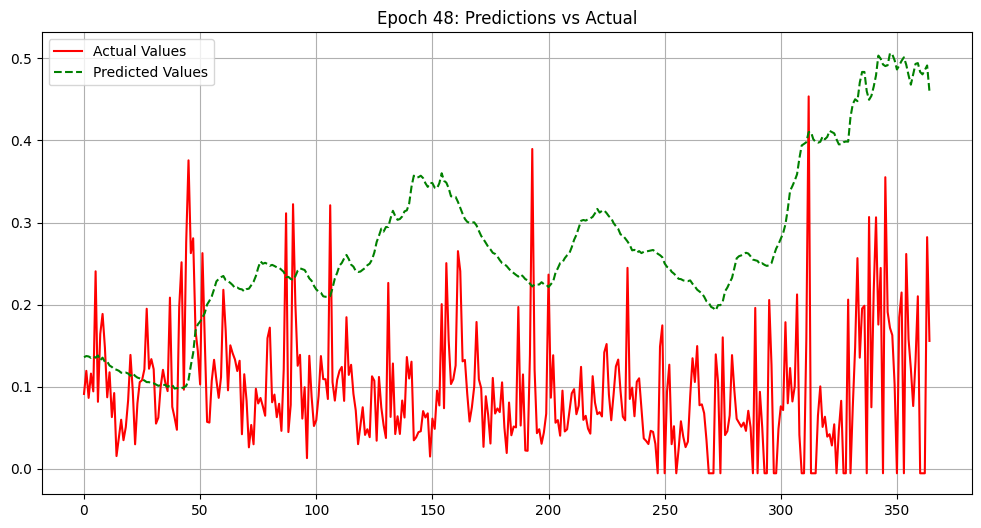

Epoch: 49 Loss: 0.00288195
Loss on test predictions: 0.053603801876306534


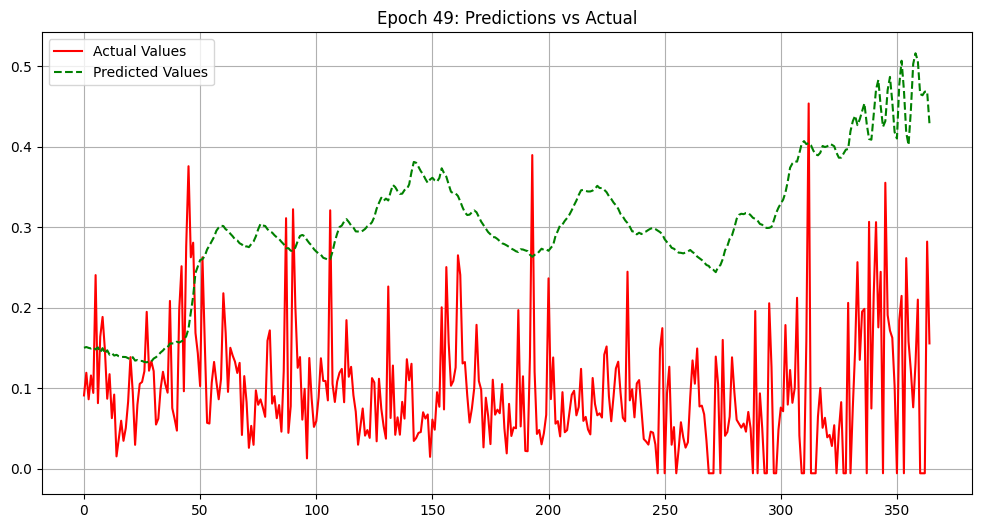

Epoch: 50 Loss: 0.00891708
Loss on test predictions: 0.0629715695977211


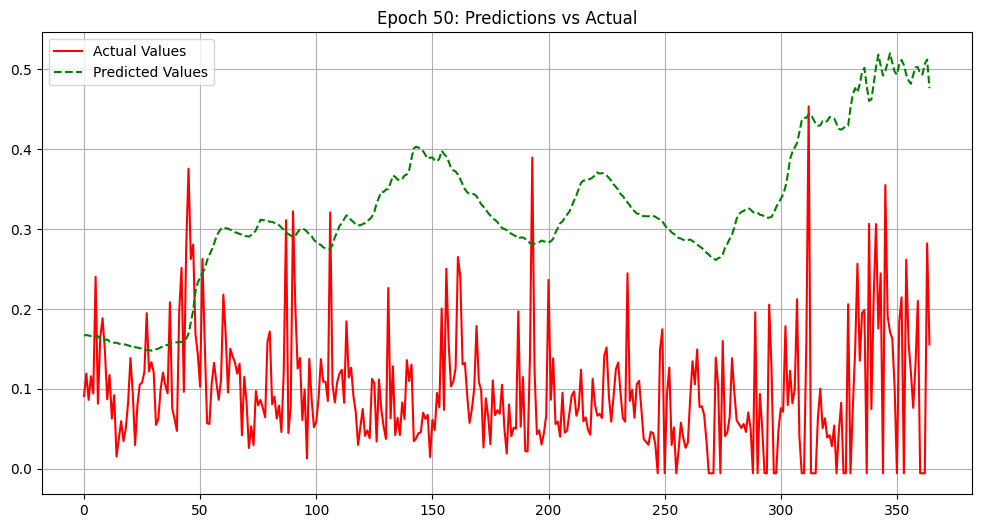

In [72]:
model = GRU()
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

epochs = 50

for i in range(epochs):
    model.train()
    # tuple-unpack the train_data set
    for inputs, labels in train_loader:

        # reset the parameters and hidden states
        optimizer.zero_grad()

        y_pred = model(inputs)

        loss = criterion(y_pred, labels)
        loss.backward()
        optimizer.step()

    # print training result
    print(f'Epoch: {i+1:2} Loss: {loss.item():10.8f}')

    # MAKE PREDICTIONS
    with torch.no_grad():
      model.eval()  # Set the model to evaluation mode

      preds = []  # Use the last sequence for prediction

      for x in test_loader.dataset.tensors[0]:  # Get all test samples
                x_tensor = x.unsqueeze(0)  # Add batch dimension
                pred = model(x_tensor)
                preds.append(pred.item())

    # Get actual values from the test dataset
    actual = test_loader.dataset.tensors[1].numpy().flatten()

    # Calculate loss on test predictions
    test_loss = criterion(torch.tensor(preds).view(-1, 1), test_loader.dataset.tensors[1])
    print(f'Loss on test predictions: {test_loss.item()}')

    #plot
    plt.figure(figsize=(12, 6))
    plt.plot(actual, label='Actual Values', color='red')
    plt.plot(preds, label='Predicted Values', color='green', linestyle='--')
    plt.title(f'Epoch {i + 1}: Predictions vs Actual')
    plt.legend()
    plt.grid()
    plt.show()
